In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.preprocessing import MinMaxScaler
from sklearn.feature_selection import SelectKBest, mutual_info_classif
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report


from tensorflow.keras.layers import Input, Dense, Lambda, Embedding, Flatten, Concatenate
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
import tensorflow as tf

import time
import psutil
import os

2026-01-15 03:49:29.967933: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1768448970.143154      55 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1768448970.195032      55 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1768448970.607602      55 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1768448970.607640      55 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1768448970.607643      55 computation_placer.cc:177] computation placer alr

In [1]:
from imblearn.over_sampling import SMOTE

In [3]:
df_data = pd.read_csv("/kaggle/input/selected-feature/selected_features.csv")

In [4]:
X = df_data.drop(columns=['Label'])  # Tập đặc trưng
y = df_data['Label']                 # Tập nhãn

In [5]:
# Split function
def split_data(X, y):
    return train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)

In [6]:
X_train, X_test, y_train, y_test = split_data(X, y)

In [7]:
print("Train size:")
print("X_train:", X_train.shape)
print("y_train:", y_train.shape)

print("\nTest size:")
print("X_test:", X_test.shape)
print("y_test:", y_test.shape)

Train size:
X_train: (21440, 13)
y_train: (21440,)

Test size:
X_test: (5360, 13)
y_test: (5360,)


In [8]:
test_df = X_test.copy()
test_df["label"] = y_test.values
test_df.to_csv("test_data.csv", index=False)
print("Đã lưu file test_data.csv")

Đã lưu file test_data.csv


In [7]:
pd.Series(y_train).value_counts()

Label
0    14580
3     2433
6     1744
1     1573
5     1004
2       77
4       29
Name: count, dtype: int64

# Hàm tạo sinh với VAE

In [7]:
import numpy as np
import tensorflow as tf
from tensorflow.keras import Model, Input
from tensorflow.keras.layers import Dense, Lambda
from tensorflow.keras.optimizers import Adam
from itertools import product
from scipy.stats import entropy, wasserstein_distance
from sklearn.preprocessing import MinMaxScaler
import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from scipy.stats import wasserstein_distance, entropy


def train_vae(X_train, params):
    if not isinstance(X_train, np.ndarray):
        X_train = X_train.to_numpy()

    # ----------------------------
    # Chuẩn hóa dữ liệu
    # ----------------------------
    scaler = MinMaxScaler(feature_range=(0, 1))
    X_train = scaler.fit_transform(X_train)

    input_dim = X_train.shape[1]
    latent_dim = params.get('latent_dim', 8)
    lr = params.get('learning_rate', 0.0005)
    epochs = params.get('epochs', 50)
    batch_size = params.get('batch_size', 64)
    beta = params.get('beta', 0.2)  # hệ số KL loss

    # ----------------------------
    # 1) Encoder
    # ----------------------------
    encoder_inputs = keras.Input(shape=(input_dim,))
    x = layers.Dense(64)(encoder_inputs)
    x = layers.LeakyReLU(alpha=0.1)(x)
    x = layers.Dense(32)(x)
    x = layers.LeakyReLU(alpha=0.1)(x)

    z_mean = layers.Dense(latent_dim, name='z_mean')(x)
    z_log_var = layers.Dense(latent_dim, name='z_log_var')(x)

    def sampling(args):
        z_mean, z_log_var = args
        epsilon = tf.random.normal(shape=(tf.shape(z_mean)[0], latent_dim))
        return z_mean + tf.exp(0.5 * z_log_var) * epsilon

    z = layers.Lambda(sampling, name='z')([z_mean, z_log_var])
    encoder = keras.Model(encoder_inputs, [z_mean, z_log_var, z], name='encoder')

    # ----------------------------
    # 2) Decoder
    # ----------------------------
    latent_inputs = keras.Input(shape=(latent_dim,))
    x = layers.Dense(32)(latent_inputs)
    x = layers.LeakyReLU(alpha=0.1)(x)
    x = layers.Dense(64)(x)
    x = layers.LeakyReLU(alpha=0.1)(x)
    decoder_outputs = layers.Dense(input_dim, activation='sigmoid')(x)
    decoder = keras.Model(latent_inputs, decoder_outputs, name='decoder')

    # ----------------------------
    # 3) VAE
    # ----------------------------
    class VAE(keras.Model):
        def __init__(self, encoder, decoder, input_dim, beta=0.1, **kwargs):
            super(VAE, self).__init__(**kwargs)
            self.encoder = encoder
            self.decoder = decoder
            self.input_dim = input_dim
            self.beta = beta

        def train_step(self, data):
            if isinstance(data, tuple):
                data = data[0]

            with tf.GradientTape() as tape:
                z_mean, z_log_var, z = self.encoder(data)
                reconstruction = self.decoder(z)

                reconstruction_loss = tf.reduce_mean(keras.losses.mse(data, reconstruction))
                kl_loss = -0.5 * tf.reduce_mean(
                    tf.reduce_sum(1 + z_log_var - tf.square(z_mean) - tf.exp(z_log_var), axis=1)
                )
                total_loss = reconstruction_loss + self.beta * kl_loss

            grads = tape.gradient(total_loss, self.trainable_weights)
            self.optimizer.apply_gradients(zip(grads, self.trainable_weights))

            return {
                "loss": total_loss,
                "reconstruction_loss": reconstruction_loss,
                "kl_loss": kl_loss
            }

        def call(self, inputs):
            z_mean, z_log_var, z = self.encoder(inputs)
            reconstruction = self.decoder(z)
            self.add_loss(tf.reduce_mean(keras.losses.mse(inputs, reconstruction)))
            return reconstruction

    vae = VAE(encoder, decoder, input_dim, beta=beta)
    vae.compile(optimizer=keras.optimizers.Adam(learning_rate=lr))
    vae.fit(X_train, X_train, epochs=epochs, batch_size=batch_size, verbose=0)

    # ----------------------------
    # 4) Generate synthetic samples
    # ----------------------------
    z_samples = np.random.normal(size=(len(X_train), latent_dim))
    X_generated = decoder.predict(z_samples, verbose=0)

    # ----------------------------
    # 5) Evaluate generated data
    # ----------------------------
    real_flat = X_train[:1000]
    fake_flat = X_generated[:1000]

    wd = np.mean([wasserstein_distance(real_flat[:, i], fake_flat[:, i]) for i in range(real_flat.shape[1])])
    kl_list = []
    for i in range(real_flat.shape[1]):
        hist_r, _ = np.histogram(real_flat[:, i], bins=40, density=True)
        hist_f, _ = np.histogram(fake_flat[:, i], bins=40, density=True)
        hist_r += 1e-9
        hist_f += 1e-9
        kl_list.append(entropy(hist_r, hist_f))
    kl_div = np.mean(kl_list)

    return {
        "encoder": encoder,
        "decoder": decoder,
        "vae": vae,
        "generated_data": X_generated,
        "wasserstein_distance": wd,
        "kl_divergence": kl_div,
        "scaler": scaler,
        "X_train_scaled": X_train
    }

def grid_search_vae(X_train, param_grid):
    keys = list(param_grid.keys())
    all_params = list(product(*param_grid.values()))
    results = []
    best_score = float("inf")
    best_result = None

    print(f"🔍 Tổng số tổ hợp cần chạy: {len(all_params)}\n")
    for i, values in enumerate(all_params):
        params = dict(zip(keys, values))
        print(f"🔹 Chạy tổ hợp {i+1}/{len(all_params)}: {params}")
        res = train_vae(X_train, params)
        wd = res["wasserstein_distance"]
        kl = res["kl_divergence"]
        score = wd + kl
        results.append({**params, "wasserstein_distance": wd, "kl_divergence": kl, "score": score})
        if score < best_score:
            best_score = score
            best_result = {"best_params": params, "best_wd": wd, "best_kl": kl, "best_score": score, "best_model": res}
        print(f"   → WD = {wd:.6f}, KL = {kl:.6f}, SCORE = {score:.6f}\n")

    df_results = pd.DataFrame(results).sort_values("score")
    return best_result, df_results


In [16]:
import warnings
warnings.filterwarnings("ignore")

In [ ]:
param_grid = {
    'latent_dim': [8,16, 32],
    'batch_size': [32, 64],
    'epochs': [100],
    'learning_rate': [0.0005, 0.001]
}
best_result, df_results = grid_search_vae(X_train, param_grid)
print("==== Best VAE ====")
print(best_result["best_params"])
print("WD =", best_result["best_wd"])
print("KL =", best_result["best_kl"])
print("SCORE =", best_result["best_score"])
best_result_to_save = {
    "best_params": best_result["best_params"],
    "best_wd": best_result["best_wd"],
    "best_kl": best_result["best_kl"],
    "best_score": best_result["best_score"]
}
# 4. Show results table
print(df_results)

best_encoder = best_result["best_model"]["encoder"]
best_decoder = best_result["best_model"]["decoder"]
best_vae     = best_result["best_model"]["vae"]

best_encoder.save("best_encoder.keras")
best_decoder.save("best_decoder.keras")
best_vae.build(input_shape=(None, X_train.shape[1]))
best_vae.save_weights("best_vae.weights.h5")
np.save("generated_data.npy", best_result["best_model"]["generated_data"])

import pickle

with open("best_result.pkl", "wb") as f:
    pickle.dump(best_result_to_save, f)

df_results.to_csv("grid_search_results.csv", index=False)

🔍 Tổng số tổ hợp cần chạy: 12

🔹 Chạy tổ hợp 1/12: {'latent_dim': 8, 'batch_size': 32, 'epochs': 100, 'learning_rate': 0.0005}
   → WD = 0.128137, KL = 2.793477, SCORE = 2.921615

🔹 Chạy tổ hợp 2/12: {'latent_dim': 8, 'batch_size': 32, 'epochs': 100, 'learning_rate': 0.001}
   → WD = 0.132003, KL = 2.819510, SCORE = 2.951513

🔹 Chạy tổ hợp 3/12: {'latent_dim': 8, 'batch_size': 64, 'epochs': 100, 'learning_rate': 0.0005}
   → WD = 0.138229, KL = 2.203169, SCORE = 2.341398

🔹 Chạy tổ hợp 4/12: {'latent_dim': 8, 'batch_size': 64, 'epochs': 100, 'learning_rate': 0.001}
   → WD = 0.132474, KL = 4.943496, SCORE = 5.075970

🔹 Chạy tổ hợp 5/12: {'latent_dim': 16, 'batch_size': 32, 'epochs': 100, 'learning_rate': 0.0005}
   → WD = 0.124055, KL = 3.554635, SCORE = 3.678691

🔹 Chạy tổ hợp 6/12: {'latent_dim': 16, 'batch_size': 32, 'epochs': 100, 'learning_rate': 0.001}
   → WD = 0.123160, KL = 2.984329, SCORE = 3.107489

🔹 Chạy tổ hợp 7/12: {'latent_dim': 16, 'batch_size': 64, 'epochs': 100, 'lea

In [10]:
def generate_with_vae(X_class, params=None):
    """
    Train VAE on X_class and generate synthetic samples equal in size to X_class.
    Automatically performs inverse_transform to return data in original space.
    """

    default_params = {
        "latent_dim": 8,
        "learning_rate": 0.0005,
        "epochs": 100,
        "batch_size": 64,
        "beta": 0.2
    }

    if params is None:
        params = default_params
    else:
        for k, v in default_params.items():
            params.setdefault(k, v)

    # Train VAE
    res = train_vae(X_class, params)
    encoder = res["encoder"]
    decoder = res["decoder"]
    scaler = res["scaler"]          
    X_train_scaled = res["X_train_scaled"]

    
    z_mean, z_log_var, _ = encoder.predict(X_train_scaled, verbose=0)

    epsilon = np.random.normal(size=z_mean.shape)
    z_samples = z_mean + np.exp(0.5 * z_log_var) * epsilon

    # Decode
    X_generated_norm = decoder.predict(z_samples, verbose=0)

    # Inverse scale
    X_generated = scaler.inverse_transform(X_generated_norm)

    return X_generated


# Hàm tạo sinh với SMOTE

In [13]:
# SMOTE
def generate_with_smote(X_train, y_train):
    sm = SMOTE(random_state=42)
    return sm.fit_resample(X_train, y_train)


# Hàm tạo sinh với CGAN

In [14]:
import numpy as np
import tensorflow as tf
from tensorflow.keras import Model, Input
from tensorflow.keras.layers import Dense, LeakyReLU, Dropout, BatchNormalization, Embedding, Flatten, Concatenate, GaussianNoise
from tensorflow.keras.optimizers import Adam
from sklearn.preprocessing import MinMaxScaler
from scipy.stats import wasserstein_distance

# ------- architecture helpers -------
def build_generator(latent_dim, num_classes, feature_dim, embedding_dim=16):
    noise = Input(shape=(latent_dim,), name="g_noise")
    label = Input(shape=(1,), dtype='int32', name="g_label")

    # embedding then project
    label_emb = Embedding(num_classes, embedding_dim)(label)
    label_emb = Flatten()(label_emb)
    label_proj = Dense(latent_dim, activation='linear')(label_emb)

    merged = Concatenate()([noise, label_proj])

    x = Dense(256)(merged)
    x = LeakyReLU(0.2)(x)
    x = BatchNormalization()(x)

    x = Dense(512)(x)
    x = LeakyReLU(0.2)(x)
    x = BatchNormalization()(x)

    x = Dense(256)(x)
    x = LeakyReLU(0.2)(x)
    x = BatchNormalization()(x)

    x = Dense(128)(x)
    x = LeakyReLU(0.2)(x)

    output = Dense(feature_dim, activation="sigmoid")(x)
    return Model([noise, label], output, name="Generator")


def build_discriminator(num_classes, feature_dim, embedding_dim=16):
    data_input = Input(shape=(feature_dim,), name="d_data")
    label = Input(shape=(1,), dtype='int32', name="d_label")

    # add small gaussian noise layer to inputs (helps stability)
    x = GaussianNoise(0.02)(data_input)

    # label embedding + project
    label_emb = Embedding(num_classes, embedding_dim)(label)
    label_emb = Flatten()(label_emb)
    label_proj = Dense(feature_dim, activation='linear')(label_emb)

    # concat data + label projection
    merged = Concatenate()([x, label_proj])

    x = Dense(256)(merged)
    x = LeakyReLU(0.2)(x)
    x = Dropout(0.2)(x)

    x = Dense(256)(x)
    x = LeakyReLU(0.2)(x)
    x = Dropout(0.2)(x)

    x = Dense(128)(x)
    x = LeakyReLU(0.2)(x)

    output = Dense(1, activation="sigmoid")(x)
    return Model([data_input, label], output, name="Discriminator")


# ------- improved training loop -------
def train_cgan(X_raw, y_raw, params):
    # params: latent_dim, epochs, batch_size, n_critic, embedding_dim
    X = np.asarray(X_raw)
    y = np.asarray(y_raw).astype(int)

    # scale to [0,1]
    scaler = MinMaxScaler()
    X = scaler.fit_transform(X)

    feature_dim = X.shape[1]
    num_classes = len(np.unique(y))

    latent_dim = params.get('latent_dim', 64)
    epochs = params.get('epochs', 500)
    batch_size = params.get('batch_size', 32)
    n_critic = params.get('n_critic', 2)                # train D n_critic times per G update
    embedding_dim = params.get('embedding_dim', 16)

    # build models
    generator = build_generator(latent_dim, num_classes, feature_dim, embedding_dim)
    discriminator = build_discriminator(num_classes, feature_dim, embedding_dim)

    # optimizers
    d_optimizer = Adam(learning_rate=0.0002, beta_1=0.5)
    g_optimizer = Adam(learning_rate=0.0001, beta_1=0.5)

    discriminator.compile(loss='binary_crossentropy',
                          optimizer=d_optimizer, metrics=['accuracy'])

    # Combined (G training via frozen D)
    noise = Input(shape=(latent_dim,))
    label = Input(shape=(1,), dtype='int32')
    fake = generator([noise, label])
    discriminator.trainable = False
    validity = discriminator([fake, label])

    combined = Model([noise, label], validity)
    combined.compile(loss='binary_crossentropy', optimizer=g_optimizer)

    # trackers
    g_losses, d_losses = [], []

    steps_per_epoch = max(1, X.shape[0] // batch_size)

    for epoch in range(epochs):
        d_epoch_losses = []
        g_epoch_losses = []

        for step in range(steps_per_epoch):
            # Train discriminator n_critic times
            for _ in range(n_critic):
                # sample real
                idx = np.random.randint(0, X.shape[0], batch_size)
                real_data = X[idx]
                real_labels = y[idx]

                # sample fake
                noise_sample = np.random.normal(0, 1, (batch_size, latent_dim))
                fake_labels = np.random.randint(0, num_classes, size=(batch_size,))
                gen_data = generator.predict([noise_sample, fake_labels], verbose=0)

                # label smoothing + noisy labels
                # real labels in [0.7, 1.0), fake labels in [0.0, 0.3)
                real_y = np.random.uniform(0.7, 1.0, (batch_size, 1))
                fake_y = np.random.uniform(0.0, 0.3, (batch_size, 1))

                # occasionally flip a few labels (helps prevent D overpowering)
                flip_idx = np.random.choice([0, 1], size=(batch_size, 1), p=[0.995, 0.005]).astype(bool)
                real_y[flip_idx] = 0.0  # tiny fraction flipped

                # train on real and fake
                d_loss_real = discriminator.train_on_batch([real_data, real_labels], real_y)
                d_loss_fake = discriminator.train_on_batch([gen_data, fake_labels], fake_y)

                d_batch_loss = 0.5 * (d_loss_real[0] + d_loss_fake[0])
                d_epoch_losses.append(d_batch_loss)

            # Train generator (1 step)
            noise_sample = np.random.normal(0, 1, (batch_size, latent_dim))
            sampled_labels = np.random.randint(0, num_classes, size=(batch_size,))
            # want D to predict ~1 for generated
            trick = np.ones((batch_size, 1)) * 0.9
            g_loss = combined.train_on_batch([noise_sample, sampled_labels], trick)
            g_epoch_losses.append(g_loss)

        # record epoch losses
        d_loss_epoch = float(np.mean(d_epoch_losses)) if len(d_epoch_losses) else 0.0
        g_loss_epoch = float(np.mean(g_epoch_losses)) if len(g_epoch_losses) else 0.0
        d_losses.append(d_loss_epoch)
        g_losses.append(g_loss_epoch)

        # logging
        if epoch % 5 == 0 or epoch == epochs - 1:
            print(f"Epoch {epoch+1}/{epochs} | D loss: {d_loss_epoch:.4f} | G loss: {g_loss_epoch:.4f}")

        # optional small LR decay
        if (epoch+1) % 100 == 0:
            old_lr = tf.keras.backend.get_value(d_optimizer.learning_rate)
            tf.keras.backend.set_value(d_optimizer.learning_rate, old_lr * 0.9)
            old_lr_g = tf.keras.backend.get_value(g_optimizer.learning_rate)
            tf.keras.backend.set_value(g_optimizer.learning_rate, old_lr_g * 0.95)

    # generate synthetic dataset balanced by original class counts
    X_gen_parts = []
    y_gen_parts = []
    for lab in np.unique(y):
        count = int(np.sum(y == lab))
        noise_sample = np.random.normal(0, 1, (count, latent_dim))
        labels = np.full((count,), lab)
        data = generator.predict([noise_sample, labels], verbose=0)
        X_gen_parts.append(data)
        y_gen_parts.append(labels)

    X_gen = np.vstack(X_gen_parts)
    y_gen = np.concatenate(y_gen_parts)

    # evaluate quick metrics per-feature: mean diff & wasserstein distance
    feature_means_real = X.mean(axis=0)
    feature_means_fake = X_gen.mean(axis=0)
    mean_diff = np.abs(feature_means_real - feature_means_fake)
    wdist = [wasserstein_distance(X[:, i], X_gen[:, i]) for i in range(feature_dim)]

    quick_eval = {
        "mean_diff_per_feature": mean_diff,
        "wasserstein_per_feature": wdist,
        "mean_mean_diff": float(np.mean(mean_diff)),
        "mean_wasserstein": float(np.mean(wdist))
    }

    return {
        "generator": generator,
        "discriminator": discriminator,
        "generated_data": X_gen,
        "generated_labels": y_gen,
        "generator_loss": g_losses,
        "discriminator_loss": d_losses,
        "scaler": scaler,
        "quick_eval": quick_eval
    }


In [48]:
def grid_search_cgan(X_train, y_train, param_grid):
    best_score = float("inf")
    best_params = None
    best_result = None

    from itertools import product
    keys = list(param_grid.keys())
    combinations = list(product(*param_grid.values()))

    print(f"[INFO] Tổng số combinations: {len(combinations)}")

    for combo in combinations:
        params = dict(zip(keys, combo))
        print("\n=====================================")
        print("[INFO] Đang thử params:", params)

        # train nhanh
        result = train_cgan(X_train, y_train, params)

        q = result["quick_eval"]
        score = q["mean_wasserstein"] + q["mean_mean_diff"]

        print("[INFO] Score =", score)

        # update best
        if score < best_score:
            best_score = score
            best_params = params
            best_result = result
            print(">>> cập nhật best params")

    return {
        "best_params": best_params,
        "best_score": best_score,
        "best_result": best_result
    }


In [ ]:
param_grid = {
    "latent_dim": [32, 64],
    "embedding_dim": [8, 16],
    "batch_size": [32],
    "epochs": [30]  # để grid search nhanh
}

grid_result = grid_search_cgan(X_train, y_train, param_grid)

print("Best params:", grid_result["best_params"])

# Lấy generator, discriminator, dữ liệu sinh ra
generator = result['generator']
discriminator = result['discriminator']
X_gen = result['generated_data']
y_gen = result['generated_labels']

# Sau khi train CGAN
generator = result['generator']
discriminator = result['discriminator']
X_gen = result['generated_data']
y_gen = result['generated_labels']

# 1. Lưu model
generator.save("cgan_generator.keras")
discriminator.save("cgan_discriminator.keras")

# 2. Lưu weights
generator.save_weights("cgan_generator.weights.h5")
discriminator.save_weights("cgan_discriminator.weights.h5")

# 3. Lưu data sinh ra
np.save("cgan_generated_X.npy", X_gen)
np.save("cgan_generated_y.npy", y_gen)

# 4. Lưu tham số
import json
with open("cgan_params.json", "w") as f:
    json.dump(params, f, indent=4)

[INFO] Tổng số combinations: 4

[INFO] Đang thử params: {'latent_dim': 32, 'embedding_dim': 8, 'batch_size': 32, 'epochs': 30}
Epoch 1/30 | D loss: 0.6957 | G loss: 0.6846
Epoch 6/30 | D loss: 0.7097 | G loss: 0.6642
Epoch 11/30 | D loss: 0.7106 | G loss: 0.6628
Epoch 16/30 | D loss: 0.7109 | G loss: 0.6623
Epoch 21/30 | D loss: 0.7111 | G loss: 0.6621
Epoch 26/30 | D loss: 0.7112 | G loss: 0.6619
Epoch 30/30 | D loss: 0.7112 | G loss: 0.6618
[INFO] Score = 0.9744047124077473
>>> cập nhật best params

[INFO] Đang thử params: {'latent_dim': 32, 'embedding_dim': 16, 'batch_size': 32, 'epochs': 30}
Epoch 1/30 | D loss: 0.7200 | G loss: 0.6309
Epoch 6/30 | D loss: 0.7420 | G loss: 0.6020
Epoch 11/30 | D loss: 0.7432 | G loss: 0.6004
Epoch 16/30 | D loss: 0.7436 | G loss: 0.5999
Epoch 21/30 | D loss: 0.7438 | G loss: 0.5996
Epoch 26/30 | D loss: 0.7440 | G loss: 0.5994
Epoch 30/30 | D loss: 0.7440 | G loss: 0.5993
[INFO] Score = 1.228097183744311

[INFO] Đang thử params: {'latent_dim': 64, 

NameError: name 'result' is not defined

In [15]:
def generate_with_cgan(X_cls, y_cls, num_samples, latent_dim=64, epochs=100, batch_size=32):
    """
    CGAN đơn-class: huấn luyện trên X_cls và sinh ra num_samples mẫu mới.
    Tương thích với augment_to_ratio_total_balanced().
    """

    # ----------- Chuẩn hóa dữ liệu -------------
    scaler = MinMaxScaler()
    X_scaled = scaler.fit_transform(X_cls)

    class_value = int(np.unique(y_cls)[0])     # ví dụ: 2, 4, 5...
    num_classes = 1                             # vì CGAN một class

    # ----------- Build Generator ---------------
    noise_input = Input(shape=(latent_dim,))
    label_input = Input(shape=(1,), dtype='int32')

    label_emb = Embedding(num_classes, latent_dim)(label_input)
    label_emb = Flatten()(label_emb)

    merged = Concatenate()([noise_input, label_emb])

    x = Dense(128, activation='relu')(merged)
    x = Dense(256, activation='relu')(x)
    out = Dense(X_cls.shape[1], activation='sigmoid')(x)

    generator = Model([noise_input, label_input], out)

    # ----------- Build Discriminator -----------
    data_input = Input(shape=(X_cls.shape[1],))
    label_input_d = Input(shape=(1,), dtype='int32')

    label_emb_d = Embedding(num_classes, X_cls.shape[1])(label_input_d)
    label_emb_d = Flatten()(label_emb_d)

    merged_d = Concatenate()([data_input, label_emb_d])

    d = Dense(256, activation='relu')(merged_d)
    d = Dense(128, activation='relu')(d)
    out_d = Dense(1, activation='sigmoid')(d)

    discriminator = Model([data_input, label_input_d], out_d)
    discriminator.compile(loss='binary_crossentropy', optimizer=Adam(0.0002, 0.5))

    # ----------- Build Combined Model ----------
    discriminator.trainable = False
    noise = Input(shape=(latent_dim,))
    label = Input(shape=(1,), dtype='int32')
    generated = generator([noise, label])
    valid = discriminator([generated, label])

    combined = Model([noise, label], valid)
    combined.compile(loss='binary_crossentropy', optimizer=Adam(0.0002, 0.5))

    # ----------- Training Loop -----------------
    for epoch in range(epochs):

        # Train discriminator
        idx = np.random.randint(0, X_scaled.shape[0], batch_size)
        real_samples = X_scaled[idx]
        real_labels = np.zeros((batch_size, 1))   # class index = 0

        noise_vec = np.random.normal(0, 1, (batch_size, latent_dim))
        fake_samples = generator.predict([noise_vec, real_labels])

        d_loss_real = discriminator.train_on_batch([real_samples, real_labels], np.ones((batch_size, 1)))
        d_loss_fake = discriminator.train_on_batch([fake_samples, real_labels], np.zeros((batch_size, 1)))

        # Train generator
        noise_vec = np.random.normal(0, 1, (batch_size, latent_dim))
        g_loss = combined.train_on_batch([noise_vec, real_labels], np.ones((batch_size, 1)))

    # ----------- Generate New Samples ----------
    noise_vec = np.random.normal(0, 1, (num_samples, latent_dim))
    labels_vec = np.zeros((num_samples, 1))   # luôn = 0 trong CGAN đơn-class

    gen_data = generator.predict([noise_vec, labels_vec])
    gen_data = scaler.inverse_transform(gen_data)

    return gen_data, np.full(num_samples, class_value), generator


# Hàm vẽ biểu đồ các lớp sau khi tạo sinh

In [16]:
from collections import Counter
def plot_class_distributions(original_counts, after_counts, text="Augmentation"):
    """
    Vẽ biểu đồ phân phối lớp trước và sau khi tăng cường dữ liệu.

    Parameters:
    - original_counts: Counter object, phân phối lớp trước khi tăng cường.
    - after_counts: Counter object, phân phối lớp sau khi tăng cường.
    - text: str, chuỗi bổ sung vào tiêu đề biểu đồ tròn (mặc định là "Augmentation").
    """
    fig, ax = plt.subplots(1, 3, figsize=(18, 6))

    # Biểu đồ cột - trước khi tăng cường
    ax[0].bar(original_counts.keys(), original_counts.values(), color='skyblue')
    ax[0].set_title('Phân phối trước khi tăng cường')
    ax[0].set_xlabel('Lớp')
    ax[0].set_ylabel('Số lượng mẫu')

    # Biểu đồ cột - sau khi tăng cường
    ax[1].bar(after_counts.keys(), after_counts.values(), color='lightgreen')
    ax[1].set_title('Phân phối sau khi tăng cường')
    ax[1].set_xlabel('Lớp')
    ax[1].set_ylabel('Số lượng mẫu')

    # Biểu đồ tròn - sau khi tăng cường
    total_after = sum(after_counts.values())
    class0_after = after_counts.get(0, 0)
    other_after = total_after - class0_after

    labels = ['Class 0 (Bình thường)', 'Classes tấn công']
    sizes = [class0_after / total_after * 100, other_after / total_after * 100]
    explode = (0.05, 0)

    ax[2].pie(sizes, labels=labels, autopct='%1.1f%%', colors=['#80c0ff', '#f08080'], startangle=90, explode=explode)
    ax[2].set_title(f'Tỷ lệ lớp bình thường và tấn công (sau {text})')

    plt.tight_layout()
    plt.show()

# Hàm tạo sinh

In [17]:
from collections import Counter
import numpy as np
import pandas as pd

def augment_to_ratio_total_balanced(X_train, y_train, target_ratio=1, method='cgan', text="Augmentation"):
    original_counts = Counter(y_train)
    print("[INFO] Phân phối ban đầu:", original_counts)

    # Ensure y_train is a Pandas Series or NumPy array
    if isinstance(y_train, pd.Series):
        y_train_np = y_train.values
    else:
        y_train_np = np.array(y_train)

    # Select normal and attack samples
    X_normal = X_train.loc[y_train == 0].values if isinstance(X_train, pd.DataFrame) else X_train[y_train_np == 0]
    X_attack = X_train.loc[y_train != 0].values if isinstance(X_train, pd.DataFrame) else X_train[y_train_np != 0]
    y_attack = y_train_np[y_train_np != 0]
    unique_attack_classes, counts = np.unique(y_attack, return_counts=True)
    count_dict = dict(zip(unique_attack_classes, counts))

    num_normal = len(X_normal)
    num_attack = len(X_attack)
    target_total_attack = target_ratio * num_normal
    num_to_generate = int(target_total_attack - num_attack)

    print(f"[INFO] Số mẫu bình thường: {num_normal}")
    print(f"[INFO] Tổng số mẫu tấn công hiện có: {num_attack}")
    print(f"[INFO] Cần sinh thêm tổng cộng: {num_to_generate} mẫu tấn công")

    if num_to_generate <= 0:
        print("[INFO] Dữ liệu đã đủ. Không cần sinh thêm.")
        plot_class_distributions(original_counts, original_counts, text=text)
        return X_train, y_train

    if method == 'smote':
        sampling_strategy = {}

        # phân bổ đều cho các class attack
        per_class = num_to_generate // len(unique_attack_classes)

        for cls in unique_attack_classes:
            current = count_dict.get(cls, 0)
            new_target = current + per_class
            sampling_strategy[cls] = new_target
            print(f"[INFO] Lớp {cls}: {current} → {new_target}")

        smote = SMOTE(sampling_strategy=sampling_strategy, random_state=42, k_neighbors=1)
        X_res, y_res = smote.fit_resample(X_attack, y_attack)

        n_gen = len(X_res) - len(X_attack)
        X_gen = X_res[-n_gen:]
        y_gen = y_res[-n_gen:]

        X_aug = np.vstack([X_train.values if isinstance(X_train, pd.DataFrame) else X_train, X_gen])
        y_aug = np.hstack([y_train_np, y_gen])

    else:
        per_class_gen = num_to_generate // len(unique_attack_classes)
        X_gen_list, y_gen_list = [], []

        for cls in unique_attack_classes:
            X_cls = X_train.loc[y_train == cls].values if isinstance(X_train, pd.DataFrame) else X_train[y_train_np == cls]
            n_gen = per_class_gen

            print(f"[INFO] Lớp {cls}: Có {len(X_cls)}, cần sinh thêm {n_gen}")

            if len(X_cls) == 0:
                print(f"[WARNING] Lớp {cls} không có mẫu, bỏ qua.")
                continue

            if method == 'vae':
                X_gen_chunks = []
                total_generated = 0
                while total_generated < n_gen:
                    samples = generate_with_vae(X_cls)  # Placeholder: implement this function
                    X_gen_chunks.append(samples)
                    total_generated += len(samples)
                X_gen = np.vstack(X_gen_chunks)[:n_gen]
                y_gen = np.full(n_gen, cls)  # Define y_gen for the class

            elif method == 'cgan':
                X_gen, y_gen, _ = generate_with_cgan(X_cls, np.full(len(X_cls), cls), num_samples=n_gen)
                y_gen = np.full(n_gen, cls)  # Ensure correct label

            else:
                raise ValueError(f"Phương pháp không hợp lệ: {method}")

            X_gen_list.append(X_gen)
            y_gen_list.append(y_gen)

        X_aug = np.vstack([X_train.values if isinstance(X_train, pd.DataFrame) else X_train] + X_gen_list)
        y_aug = np.hstack([y_train_np] + y_gen_list)

    after_counts = Counter(y_aug)
    print("[INFO] Phân phối nhãn sau khi tăng cường:", after_counts)

    if isinstance(X_train, pd.DataFrame):
        X_aug = pd.DataFrame(X_aug, columns=X_train.columns)
        y_aug = pd.Series(y_aug, index=range(len(y_aug)))

    plot_class_distributions(original_counts, after_counts, text=text)

        # Lưu dữ liệu tạo sinh thành file CSV riêng
    save_df = X_aug.copy()
    save_df['label'] = y_aug
    filename = f"generated_{method}_{target_ratio}.csv"
    # Ghép đường dẫn
    save_path = os.path.join("/kaggle/input/", filename)
    save_df.to_csv(filename, index=False)
    print(f"[INFO] Đã lưu dữ liệu tạo sinh vào file: {filename}")


    return X_aug, y_aug

# Random Forest

In [18]:
import time
import numpy as np
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import (
    accuracy_score, f1_score, precision_score, recall_score,
    roc_curve, auc, roc_auc_score
)
from sklearn.preprocessing import label_binarize

def train_and_evaluate_rf_epochs(
    X_train, y_train,
    X_test, y_test,
    max_trees=100, step=10, random_state=42
):
    """
    Huấn luyện mô hình RandomForest tăng dần số cây.
    Vẽ biểu đồ Accuracy, Precision, Recall, F1 theo số cây.
    Sau khi train xong, in các chỉ số của mô hình cuối cùng + thời gian train/test + ROC.
    """

    print("\n📊 Phân bố nhãn TRAIN:")
    print(pd.Series(y_train).value_counts().sort_index())

    print("\n📊 Phân bố nhãn TEST:")
    print(pd.Series(y_test).value_counts().sort_index())

    estimators = []
    accs, f1s, precisions, recalls = [], [], [], []

    # Huấn luyện với số cây tăng dần
    for n in range(step, max_trees + 1, step):
        model = RandomForestClassifier(
            n_estimators=n,
            random_state=random_state,
            n_jobs=-1
        )
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)

        accs.append(accuracy_score(y_test, y_pred))
        f1s.append(f1_score(y_test, y_pred, average='macro'))
        precisions.append(
            precision_score(y_test, y_pred, average='macro', zero_division=0)
        )
        recalls.append(recall_score(y_test, y_pred, average='macro'))

        estimators.append(n)

    # Plot metrics
    plt.figure(figsize=(10, 6))
    plt.plot(estimators, accs, label='Accuracy')
    plt.plot(estimators, f1s, label='F1 Score')
    plt.plot(estimators, precisions, label='Precision')
    plt.plot(estimators, recalls, label='Recall')
    plt.xlabel("Số cây (n_estimators)")
    plt.ylabel("Chỉ số")
    plt.title("Hiệu suất mô hình theo số cây Random Forest")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    # Train mô hình cuối cùng
    start_train = time.time()
    final_model = RandomForestClassifier(
        n_estimators=max_trees,
        random_state=random_state,
        n_jobs=-1
    )
    final_model.fit(X_train, y_train)
    train_time = time.time() - start_train

    # Test
    start_test = time.time()
    y_pred_final = final_model.predict(X_test)
    test_time = time.time() - start_test

    # Metrics cuối
    acc_final = accuracy_score(y_test, y_pred_final)
    prec_final = precision_score(y_test, y_pred_final, average='macro', zero_division=0)
    rec_final = recall_score(y_test, y_pred_final, average='macro')
    f1_final = f1_score(y_test, y_pred_final, average='macro')

    print("\n📊 Hiệu suất mô hình cuối cùng:")
    print(f"Accuracy : {acc_final:.4f}")
    print(f"Precision: {prec_final:.4f}")
    print(f"Recall   : {rec_final:.4f}")
    print(f"F1-score : {f1_final:.4f}")
    print(f"⏱️ Thời gian train: {train_time:.4f} giây")
    print(f"⏱️ Thời gian test : {test_time:.4f} giây")

    # >>> NEW: Classification Report
    print("\n📄 Classification Report (Test set):")
    print(classification_report(y_test, y_pred_final, digits=4))

    # ROC Curve
    plt.figure(figsize=(8, 6))
    classes = np.unique(y_train)

    if len(classes) == 2:
        y_prob = final_model.predict_proba(X_test)[:, 1]
        fpr, tpr, _ = roc_curve(y_test, y_prob)
        roc_auc = auc(fpr, tpr)
        plt.plot(fpr, tpr, label=f'ROC curve (AUC = {roc_auc:.4f})')
    else:
        y_test_bin = label_binarize(y_test, classes=classes)
        y_prob = final_model.predict_proba(X_test)

        for i, cls in enumerate(classes):
            fpr, tpr, _ = roc_curve(y_test_bin[:, i], y_prob[:, i])
            roc_auc = auc(fpr, tpr)
            plt.plot(fpr, tpr, lw=1, alpha=0.7,
                     label=f'Class {cls} (AUC = {roc_auc:.4f})')

        plt.plot([0, 1], [0, 1], 'k--', lw=1)

    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve')
    plt.legend(loc='lower right')
    plt.grid(True)
    plt.show()

    return final_model


# XGBoost

In [9]:
from xgboost import XGBClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, roc_curve, auc
import matplotlib.pyplot as plt
import time
import numpy as np
from sklearn.preprocessing import label_binarize
from itertools import cycle

def train_and_evaluate_xgb_epochs(
    X_train, y_train,
    X_test, y_test,
    max_trees=100, step=10, random_state=42
):
    """
    Huấn luyện mô hình XGBoost theo từng bước tăng dần số lượng cây.
    - Vẽ Accuracy / Precision / Recall / F1 theo số cây
    - ROC Curve multi-class (micro / macro)
    - In thời gian train / test
    """

    print("\n📊 Phân bố nhãn TRAIN:")
    print(pd.Series(y_train).value_counts().sort_index())

    print("\n📊 Phân bố nhãn TEST:")
    print(pd.Series(y_test).value_counts().sort_index())

    estimators = []
    accs, f1s, precisions, recalls = [], [], [], []

    # Huấn luyện theo từng bước tăng số cây
    for n in range(step, max_trees + 1, step):
        model = XGBClassifier(
            n_estimators=n,
            random_state=random_state,
            objective="multi:softprob",
            n_jobs=-1,
            eval_metric='mlogloss',
            use_label_encoder=False
        )

        start_train = time.time()
        model.fit(X_train, y_train)
        end_train = time.time()

        start_test = time.time()
        y_pred = model.predict(X_test)
        end_test = time.time()

        accs.append(accuracy_score(y_test, y_pred))
        f1s.append(f1_score(y_test, y_pred, average='macro'))
        precisions.append(
            precision_score(y_test, y_pred, average='macro', zero_division=0)
        )
        recalls.append(recall_score(y_test, y_pred, average='macro'))

        estimators.append(n)

        print(f"[{n} trees] Train: {end_train - start_train:.4f}s | "
              f"Test: {end_test - start_test:.4f}s")

    # Plot metrics theo số cây
    plt.figure(figsize=(10, 6))
    plt.plot(estimators, accs, label='Accuracy')
    plt.plot(estimators, f1s, label='F1 Score')
    plt.plot(estimators, precisions, label='Precision')
    plt.plot(estimators, recalls, label='Recall')
    plt.xlabel("Số cây (n_estimators)")
    plt.ylabel("Chỉ số")
    plt.title("Hiệu suất mô hình theo số cây XGBoost")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    # ===== Mô hình cuối cùng =====
    final_model = model

    start_train_final = time.time()
    final_model.fit(X_train, y_train)
    end_train_final = time.time()

    start_test_final = time.time()
    y_pred_final = final_model.predict(X_test)
    end_test_final = time.time()

    acc_final = accuracy_score(y_test, y_pred_final)
    precision_final = precision_score(y_test, y_pred_final, average='macro', zero_division=0)
    recall_final = recall_score(y_test, y_pred_final, average='macro')
    f1_final = f1_score(y_test, y_pred_final, average='macro')

    print("\n📊 Kết quả mô hình cuối cùng:")
    print(f"Accuracy : {acc_final:.4f}")
    print(f"Precision: {precision_final:.4f}")
    print(f"Recall   : {recall_final:.4f}")
    print(f"F1-score : {f1_final:.4f}")
    print(f"⏱ Thời gian train: {end_train_final - start_train_final:.4f}s")
    print(f"⏱ Thời gian test : {end_test_final - start_test_final:.4f}s")

    # >>> NEW: Classification Report
    print("\n📄 Classification Report (Test set):")
    print(classification_report(y_test, y_pred_final, digits=4))

    # ===== ROC Curve Multi-class =====
    classes = np.unique(y_train)
    y_test_bin = label_binarize(y_test, classes=classes)
    y_score = final_model.predict_proba(X_test)

    fpr = {}
    tpr = {}
    roc_auc = {}

    for i in range(len(classes)):
        fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    # Micro-average
    fpr["micro"], tpr["micro"], _ = roc_curve(
        y_test_bin.ravel(), y_score.ravel()
    )
    roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

    # Macro-average
    all_fpr = np.unique(np.concatenate([fpr[i] for i in range(len(classes))]))
    mean_tpr = np.zeros_like(all_fpr)
    for i in range(len(classes)):
        mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])
    mean_tpr /= len(classes)

    fpr["macro"] = all_fpr
    tpr["macro"] = mean_tpr
    roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

    plt.figure(figsize=(8, 6))
    plt.plot(
        fpr["micro"], tpr["micro"],
        label=f'Micro-average ROC (AUC = {roc_auc["micro"]:.4f})',
        linestyle=':', linewidth=4
    )
    plt.plot(
        fpr["macro"], tpr["macro"],
        label=f'Macro-average ROC (AUC = {roc_auc["macro"]:.4f})',
        linestyle=':', linewidth=4
    )

    colors = cycle(['aqua', 'darkorange', 'cornflowerblue', 'green', 'red', 'purple'])
    for i, color in zip(range(len(classes)), colors):
        plt.plot(
            fpr[i], tpr[i], color=color, lw=2,
            label=f'ROC class {classes[i]} (AUC = {roc_auc[i]:.4f})'
        )

    plt.plot([0, 1], [0, 1], 'k--', lw=2)
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve – Multi-class (XGBoost)')
    plt.legend(loc="lower right")
    plt.grid(True)
    plt.show()

    return final_model


# Hàm vẽ t-sne

In [20]:


def plot_generated_comparison(X_original, y_original,
                              X_smote, y_smote,
                              X_cgan, y_cgan,
                              X_vae, y_vae,
                              method="pca", sample_size=300):
    """
    So sánh dữ liệu gốc với dữ liệu tạo sinh (SMOTE, CGAN, VAE) bằng PCA hoặc t-SNE.
    Mỗi bộ dữ liệu tạo sinh được lấy theo lớp (stratified) sample_size mẫu.
    """

    # Chuyển về numpy nếu là pandas
    def to_numpy(X):
        if isinstance(X, (pd.DataFrame, pd.Series)):
            return X.values
        return np.array(X)

    X_original = to_numpy(X_original)
    y_original = to_numpy(y_original)
    X_smote = to_numpy(X_smote)
    y_smote = to_numpy(y_smote)
    X_cgan = to_numpy(X_cgan)
    y_cgan = to_numpy(y_cgan)
    X_vae = to_numpy(X_vae)
    y_vae = to_numpy(y_vae)

    # Hàm lấy mẫu stratified, trả về số mẫu cố định theo lớp (cố gắng lấy đủ)
    def stratified_sample(X, y, size):
        classes = np.unique(y)
        n_per_class = size // len(classes)
        idx_list = []
        for c in classes:
            idx_c = np.where(y == c)[0]
            # Nếu không đủ mẫu, cho phép lấy mẫu có lặp lại (replace=True)
            chosen = np.random.choice(idx_c, n_per_class, replace=(len(idx_c) < n_per_class))
            idx_list.extend(chosen)
        idx_list = np.array(idx_list)
        return X[idx_list], y[idx_list]

    X_orig_s, y_orig_s = stratified_sample(X_original, y_original, sample_size)
    X_smote_s, y_smote_s = stratified_sample(X_smote, y_smote, sample_size)
    X_cgan_s, y_cgan_s = stratified_sample(X_cgan, y_cgan, sample_size)
    X_vae_s, y_vae_s = stratified_sample(X_vae, y_vae, sample_size)

    # Đảm bảo tất cả có cùng số mẫu (n)
    n = len(X_orig_s)
    for arr in [X_smote_s, y_smote_s, X_cgan_s, y_cgan_s, X_vae_s, y_vae_s]:
        assert len(arr) == n, "Các tập mẫu stratified không cùng kích thước"

    # Gộp dữ liệu để giảm chiều
    all_data = np.vstack([X_orig_s, X_smote_s, X_cgan_s, X_vae_s])

    if method.lower() == "pca":
        reducer = PCA(n_components=2, random_state=42)
        all_2d = reducer.fit_transform(all_data)
    elif method.lower() == "tsne":
        reducer = TSNE(n_components=2, random_state=42, perplexity=30, n_iter=1000)
        all_2d = reducer.fit_transform(all_data)
    else:
        raise ValueError("Phương pháp không hợp lệ, chọn 'pca' hoặc 'tsne'.")

    # Chia lại theo từng tập
    X_orig_2d = all_2d[0:n]
    X_smote_2d = all_2d[n:2*n]
    X_cgan_2d = all_2d[2*n:3*n]
    X_vae_2d = all_2d[3*n:4*n]

    # Vẽ
    fig, axes = plt.subplots(1, 4, figsize=(20, 5))
    titles = ["Original Data", "SMOTE Generated", "CGAN Generated", "VAE Generated"]
    datasets = [
        (X_orig_2d, y_orig_s),
        (X_smote_2d, y_smote_s),
        (X_cgan_2d, y_cgan_s),
        (X_vae_2d, y_vae_s)
    ]

    for ax, (X_2d, y), title in zip(axes, datasets, titles):
        scatter = ax.scatter(X_2d[:, 0], X_2d[:, 1], c=y, cmap='tab10', s=20, alpha=0.8)
        ax.set_title(title)
        ax.set_xticks([])
        ax.set_yticks([])

    # Legend chung
    handles, labels = scatter.legend_elements()
    fig.legend(handles, labels, title="Classes", loc="upper right")

    plt.tight_layout()
    plt.show()


In [22]:
def plot_generated_full(X_original, y_original,
                        X_smote, y_smote,
                        X_cgan, y_cgan,
                        X_vae, y_vae,
                        method="pca"):
    """
    So sánh dữ liệu gốc với dữ liệu tạo sinh (SMOTE, CGAN, VAE) bằng PCA hoặc t-SNE.
    """
    import numpy as np
    import pandas as pd
    import matplotlib.pyplot as plt
    from sklearn.decomposition import PCA
    from sklearn.manifold import TSNE

    # Chuyển về numpy nếu là pandas
    def to_numpy(X):
        if isinstance(X, (pd.DataFrame, pd.Series)):
            return X.values
        return np.array(X)

    X_original, y_original = to_numpy(X_original), to_numpy(y_original)
    X_smote, y_smote = to_numpy(X_smote), to_numpy(y_smote)
    X_cgan, y_cgan = to_numpy(X_cgan), to_numpy(y_cgan)
    X_vae, y_vae = to_numpy(X_vae), to_numpy(y_vae)

    # Gộp dữ liệu
    all_data = np.vstack([X_original, X_smote, X_cgan, X_vae])
    all_y = np.concatenate([y_original, y_smote, y_cgan, y_vae])

    # Giảm chiều
    if method.lower() == "pca":
        reducer = PCA(n_components=2, random_state=42)
        all_2d = reducer.fit_transform(all_data)
    elif method.lower() == "tsne":
        reducer = TSNE(n_components=2, random_state=42, perplexity=30, n_iter=1000)
        all_2d = reducer.fit_transform(all_data)
    else:
        raise ValueError("Phương pháp không hợp lệ, chọn 'pca' hoặc 'tsne'.")

    # Chia lại dữ liệu theo từng tập
    n_orig = len(X_original)
    n_smote = len(X_smote)
    n_cgan = len(X_cgan)
    n_vae = len(X_vae)

    datasets = [
        (all_2d[:n_orig], all_y[:n_orig], "Original Data"),
        (all_2d[n_orig:n_orig+n_smote], all_y[n_orig:n_orig+n_smote], "SMOTE Generated"),
        (all_2d[n_orig+n_smote:n_orig+n_smote+n_cgan], all_y[n_orig+n_smote:n_orig+n_smote+n_cgan], "CGAN Generated"),
        (all_2d[n_orig+n_smote+n_cgan:], all_y[n_orig+n_smote+n_cgan:], "VAE Generated")
    ]

    # Vẽ
    fig, axes = plt.subplots(1, 4, figsize=(20, 5))
    for ax, (X_2d, y, title) in zip(axes, datasets):
        scatter = ax.scatter(X_2d[:, 0], X_2d[:, 1], c=y, cmap='tab10', s=20, alpha=0.8)
        ax.set_title(title)
        ax.set_xticks([])
        ax.set_yticks([])

    # Legend chung
    handles, labels = scatter.legend_elements()
    fig.legend(handles, labels, title="Classes", loc="upper right")

    plt.tight_layout()
    plt.show()

# Các hàm để đánh giá chất lượng dữ liệu

In [23]:
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, mean_squared_error, mean_absolute_error
from scipy.stats import entropy, wasserstein_distance
from scipy.spatial.distance import jensenshannon
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import seaborn as sns


In [12]:

# Giả sử cột cuối là nhãn
def split_X_y(df):
    return df.iloc[:, :-1], df.iloc[:, -1]

In [42]:
def clustering_metrics(X, n_clusters=5):
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    labels = kmeans.fit_predict(X)
    inertia = kmeans.inertia_
    sil_score = silhouette_score(X, labels)
    return inertia, sil_score

In [43]:


def find_best_k(X, k_min=2, k_max=10):
    results = []
    best_k = None
    best_score = -1

    for k in range(k_min, k_max + 1):
        kmeans = KMeans(n_clusters=k, random_state=42)
        labels = kmeans.fit_predict(X)
        inertia = kmeans.inertia_
        sil_score = silhouette_score(X, labels)

        results.append({
            "k": k,
            "inertia": inertia,
            "silhouette_score": sil_score
        })

        # Tìm k có silhouette score cao nhất
        if sil_score > best_score:
            best_score = sil_score
            best_k = k

    return best_k, results

In [44]:
def avg_entropy(X):
    entropies = []
    for col in X.columns:
        counts, _ = np.histogram(X[col], bins=20, density=True)
        counts = counts[counts > 0]
        ent = entropy(counts)
        entropies.append(ent)
    return np.mean(entropies)

In [45]:
def discrepancy_metrics(X_base, X_gen):
    mse = mean_squared_error(X_base, X_gen)
    mae = mean_absolute_error(X_base, X_gen)
    # KL-divergence: tính trên histogram mỗi cột rồi trung bình
    kl_values = []
    w_values = []
    for col in X_base.columns:
        p_counts, _ = np.histogram(X_base[col], bins=20, density=True)
        q_counts, _ = np.histogram(X_gen[col], bins=20, density=True)
        p_counts += 1e-9
        q_counts += 1e-9
        kl_values.append(entropy(p_counts, q_counts))
        w_values.append(wasserstein_distance(X_base[col], X_gen[col]))
    return np.mean(kl_values), np.mean(w_values), mse, mae

In [46]:
#chỉnh sửa
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

def plot_hist_box(X_base, X_gen, feature_idx=0, feature_name=None):
    if feature_name is None:
        feature_name = X_base.columns[feature_idx]

    X_base_val = pd.to_numeric(X_base[feature_name], errors='coerce')
    X_gen_val = pd.to_numeric(X_gen[feature_name], errors='coerce')

    print(f"Feature: {feature_name}")
    print("Original:")
    print(X_base_val.describe())
    print("Generated:")
    print(X_gen_val.describe())
    print("NaN count in generated:", X_gen_val.isna().sum())

    plt.figure(figsize=(12,4))

    # Histogram
    plt.subplot(1,2,1)
    sns.histplot(X_base_val, color="blue", label="Original", kde=True)
    sns.histplot(X_gen_val, color="orange", label="Generated", kde=True)
    plt.title(f"Histogram - {feature_name}")
    plt.legend()

    # Boxplot (dùng DataFrame tidy)
    df_plot = pd.DataFrame({
        "value": pd.concat([X_base_val, X_gen_val], ignore_index=True),
        "type": ["Original"]*len(X_base_val) + ["Generated"]*len(X_gen_val)
    })
    plt.subplot(1,2,2)
    sns.boxplot(x="type", y="value", data=df_plot, palette=["blue","orange"])
    plt.title(f"Boxplot - {feature_name}")

    plt.show()

# Tỉ lệ 1:1

## SMOTE

[INFO] Phân phối ban đầu: Counter({0: 14580, 3: 2433, 6: 1744, 1: 1573, 5: 1004, 2: 77, 4: 29})
[INFO] Số mẫu bình thường: 14580
[INFO] Tổng số mẫu tấn công hiện có: 6860
[INFO] Cần sinh thêm tổng cộng: 7720 mẫu tấn công
[INFO] Lớp 1: 1573 → 2859
[INFO] Lớp 2: 77 → 1363
[INFO] Lớp 3: 2433 → 3719
[INFO] Lớp 4: 29 → 1315
[INFO] Lớp 5: 1004 → 2290
[INFO] Lớp 6: 1744 → 3030
[INFO] Phân phối nhãn sau khi tăng cường: Counter({np.int64(0): 14580, np.int64(3): 3719, np.int64(6): 3030, np.int64(1): 2859, np.int64(5): 2290, np.int64(2): 1363, np.int64(4): 1315})


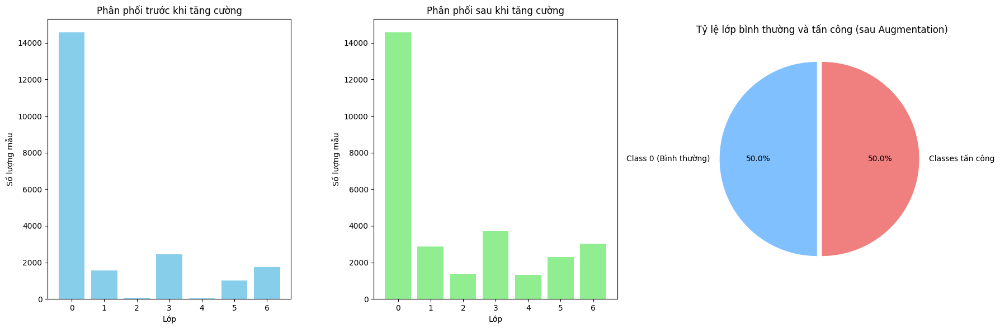

[INFO] Đã lưu dữ liệu tạo sinh vào file: generated_smote_1.csv
Thời gian tạo sinh dữ liệu (SMOTE, tỷ lệ 1:1): 1.16 giây


In [30]:
import time
start_time = time.time()
X_aug_smote_1_1, y_aug_smote_1_1 = augment_to_ratio_total_balanced(X_train, y_train, target_ratio=1, method='smote')
end_time = time.time()
elapsed_time = end_time - start_time
print(f"Thời gian tạo sinh dữ liệu (SMOTE, tỷ lệ 1:1): {elapsed_time:.2f} giây")

## VAE

[INFO] Phân phối ban đầu: Counter({0: 14580, 3: 2433, 6: 1744, 1: 1573, 5: 1004, 2: 77, 4: 29})
[INFO] Số mẫu bình thường: 14580
[INFO] Tổng số mẫu tấn công hiện có: 6860
[INFO] Cần sinh thêm tổng cộng: 7720 mẫu tấn công
[INFO] Lớp 1: Có 1573, cần sinh thêm 1286
[INFO] Lớp 2: Có 77, cần sinh thêm 1286
[INFO] Lớp 3: Có 2433, cần sinh thêm 1286
[INFO] Lớp 4: Có 29, cần sinh thêm 1286
[INFO] Lớp 5: Có 1004, cần sinh thêm 1286
[INFO] Lớp 6: Có 1744, cần sinh thêm 1286
[INFO] Phân phối nhãn sau khi tăng cường: Counter({np.int64(0): 14580, np.int64(3): 3719, np.int64(6): 3030, np.int64(1): 2859, np.int64(5): 2290, np.int64(2): 1363, np.int64(4): 1315})


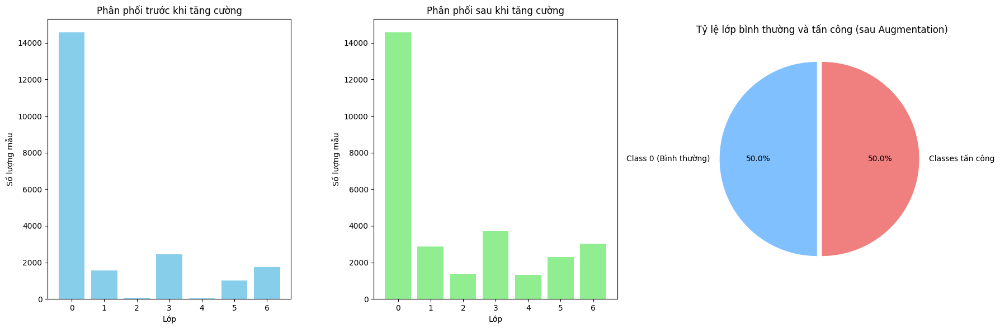

[INFO] Đã lưu dữ liệu tạo sinh vào file: generated_vae_1.csv
Thời gian tạo sinh dữ liệu (VAE, tỷ lệ 1:1): 543.17 giây


In [34]:
import time
start_time = time.time()
X_aug_vae_1_1, y_aug_vae_1_1 = augment_to_ratio_total_balanced(X_train, y_train, target_ratio=1, method='vae')
end_time = time.time()
elapsed_time = end_time - start_time
print(f"Thời gian tạo sinh dữ liệu (VAE, tỷ lệ 1:1): {elapsed_time:.2f} giây")

## CGAN

[INFO] Phân phối ban đầu: Counter({0: 14580, 3: 2433, 6: 1744, 1: 1573, 5: 1004, 2: 77, 4: 29})
[INFO] Số mẫu bình thường: 14580
[INFO] Tổng số mẫu tấn công hiện có: 6860
[INFO] Cần sinh thêm tổng cộng: 7720 mẫu tấn công
[INFO] Lớp 1: Có 1573, cần sinh thêm 1286
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━

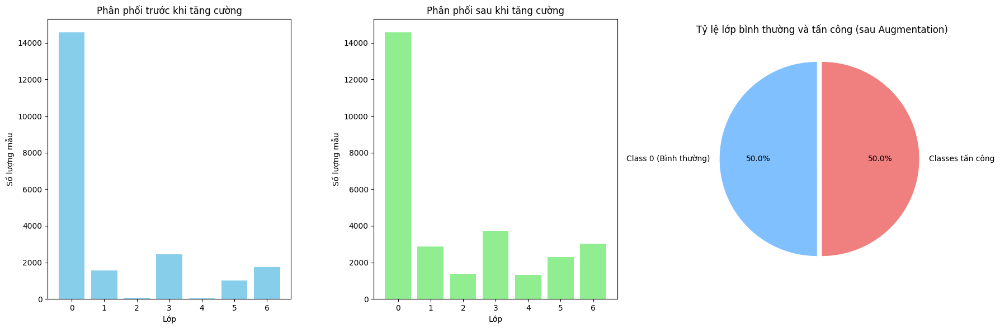

[INFO] Đã lưu dữ liệu tạo sinh vào file: generated_cgan_1.csv
Thời gian tạo sinh dữ liệu (CGAN, tỷ lệ 1:1): 56.97 giây


In [35]:
import time
start_time = time.time()
X_aug_cgan_1_1, y_aug_cgan_1_1 = augment_to_ratio_total_balanced(X_train, y_train, target_ratio=1, method='cgan')
end_time = time.time()
elapsed_time = end_time - start_time
print(f"Thời gian tạo sinh dữ liệu (CGAN, tỷ lệ 1:1): {elapsed_time:.2f} giây")

## So sánh giữa dữ liệu original và dữ liệu sinh của tỉ lệ 1:1

In [168]:
original_df = pd.read_csv("/kaggle/input/selected-feature/selected_features.csv")
smote_df = pd.read_csv("/kaggle/working/generated_smote_1.csv")
cgan_df = pd.read_csv("/kaggle/working/generated_cgan_1.csv")
vae_df = pd.read_csv("/kaggle/working/generated_vae_1.csv")

X_orig, y_orig = split_X_y(original_df)
X_smote, y_smote = split_X_y(smote_df)
X_cgan, y_cgan = split_X_y(cgan_df)
X_vae, y_vae = split_X_y(vae_df)

In [126]:
best_k, all_results = find_best_k(X_smote)
print("Best k:", best_k)
for r in all_results:
    print(f"k={r['k']}, Inertia={r['inertia']:.2f}, Silhouette={r['silhouette_score']:.4f}")

Best k: 10
k=2, Inertia=4818.05, Silhouette=0.6707
k=3, Inertia=3604.94, Silhouette=0.5717
k=4, Inertia=3171.86, Silhouette=0.6219
k=5, Inertia=2361.11, Silhouette=0.6455
k=6, Inertia=2041.10, Silhouette=0.6705
k=7, Inertia=1657.07, Silhouette=0.6819
k=8, Inertia=1714.19, Silhouette=0.6355
k=9, Inertia=1393.47, Silhouette=0.6590
k=10, Inertia=990.16, Silhouette=0.7169


In [127]:
best_k, all_results = find_best_k(X_orig)
print("Best k:", best_k)
for r in all_results:
    print(f"k={r['k']}, Inertia={r['inertia']:.2f}, Silhouette={r['silhouette_score']:.4f}")

Best k: 10
k=2, Inertia=4429.42, Silhouette=0.6946
k=3, Inertia=3329.78, Silhouette=0.5956
k=4, Inertia=2627.69, Silhouette=0.6187
k=5, Inertia=2239.32, Silhouette=0.6604
k=6, Inertia=1906.44, Silhouette=0.6704
k=7, Inertia=1521.50, Silhouette=0.7017
k=8, Inertia=1241.18, Silhouette=0.7115
k=9, Inertia=1054.91, Silhouette=0.7178
k=10, Inertia=873.92, Silhouette=0.7272


In [128]:
best_k, all_results = find_best_k(X_cgan)
print("Best k:", best_k)
for r in all_results:
    print(f"k={r['k']}, Inertia={r['inertia']:.2f}, Silhouette={r['silhouette_score']:.4f}")

Best k: 8
k=2, Inertia=12002.44, Silhouette=0.6330
k=3, Inertia=9300.71, Silhouette=0.5222
k=4, Inertia=7040.85, Silhouette=0.5817
k=5, Inertia=4767.05, Silhouette=0.6345
k=6, Inertia=4070.41, Silhouette=0.6503
k=7, Inertia=3205.70, Silhouette=0.6061
k=8, Inertia=2917.68, Silhouette=0.6736
k=9, Inertia=2526.27, Silhouette=0.6655
k=10, Inertia=2299.45, Silhouette=0.6038


In [129]:
best_k, all_results = find_best_k(X_vae)
print("Best k:", best_k)
for r in all_results:
    print(f"k={r['k']}, Inertia={r['inertia']:.2f}, Silhouette={r['silhouette_score']:.4f}")

Best k: 10
k=2, Inertia=4238.33, Silhouette=0.6200
k=3, Inertia=3223.34, Silhouette=0.5498
k=4, Inertia=2756.83, Silhouette=0.5558
k=5, Inertia=2439.28, Silhouette=0.5510
k=6, Inertia=2048.43, Silhouette=0.5650
k=7, Inertia=1986.93, Silhouette=0.5443
k=8, Inertia=1519.80, Silhouette=0.6100
k=9, Inertia=1336.09, Silhouette=0.6273
k=10, Inertia=1109.10, Silhouette=0.6334


In [130]:
for name, X in [("Original", X_orig), ("SMOTE", X_smote), ("CGAN", X_cgan), ("VAE", X_vae)]:
    print(f"{name}: Average Entropy={avg_entropy(X):.4f}")

Original: Average Entropy=0.6435
SMOTE: Average Entropy=0.6662
CGAN: Average Entropy=1.0025
VAE: Average Entropy=0.8128


In [131]:
methods = {
    "SMOTE": X_smote,
    "CGAN": X_cgan,
    "VAE": X_vae
}

X_ref = X_orig  # dữ liệu gốc làm mốc so sánh

for name, X_gen in methods.items():
    # Căn chỉnh số lượng mẫu
    min_len = min(len(X_ref), len(X_gen))
    X_ref_aligned = X_ref.iloc[:min_len].reset_index(drop=True)
    X_gen_aligned = X_gen.iloc[:min_len].reset_index(drop=True)

    kl, wd, mse, mae = discrepancy_metrics(X_ref_aligned, X_gen_aligned)
    print(f"Original vs {name}: KL={kl:.4f}, WD={wd:.4f}, MSE={mse:.4f}, MAE={mae:.4f}")

Original vs SMOTE: KL=0.0060, WD=0.0081, MSE=0.0486, MAE=0.0911
Original vs CGAN: KL=0.0656, WD=0.0410, MSE=0.0722, MAE=0.1209
Original vs VAE: KL=0.0529, WD=0.0149, MSE=0.0452, MAE=0.0920


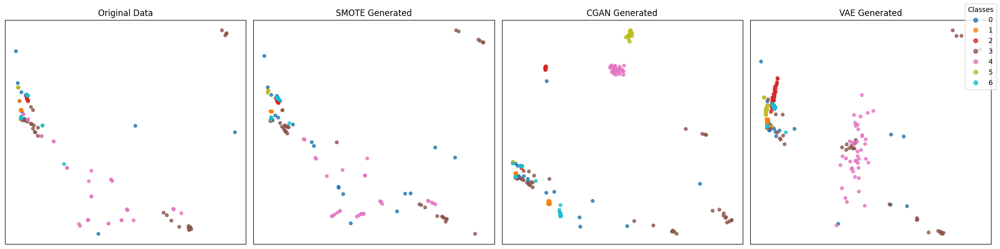

In [94]:
plot_generated_comparison(
    X_orig, y_orig,
    X_smote, y_smote,
    X_cgan, y_cgan,
    X_vae, y_vae,
    method='pca',
    sample_size=300
)


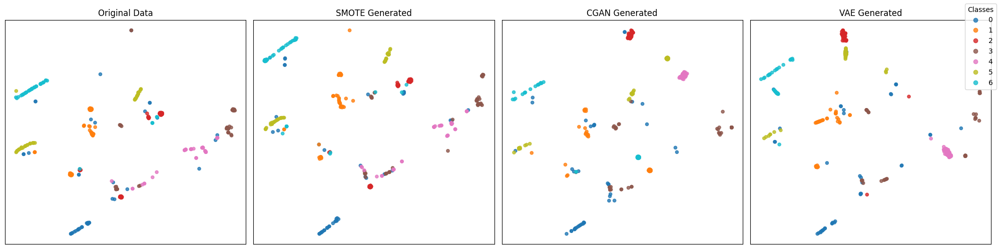

In [95]:
plot_generated_comparison(
    X_orig, y_orig,
    X_smote, y_smote,
    X_cgan, y_cgan,
    X_vae, y_vae,
    method='tsne',
    sample_size=300
)


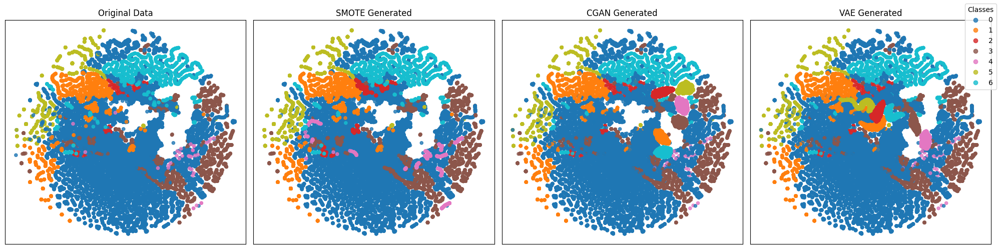

In [96]:
plot_generated_full(X_orig, y_orig,
                    X_smote, y_smote,
                    X_cgan, y_cgan,
                    X_vae, y_vae,
                    method="tsne")

Feature: Init_Win_bytes_forward
Original:
count    26800.000000
mean         0.129350
std          0.221253
min          0.000000
25%          0.000000
50%          0.003967
75%          0.125015
max          1.000000
Name: Init_Win_bytes_forward, dtype: float64
Generated:
count    29156.000000
mean         0.143577
std          0.215995
min          0.000000
25%          0.000458
50%          0.006111
75%          0.245884
max          1.000000
Name: Init_Win_bytes_forward, dtype: float64
NaN count in generated: 0


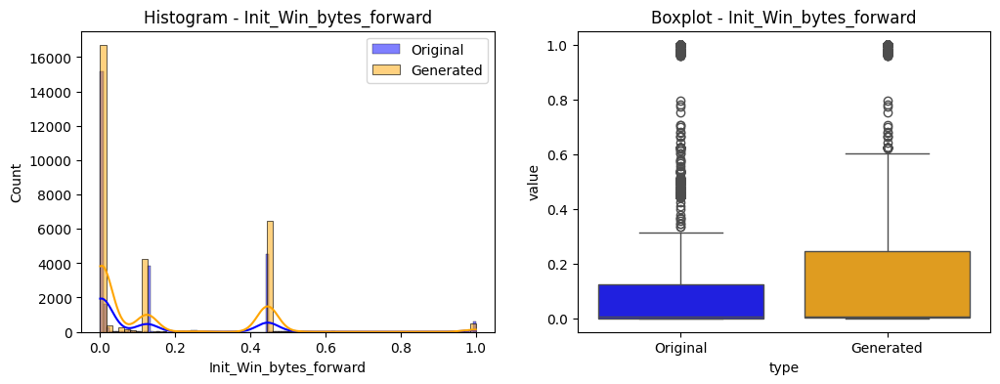

Feature: Init_Win_bytes_forward
Original:
count    26800.000000
mean         0.129350
std          0.221253
min          0.000000
25%          0.000000
50%          0.003967
75%          0.125015
max          1.000000
Name: Init_Win_bytes_forward, dtype: float64
Generated:
count    29156.000000
mean         0.166943
std          0.250911
min          0.000000
25%          0.000931
50%          0.013658
75%          0.325024
max          1.000000
Name: Init_Win_bytes_forward, dtype: float64
NaN count in generated: 0


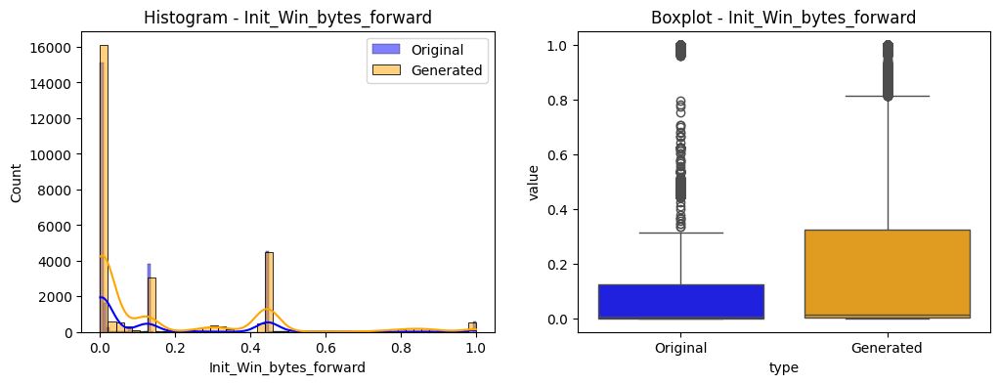

Feature: Init_Win_bytes_forward
Original:
count    26800.000000
mean         0.129350
std          0.221253
min          0.000000
25%          0.000000
50%          0.003967
75%          0.125015
max          1.000000
Name: Init_Win_bytes_forward, dtype: float64
Generated:
count    29156.000000
mean         0.143295
std          0.202878
min          0.000000
25%          0.000931
50%          0.041192
75%          0.251714
max          1.000000
Name: Init_Win_bytes_forward, dtype: float64
NaN count in generated: 0


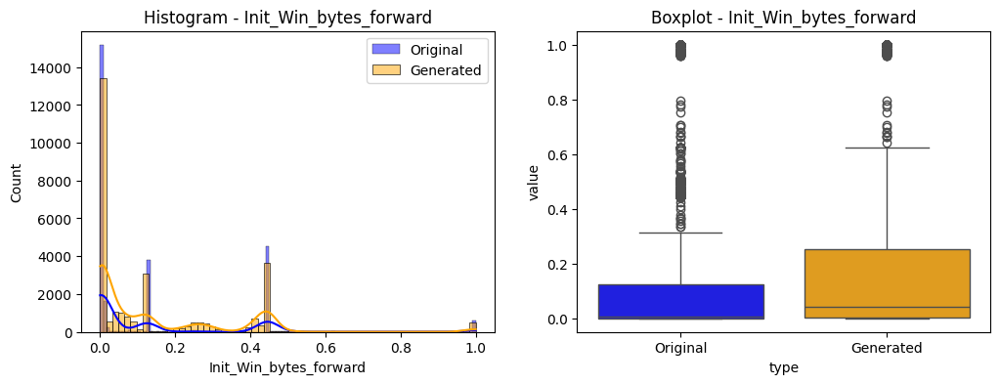

In [97]:
plot_hist_box(X_orig, X_smote, feature_idx=0)

plot_hist_box(X_orig, X_cgan, feature_idx=0)

plot_hist_box(X_orig, X_vae, feature_idx=0)

## Random Forest


📊 Phân bố nhãn TRAIN:
label
0    14580
1     2859
2     1363
3     3719
4     1315
5     2290
6     3030
Name: count, dtype: int64

📊 Phân bố nhãn TEST:
Label
0    3645
1     393
2      19
3     609
4       7
5     251
6     436
Name: count, dtype: int64


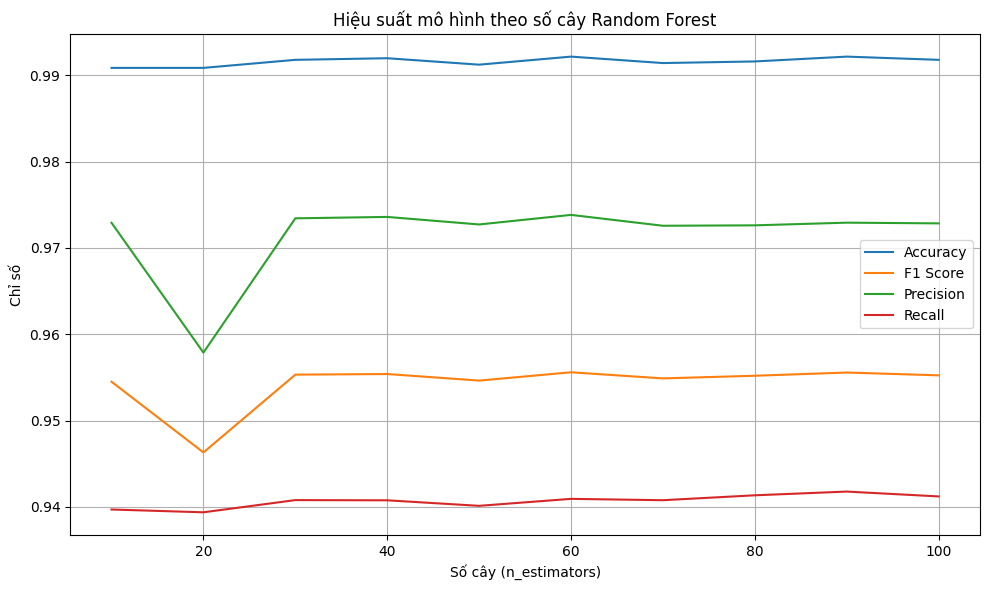


📊 Hiệu suất mô hình cuối cùng:
Accuracy : 0.9918
Precision: 0.9728
Recall   : 0.9412
F1-score : 0.9552
⏱️ Thời gian train: 1.3294 giây
⏱️ Thời gian test : 0.0463 giây

📄 Classification Report (Test set):
              precision    recall  f1-score   support

           0     0.9926    0.9956    0.9941      3645
           1     0.9899    0.9949    0.9924       393
           2     1.0000    0.7895    0.8824        19
           3     0.9885    0.9885    0.9885       609
           4     0.8571    0.8571    0.8571         7
           5     0.9841    0.9880    0.9861       251
           6     0.9977    0.9748    0.9861       436

    accuracy                         0.9918      5360
   macro avg     0.9728    0.9412    0.9552      5360
weighted avg     0.9918    0.9918    0.9917      5360



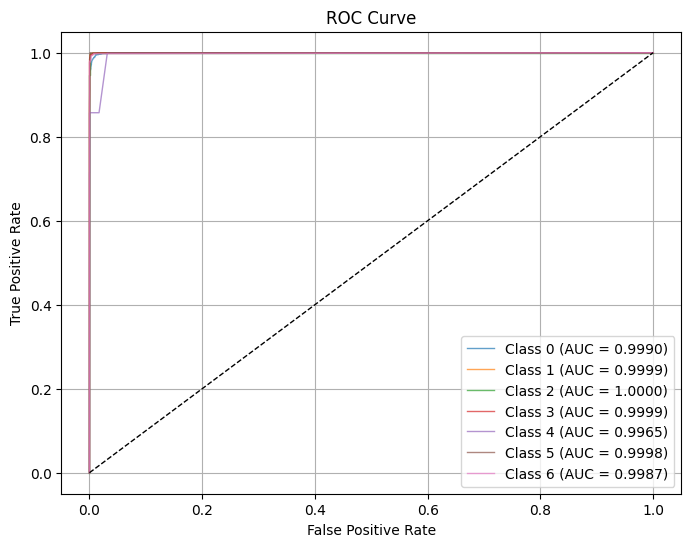

In [174]:
model_rf_smote_1_1 = train_and_evaluate_rf_epochs(X_smote, y_smote, X_test, y_test)


📊 Phân bố nhãn TRAIN:
label
0    14580
1     2859
2     1363
3     3719
4     1315
5     2290
6     3030
Name: count, dtype: int64

📊 Phân bố nhãn TEST:
Label
0    3645
1     393
2      19
3     609
4       7
5     251
6     436
Name: count, dtype: int64


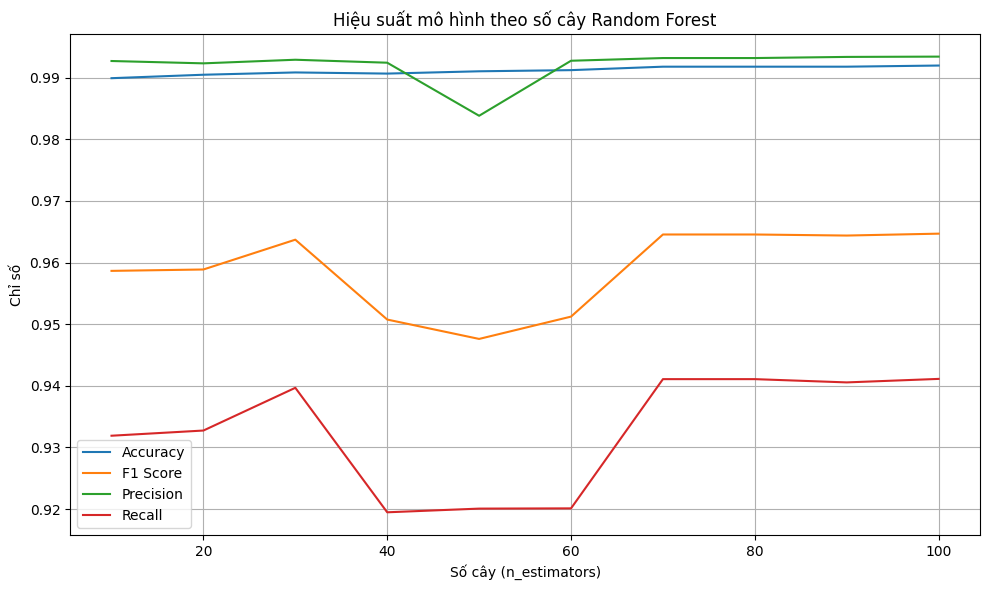


📊 Hiệu suất mô hình cuối cùng:
Accuracy : 0.9920
Precision: 0.9934
Recall   : 0.9411
F1-score : 0.9647
⏱️ Thời gian train: 1.6112 giây
⏱️ Thời gian test : 0.0462 giây

📄 Classification Report (Test set):
              precision    recall  f1-score   support

           0     0.9923    0.9962    0.9942      3645
           1     0.9873    0.9898    0.9886       393
           2     1.0000    0.7895    0.8824        19
           3     0.9901    0.9885    0.9893       609
           4     1.0000    0.8571    0.9231         7
           5     0.9842    0.9920    0.9881       251
           6     1.0000    0.9748    0.9872       436

    accuracy                         0.9920      5360
   macro avg     0.9934    0.9411    0.9647      5360
weighted avg     0.9920    0.9920    0.9919      5360



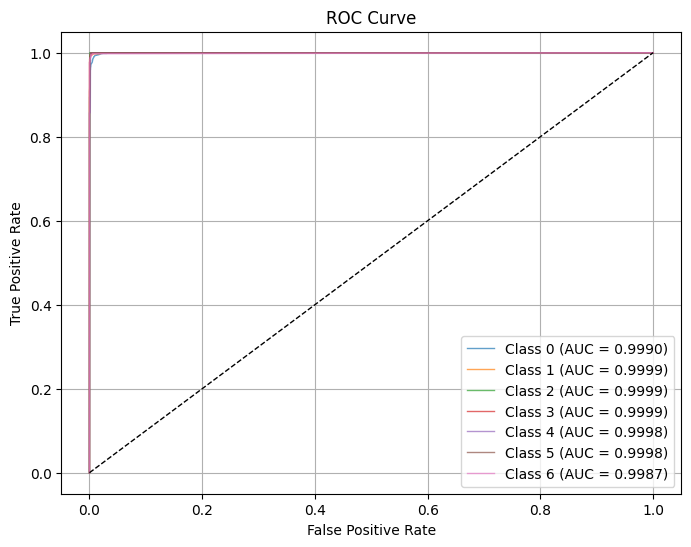

In [175]:
model_rf_vae_1_1= train_and_evaluate_rf_epochs(X_vae, y_vae, X_test, y_test)


📊 Phân bố nhãn TRAIN:
label
0    14580
1     2859
2     1363
3     3719
4     1315
5     2290
6     3030
Name: count, dtype: int64

📊 Phân bố nhãn TEST:
Label
0    3645
1     393
2      19
3     609
4       7
5     251
6     436
Name: count, dtype: int64


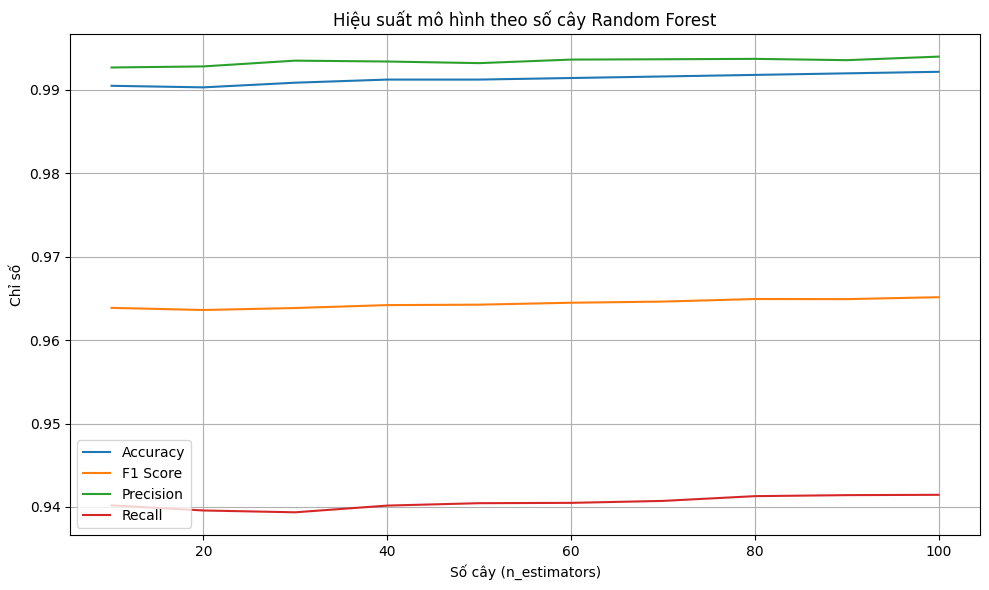


📊 Hiệu suất mô hình cuối cùng:
Accuracy : 0.9922
Precision: 0.9940
Recall   : 0.9415
F1-score : 0.9651
⏱️ Thời gian train: 1.5687 giây
⏱️ Thời gian test : 0.0469 giây

📄 Classification Report (Test set):
              precision    recall  f1-score   support

           0     0.9923    0.9962    0.9942      3645
           1     0.9873    0.9898    0.9886       393
           2     1.0000    0.7895    0.8824        19
           3     0.9901    0.9885    0.9893       609
           4     1.0000    0.8571    0.9231         7
           5     0.9881    0.9920    0.9901       251
           6     1.0000    0.9771    0.9884       436

    accuracy                         0.9922      5360
   macro avg     0.9940    0.9415    0.9651      5360
weighted avg     0.9922    0.9922    0.9921      5360



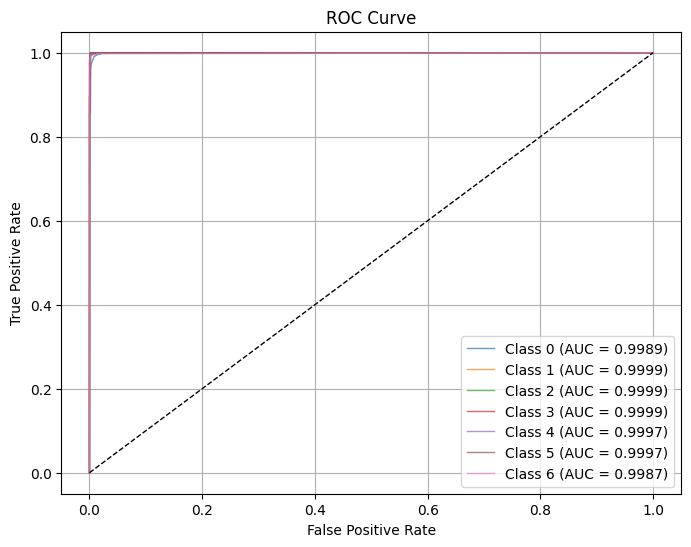

In [176]:
model_rf_cgan_1_1= train_and_evaluate_rf_epochs(X_cgan, y_cgan, X_test, y_test)

## XGBoost


📊 Phân bố nhãn TRAIN:
label
0    14580
1     2859
2     1363
3     3719
4     1315
5     2290
6     3030
Name: count, dtype: int64

📊 Phân bố nhãn TEST:
Label
0    3645
1     393
2      19
3     609
4       7
5     251
6     436
Name: count, dtype: int64
[10 trees] Train: 0.1445s | Test: 0.0066s
[20 trees] Train: 0.2536s | Test: 0.0105s
[30 trees] Train: 0.3604s | Test: 0.0149s
[40 trees] Train: 0.4819s | Test: 0.0181s
[50 trees] Train: 0.6758s | Test: 0.0223s
[60 trees] Train: 0.6678s | Test: 0.0256s
[70 trees] Train: 0.7719s | Test: 0.0291s
[80 trees] Train: 0.8934s | Test: 0.0337s
[90 trees] Train: 0.9786s | Test: 0.0355s
[100 trees] Train: 1.0395s | Test: 0.0390s


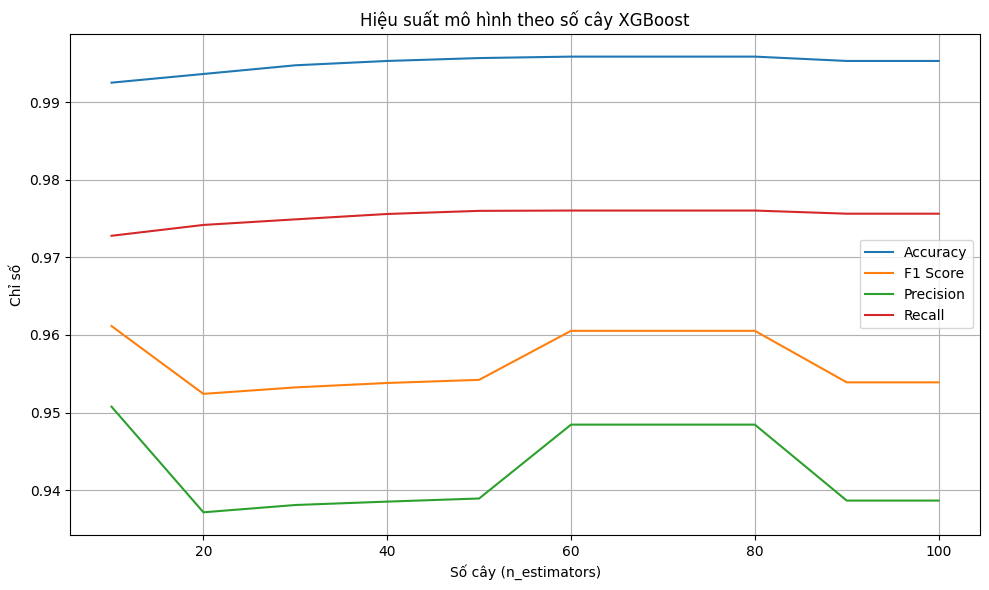


📊 Kết quả mô hình cuối cùng:
Accuracy : 0.9953
Precision: 0.9386
Recall   : 0.9756
F1-score : 0.9539
⏱ Thời gian train: 1.0421s
⏱ Thời gian test : 0.0381s

📄 Classification Report (Test set):
              precision    recall  f1-score   support

           0     0.9973    0.9962    0.9967      3645
           1     0.9949    0.9949    0.9949       393
           2     1.0000    1.0000    1.0000        19
           3     0.9902    0.9967    0.9935       609
           4     0.6000    0.8571    0.7059         7
           5     0.9881    0.9960    0.9921       251
           6     1.0000    0.9885    0.9942       436

    accuracy                         0.9953      5360
   macro avg     0.9386    0.9756    0.9539      5360
weighted avg     0.9956    0.9953    0.9954      5360



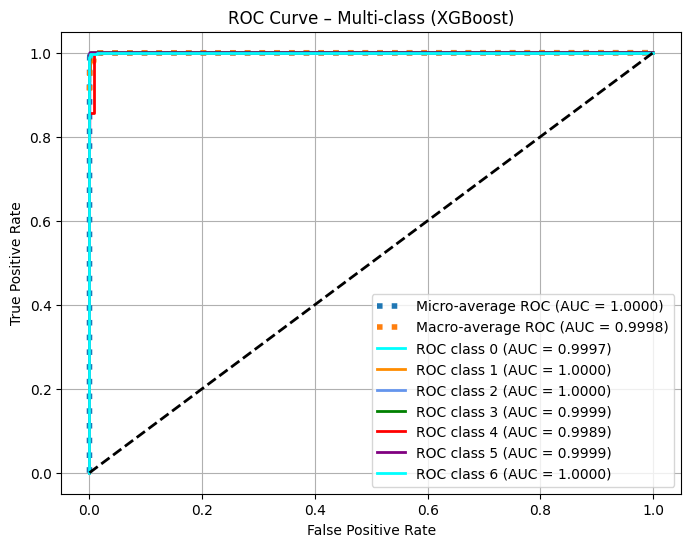

In [177]:
model_xgb_smote_1_1 = train_and_evaluate_xgb_epochs(X_smote, y_smote, X_test, y_test)


📊 Phân bố nhãn TRAIN:
label
0    14580
1     2859
2     1363
3     3719
4     1315
5     2290
6     3030
Name: count, dtype: int64

📊 Phân bố nhãn TEST:
Label
0    3645
1     393
2      19
3     609
4       7
5     251
6     436
Name: count, dtype: int64
[10 trees] Train: 0.1576s | Test: 0.0066s
[20 trees] Train: 0.2806s | Test: 0.0104s
[30 trees] Train: 0.3887s | Test: 0.0143s
[40 trees] Train: 0.4967s | Test: 0.0179s
[50 trees] Train: 0.6069s | Test: 0.0211s
[60 trees] Train: 0.6999s | Test: 0.0248s
[70 trees] Train: 0.7900s | Test: 0.0274s
[80 trees] Train: 0.8812s | Test: 0.0310s
[90 trees] Train: 0.9661s | Test: 0.0341s
[100 trees] Train: 1.0597s | Test: 0.0375s


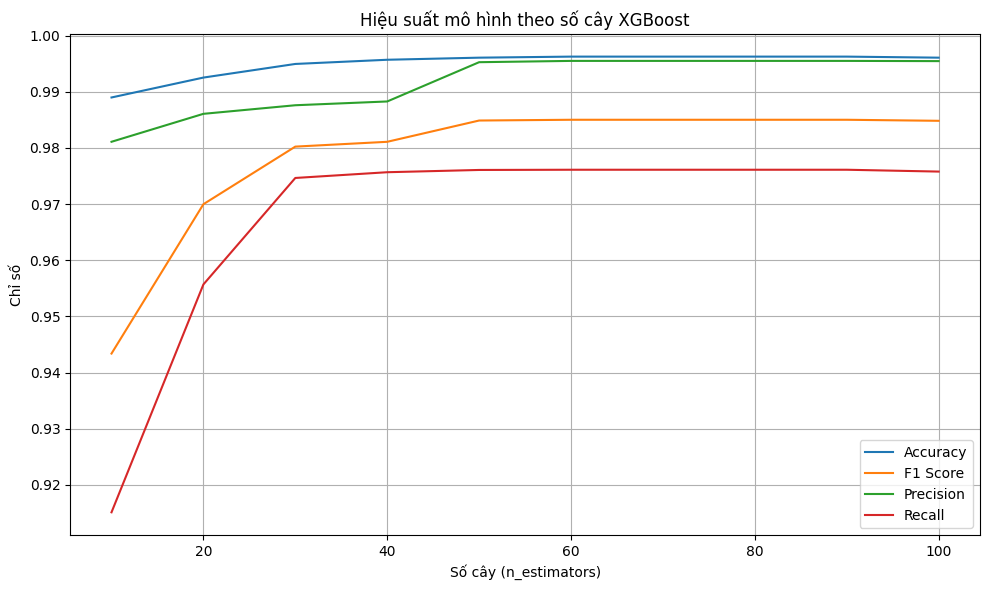


📊 Kết quả mô hình cuối cùng:
Accuracy : 0.9961
Precision: 0.9955
Recall   : 0.9758
F1-score : 0.9848
⏱ Thời gian train: 1.0643s
⏱ Thời gian test : 0.0370s

📄 Classification Report (Test set):
              precision    recall  f1-score   support

           0     0.9975    0.9973    0.9974      3645
           1     0.9924    0.9949    0.9936       393
           2     1.0000    1.0000    1.0000        19
           3     0.9902    0.9967    0.9935       609
           4     1.0000    0.8571    0.9231         7
           5     0.9881    0.9960    0.9921       251
           6     1.0000    0.9885    0.9942       436

    accuracy                         0.9961      5360
   macro avg     0.9955    0.9758    0.9848      5360
weighted avg     0.9961    0.9961    0.9961      5360



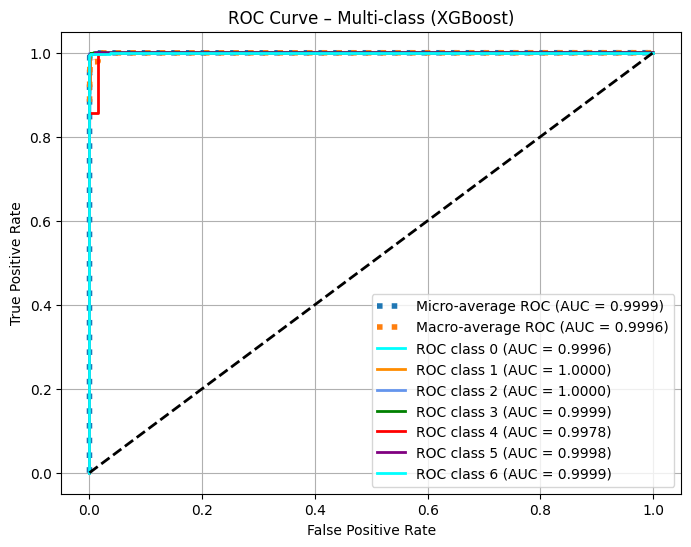

In [178]:
model_xgb_vae_1_1 = train_and_evaluate_xgb_epochs(X_vae, y_vae, X_test, y_test)


📊 Phân bố nhãn TRAIN:
label
0    14580
1     2859
2     1363
3     3719
4     1315
5     2290
6     3030
Name: count, dtype: int64

📊 Phân bố nhãn TEST:
Label
0    3645
1     393
2      19
3     609
4       7
5     251
6     436
Name: count, dtype: int64
[10 trees] Train: 0.1759s | Test: 0.0077s
[20 trees] Train: 0.2888s | Test: 0.0105s
[30 trees] Train: 0.4086s | Test: 0.0146s
[40 trees] Train: 0.4915s | Test: 0.0181s
[50 trees] Train: 0.6083s | Test: 0.0234s
[60 trees] Train: 0.7146s | Test: 0.0288s
[70 trees] Train: 0.7812s | Test: 0.0279s
[80 trees] Train: 0.8807s | Test: 0.0318s
[90 trees] Train: 0.9464s | Test: 0.0345s
[100 trees] Train: 1.0365s | Test: 0.0374s


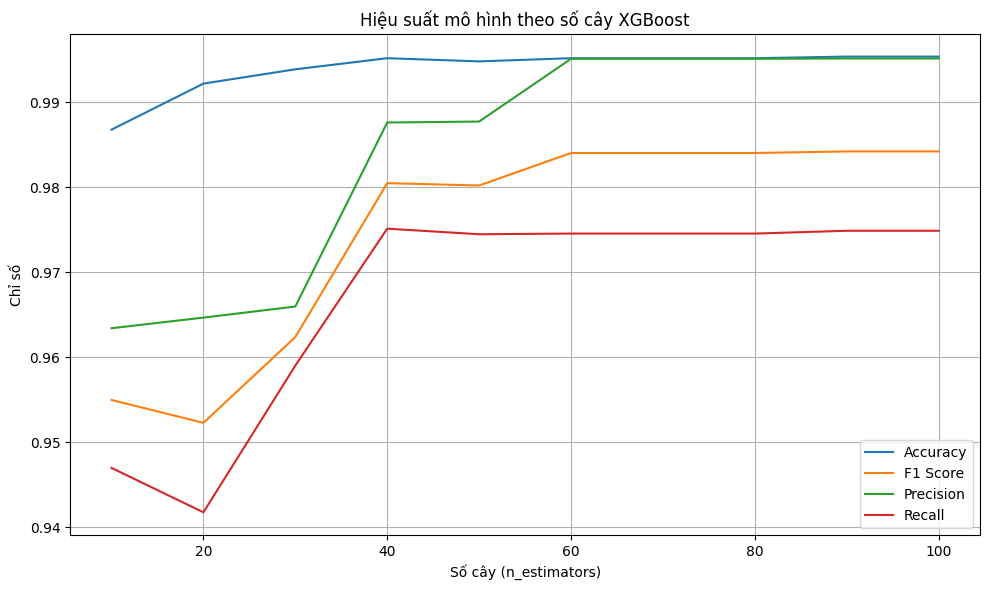


📊 Kết quả mô hình cuối cùng:
Accuracy : 0.9953
Precision: 0.9951
Recall   : 0.9749
F1-score : 0.9842
⏱ Thời gian train: 1.1341s
⏱ Thời gian test : 0.0368s

📄 Classification Report (Test set):
              precision    recall  f1-score   support

           0     0.9967    0.9970    0.9968      3645
           1     0.9924    0.9949    0.9936       393
           2     1.0000    1.0000    1.0000        19
           3     0.9886    0.9951    0.9918       609
           4     1.0000    0.8571    0.9231         7
           5     0.9881    0.9960    0.9921       251
           6     1.0000    0.9839    0.9919       436

    accuracy                         0.9953      5360
   macro avg     0.9951    0.9749    0.9842      5360
weighted avg     0.9954    0.9953    0.9953      5360



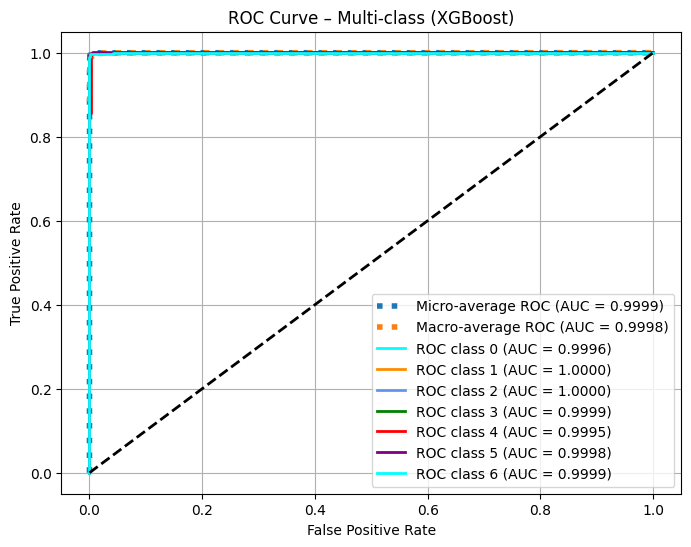

In [179]:
model_xgb_cgan_1_1= train_and_evaluate_xgb_epochs(X_cgan, y_cgan, X_test, y_test)

# Tỉ lệ 1:2

## SMOTE

[INFO] Phân phối ban đầu: Counter({0: 14580, 3: 2433, 6: 1744, 1: 1573, 5: 1004, 2: 77, 4: 29})
[INFO] Số mẫu bình thường: 14580
[INFO] Tổng số mẫu tấn công hiện có: 6860
[INFO] Cần sinh thêm tổng cộng: 22300 mẫu tấn công
[INFO] Lớp 1: 1573 → 5289
[INFO] Lớp 2: 77 → 3793
[INFO] Lớp 3: 2433 → 6149
[INFO] Lớp 4: 29 → 3745
[INFO] Lớp 5: 1004 → 4720
[INFO] Lớp 6: 1744 → 5460
[INFO] Phân phối nhãn sau khi tăng cường: Counter({np.int64(0): 14580, np.int64(3): 6149, np.int64(6): 5460, np.int64(1): 5289, np.int64(5): 4720, np.int64(2): 3793, np.int64(4): 3745})


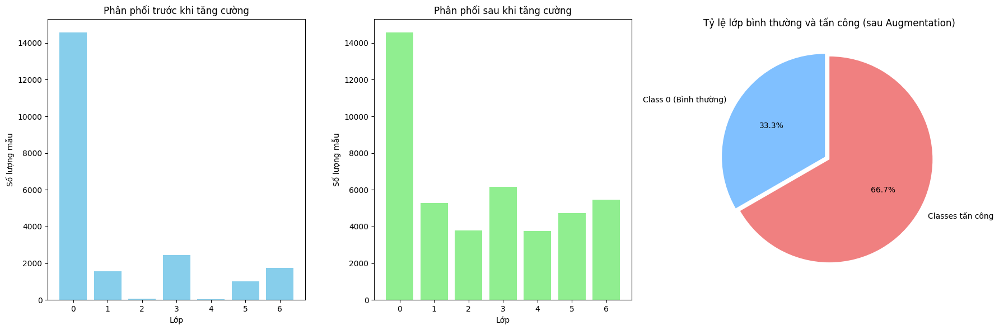

[INFO] Đã lưu dữ liệu tạo sinh vào file: generated_smote_2.csv


In [54]:
X_aug_smote_1_2, y_aug_smote_1_2 = augment_to_ratio_total_balanced(X_train, y_train, target_ratio=2, method='smote')

## VAE

[INFO] Phân phối ban đầu: Counter({0: 14580, 3: 2433, 6: 1744, 1: 1573, 5: 1004, 2: 77, 4: 29})
[INFO] Số mẫu bình thường: 14580
[INFO] Tổng số mẫu tấn công hiện có: 6860
[INFO] Cần sinh thêm tổng cộng: 22300 mẫu tấn công
[INFO] Lớp 1: Có 1573, cần sinh thêm 3716
[INFO] Lớp 2: Có 77, cần sinh thêm 3716
[INFO] Lớp 3: Có 2433, cần sinh thêm 3716
[INFO] Lớp 4: Có 29, cần sinh thêm 3716
[INFO] Lớp 5: Có 1004, cần sinh thêm 3716
[INFO] Lớp 6: Có 1744, cần sinh thêm 3716
[INFO] Phân phối nhãn sau khi tăng cường: Counter({np.int64(0): 14580, np.int64(3): 6149, np.int64(6): 5460, np.int64(1): 5289, np.int64(5): 4720, np.int64(2): 3793, np.int64(4): 3745})


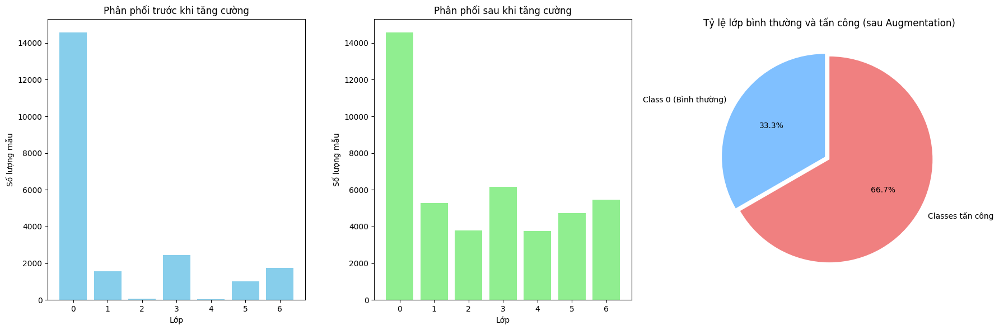

[INFO] Đã lưu dữ liệu tạo sinh vào file: generated_vae_2.csv


In [111]:
X_aug_vae_1_2, y_aug_vae_1_2 = augment_to_ratio_total_balanced(X_train, y_train, target_ratio=2, method='vae')

## CGAN

[INFO] Phân phối ban đầu: Counter({0: 14580, 3: 2433, 6: 1744, 1: 1573, 5: 1004, 2: 77, 4: 29})
[INFO] Số mẫu bình thường: 14580
[INFO] Tổng số mẫu tấn công hiện có: 6860
[INFO] Cần sinh thêm tổng cộng: 22300 mẫu tấn công
[INFO] Lớp 1: Có 1573, cần sinh thêm 3716
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━

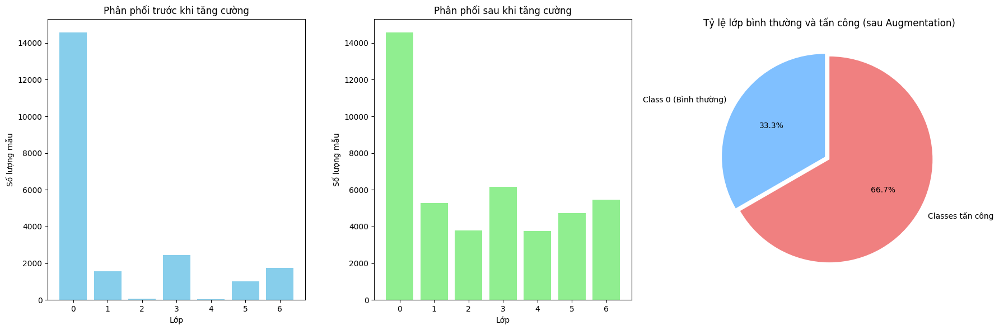

[INFO] Đã lưu dữ liệu tạo sinh vào file: generated_cgan_2.csv


In [55]:
X_aug_cgan_1_2, y_aug_cgan_1_2 = augment_to_ratio_total_balanced(X_train, y_train, target_ratio=2, method='cgan')

## So sánh dữ liệu ở tỉ lệ 1:2

In [180]:
# Ví dụ: load dữ liệu gốc và dữ liệu sinh
original_df = pd.read_csv("/kaggle/input/selected-feature/selected_features.csv")
smote_df = pd.read_csv("/kaggle/working/generated_smote_2.csv")
cgan_df = pd.read_csv("/kaggle/working/generated_cgan_2.csv")
vae_df = pd.read_csv("/kaggle/working/generated_vae_2.csv")

X_orig, y_orig = split_X_y(original_df)
X_smote, y_smote = split_X_y(smote_df)
X_cgan, y_cgan = split_X_y(cgan_df)
X_vae, y_vae = split_X_y(vae_df)

In [119]:
best_k, all_results = find_best_k(X_smote)
print("Best k:", best_k)
for r in all_results:
    print(f"k={r['k']}, Inertia={r['inertia']:.2f}, Silhouette={r['silhouette_score']:.4f}")

Best k: 10
k=2, Inertia=7147.39, Silhouette=0.6558
k=3, Inertia=5764.42, Silhouette=0.5916
k=4, Inertia=3978.15, Silhouette=0.5763
k=5, Inertia=3318.77, Silhouette=0.6409
k=6, Inertia=2873.06, Silhouette=0.6801
k=7, Inertia=2230.59, Silhouette=0.6937
k=8, Inertia=2028.46, Silhouette=0.6942
k=9, Inertia=1881.59, Silhouette=0.6974
k=10, Inertia=1676.74, Silhouette=0.6997


In [120]:
best_k, all_results = find_best_k(X_cgan)
print("Best k:", best_k)
for r in all_results:
    print(f"k={r['k']}, Inertia={r['inertia']:.2f}, Silhouette={r['silhouette_score']:.4f}")

Best k: 10
k=2, Inertia=19060.07, Silhouette=0.4909
k=3, Inertia=12533.44, Silhouette=0.5771
k=4, Inertia=9892.65, Silhouette=0.6278
k=5, Inertia=8706.61, Silhouette=0.6421
k=6, Inertia=7837.46, Silhouette=0.5632
k=7, Inertia=6622.95, Silhouette=0.6044
k=8, Inertia=2723.52, Silhouette=0.7477
k=9, Inertia=2145.17, Silhouette=0.7644
k=10, Inertia=1906.79, Silhouette=0.7696


In [121]:
best_k, all_results = find_best_k(X_vae)
print("Best k:", best_k)
for r in all_results:
    print(f"k={r['k']}, Inertia={r['inertia']:.2f}, Silhouette={r['silhouette_score']:.4f}")

Best k: 10
k=2, Inertia=5166.19, Silhouette=0.6072
k=3, Inertia=3863.45, Silhouette=0.5555
k=4, Inertia=3222.90, Silhouette=0.5623
k=5, Inertia=2803.75, Silhouette=0.5424
k=6, Inertia=2267.56, Silhouette=0.5629
k=7, Inertia=1965.69, Silhouette=0.5830
k=8, Inertia=2008.66, Silhouette=0.5881
k=9, Inertia=1593.28, Silhouette=0.6055
k=10, Inertia=1381.75, Silhouette=0.6118


In [133]:
for name, X in [("Original", X_orig), ("SMOTE", X_smote), ("CGAN", X_cgan), ("VAE", X_vae)]:
    print(f"{name}: Average Entropy={avg_entropy(X):.4f}")

Original: Average Entropy=0.6435
SMOTE: Average Entropy=0.6791
CGAN: Average Entropy=1.1149
VAE: Average Entropy=0.8919


In [118]:
methods = {
    "SMOTE": X_smote,
    "CGAN": X_cgan,
    "VAE": X_vae
}

X_ref = X_orig  # dữ liệu gốc làm mốc so sánh

for name, X_gen in methods.items():
    # Căn chỉnh số lượng mẫu
    min_len = min(len(X_ref), len(X_gen))
    X_ref_aligned = X_ref.iloc[:min_len].reset_index(drop=True)
    X_gen_aligned = X_gen.iloc[:min_len].reset_index(drop=True)

    kl, wd, mse, mae = discrepancy_metrics(X_ref_aligned, X_gen_aligned)
    print(f"Original vs {name}: KL={kl:.4f}, WD={wd:.4f}, MSE={mse:.4f}, MAE={mae:.4f}")

Original vs SMOTE: KL=0.0049, WD=0.0081, MSE=0.0410, MAE=0.0781
Original vs CGAN: KL=0.0620, WD=0.0314, MSE=0.0578, MAE=0.1043
Original vs VAE: KL=0.0620, WD=0.0314, MSE=0.0578, MAE=0.1043


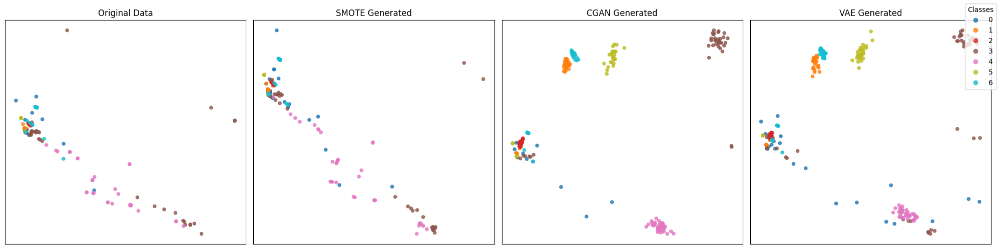

In [ ]:
plot_generated_comparison(
    X_orig, y_orig,
    X_smote, y_smote,
    X_cgan, y_cgan,
    X_vae, y_vae,
    method='pca',
    sample_size=300
)

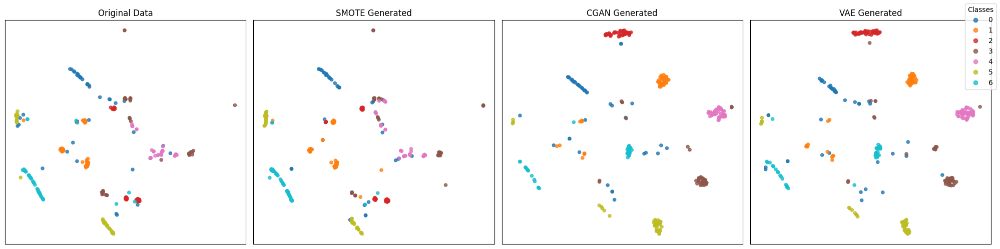

In [119]:
plot_generated_comparison(
    X_orig, y_orig,
    X_smote, y_smote,
    X_cgan, y_cgan,
    X_vae, y_vae,
    method='tsne',
    sample_size=300
)

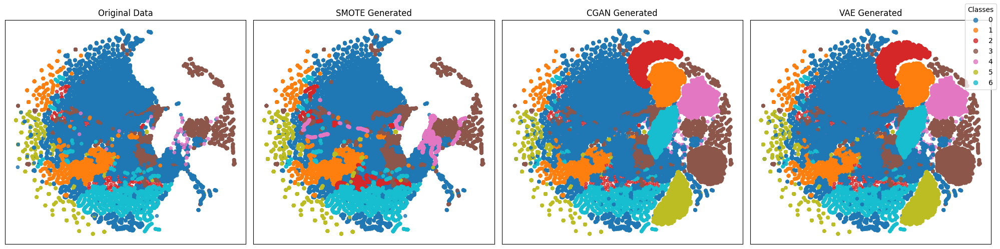

In [120]:
plot_generated_full(X_orig, y_orig,
                    X_smote, y_smote,
                    X_cgan, y_cgan,
                    X_vae, y_vae,
                    method="tsne")

Feature: Init_Win_bytes_forward
Original:
count    26800.000000
mean         0.129350
std          0.221253
min          0.000000
25%          0.000000
50%          0.003967
75%          0.125015
max          1.000000
Name: Init_Win_bytes_forward, dtype: float64
Generated:
count    43736.000000
mean         0.156812
std          0.211676
min          0.000000
25%          0.003632
50%          0.015640
75%          0.445572
max          1.000000
Name: Init_Win_bytes_forward, dtype: float64
NaN count in generated: 0


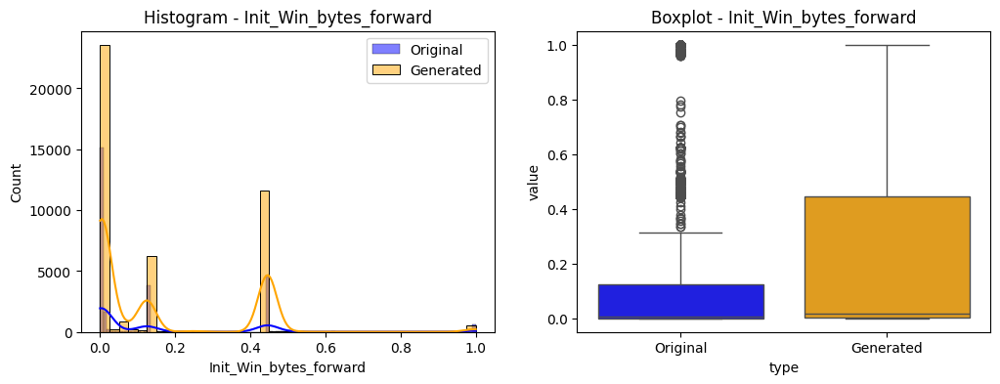

Feature: Init_Win_bytes_forward
Original:
count    26800.000000
mean         0.129350
std          0.221253
min          0.000000
25%          0.000000
50%          0.003967
75%          0.125015
max          1.000000
Name: Init_Win_bytes_forward, dtype: float64
Generated:
count    43736.000000
mean         0.184920
std          0.287343
min          0.000000
25%          0.004196
50%          0.099399
75%          0.180990
max          1.000000
Name: Init_Win_bytes_forward, dtype: float64
NaN count in generated: 0


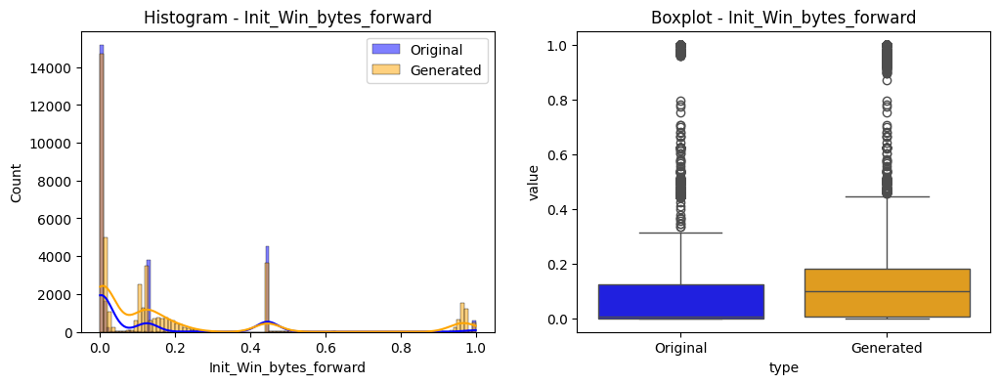

Feature: Init_Win_bytes_forward
Original:
count    26800.000000
mean         0.129350
std          0.221253
min          0.000000
25%          0.000000
50%          0.003967
75%          0.125015
max          1.000000
Name: Init_Win_bytes_forward, dtype: float64
Generated:
count    43736.000000
mean         0.184920
std          0.287343
min          0.000000
25%          0.004196
50%          0.099399
75%          0.180990
max          1.000000
Name: Init_Win_bytes_forward, dtype: float64
NaN count in generated: 0


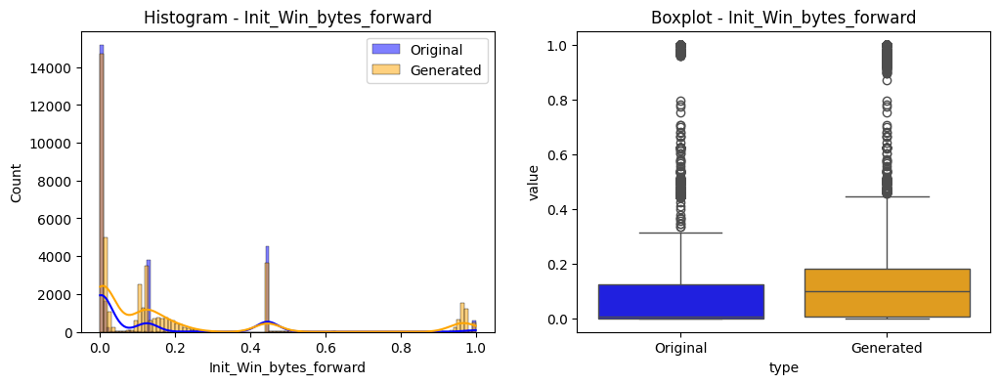

In [121]:
plot_hist_box(X_orig, X_smote, feature_idx=0)

plot_hist_box(X_orig, X_cgan, feature_idx=0)

plot_hist_box(X_orig, X_vae, feature_idx=0)

## Random Forest


📊 Phân bố nhãn TRAIN:
label
0    14580
1     5289
2     3793
3     6149
4     3745
5     4720
6     5460
Name: count, dtype: int64

📊 Phân bố nhãn TEST:
Label
0    3645
1     393
2      19
3     609
4       7
5     251
6     436
Name: count, dtype: int64


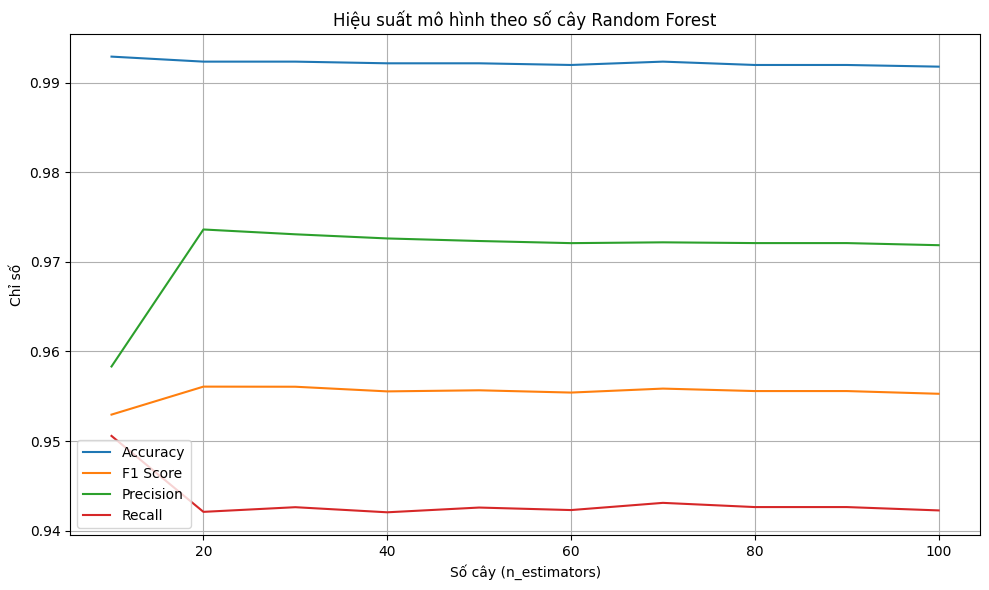


📊 Hiệu suất mô hình cuối cùng:
Accuracy : 0.9918
Precision: 0.9719
Recall   : 0.9423
F1-score : 0.9553
⏱️ Thời gian train: 2.2081 giây
⏱️ Thời gian test : 0.0453 giây

📄 Classification Report (Test set):
              precision    recall  f1-score   support

           0     0.9937    0.9945    0.9941      3645
           1     0.9873    0.9898    0.9886       393
           2     1.0000    0.7895    0.8824        19
           3     0.9853    0.9934    0.9894       609
           4     0.8571    0.8571    0.8571         7
           5     0.9842    0.9920    0.9881       251
           6     0.9953    0.9794    0.9873       436

    accuracy                         0.9918      5360
   macro avg     0.9719    0.9423    0.9553      5360
weighted avg     0.9918    0.9918    0.9917      5360



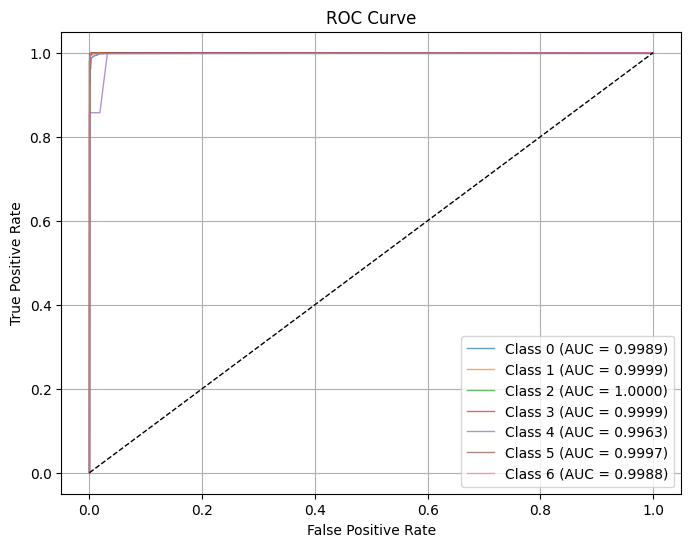

In [181]:
model_rf_smote_1_2 = train_and_evaluate_rf_epochs(X_smote, y_smote, X_test, y_test)


📊 Phân bố nhãn TRAIN:
label
0    14580
1     5289
2     3793
3     6149
4     3745
5     4720
6     5460
Name: count, dtype: int64

📊 Phân bố nhãn TEST:
Label
0    3645
1     393
2      19
3     609
4       7
5     251
6     436
Name: count, dtype: int64


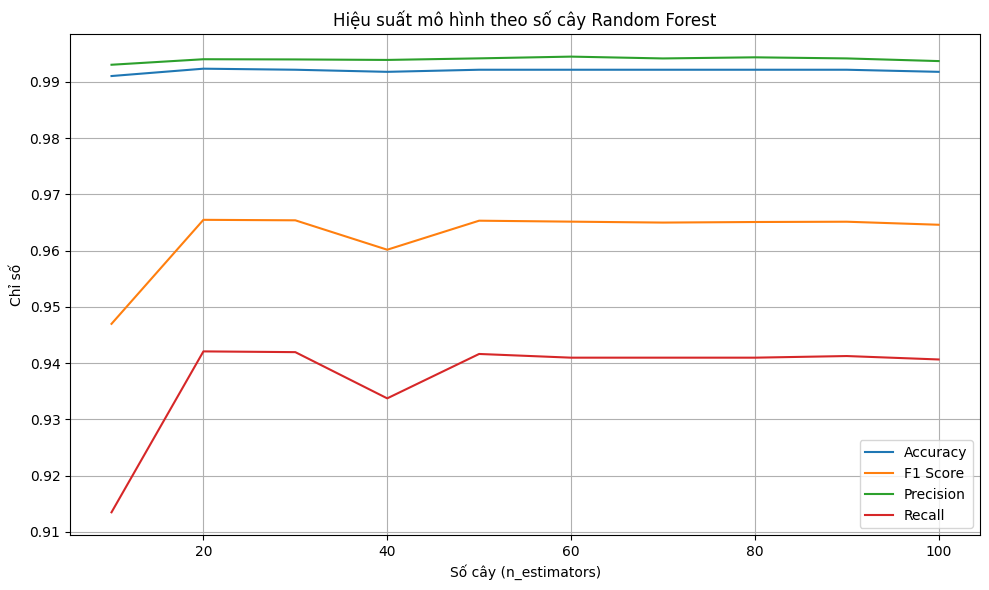


📊 Hiệu suất mô hình cuối cùng:
Accuracy : 0.9918
Precision: 0.9937
Recall   : 0.9407
F1-score : 0.9646
⏱️ Thời gian train: 3.0064 giây
⏱️ Thời gian test : 0.0461 giây

📄 Classification Report (Test set):
              precision    recall  f1-score   support

           0     0.9921    0.9962    0.9941      3645
           1     0.9873    0.9898    0.9886       393
           2     1.0000    0.7895    0.8824        19
           3     0.9885    0.9869    0.9877       609
           4     1.0000    0.8571    0.9231         7
           5     0.9880    0.9880    0.9880       251
           6     1.0000    0.9771    0.9884       436

    accuracy                         0.9918      5360
   macro avg     0.9937    0.9407    0.9646      5360
weighted avg     0.9918    0.9918    0.9917      5360



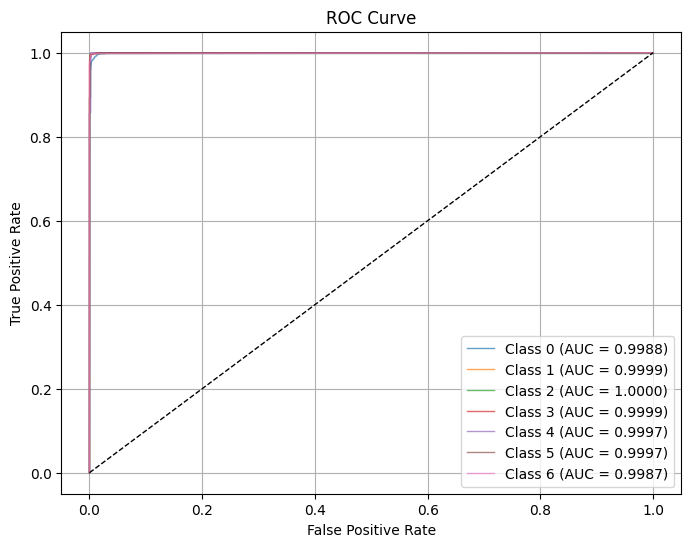

In [182]:
model_rf_vae_1_2 = train_and_evaluate_rf_epochs(X_vae, y_vae, X_test, y_test)


📊 Phân bố nhãn TRAIN:
label
0    14580
1     5289
2     3793
3     6149
4     3745
5     4720
6     5460
Name: count, dtype: int64

📊 Phân bố nhãn TEST:
Label
0    3645
1     393
2      19
3     609
4       7
5     251
6     436
Name: count, dtype: int64


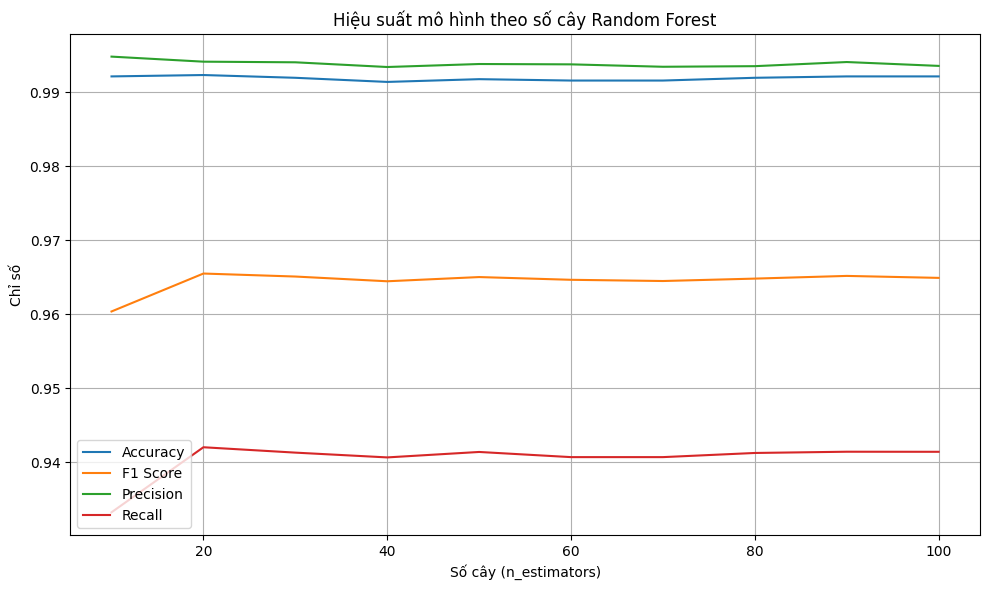


📊 Hiệu suất mô hình cuối cùng:
Accuracy : 0.9922
Precision: 0.9936
Recall   : 0.9414
F1-score : 0.9649
⏱️ Thời gian train: 2.7415 giây
⏱️ Thời gian test : 0.0456 giây

📄 Classification Report (Test set):
              precision    recall  f1-score   support

           0     0.9926    0.9962    0.9944      3645
           1     0.9899    0.9949    0.9924       393
           2     1.0000    0.7895    0.8824        19
           3     0.9885    0.9869    0.9877       609
           4     1.0000    0.8571    0.9231         7
           5     0.9841    0.9880    0.9861       251
           6     1.0000    0.9771    0.9884       436

    accuracy                         0.9922      5360
   macro avg     0.9936    0.9414    0.9649      5360
weighted avg     0.9922    0.9922    0.9921      5360



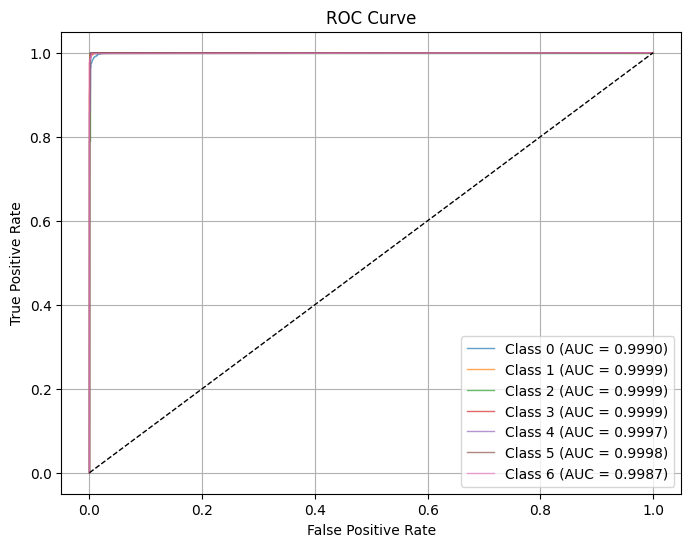

In [183]:
model_rf_cgan_1_2= train_and_evaluate_rf_epochs(X_cgan, y_cgan, X_test, y_test)

## XGBoost


📊 Phân bố nhãn TRAIN:
label
0    14580
1     5289
2     3793
3     6149
4     3745
5     4720
6     5460
Name: count, dtype: int64

📊 Phân bố nhãn TEST:
Label
0    3645
1     393
2      19
3     609
4       7
5     251
6     436
Name: count, dtype: int64
[10 trees] Train: 0.1909s | Test: 0.0066s
[20 trees] Train: 0.3440s | Test: 0.0111s
[30 trees] Train: 0.5493s | Test: 0.0152s
[40 trees] Train: 0.6125s | Test: 0.0186s
[50 trees] Train: 0.7414s | Test: 0.0226s
[60 trees] Train: 0.8739s | Test: 0.0255s
[70 trees] Train: 1.0288s | Test: 0.0293s
[80 trees] Train: 1.1108s | Test: 0.0341s
[90 trees] Train: 1.2386s | Test: 0.0362s
[100 trees] Train: 1.3410s | Test: 0.0391s


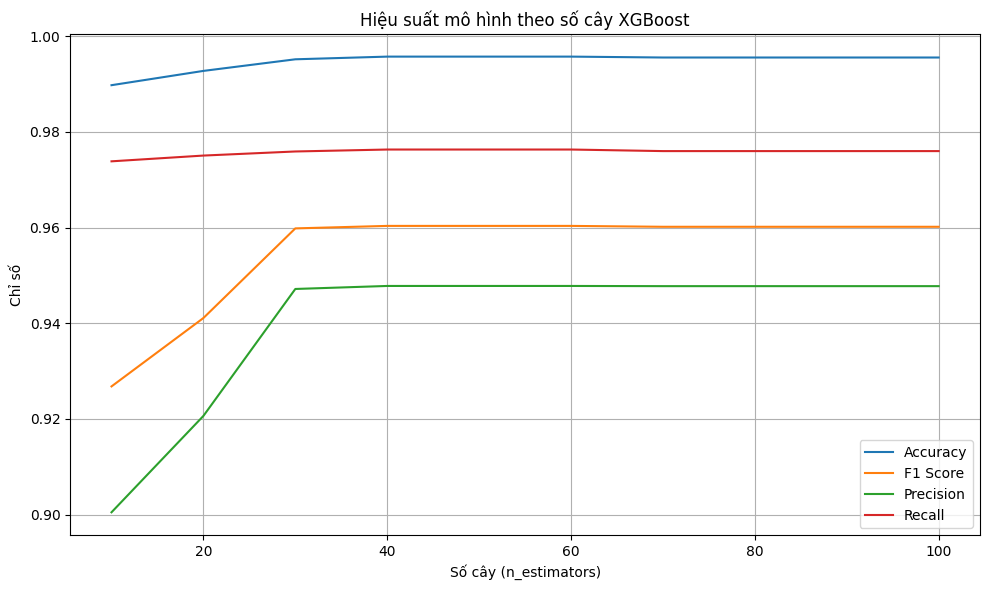


📊 Kết quả mô hình cuối cùng:
Accuracy : 0.9955
Precision: 0.9477
Recall   : 0.9760
F1-score : 0.9602
⏱ Thời gian train: 1.3368s
⏱ Thời gian test : 0.0390s

📄 Classification Report (Test set):
              precision    recall  f1-score   support

           0     0.9975    0.9962    0.9968      3645
           1     0.9924    0.9949    0.9936       393
           2     1.0000    1.0000    1.0000        19
           3     0.9918    0.9967    0.9943       609
           4     0.6667    0.8571    0.7500         7
           5     0.9881    0.9960    0.9921       251
           6     0.9977    0.9908    0.9942       436

    accuracy                         0.9955      5360
   macro avg     0.9477    0.9760    0.9602      5360
weighted avg     0.9957    0.9955    0.9956      5360



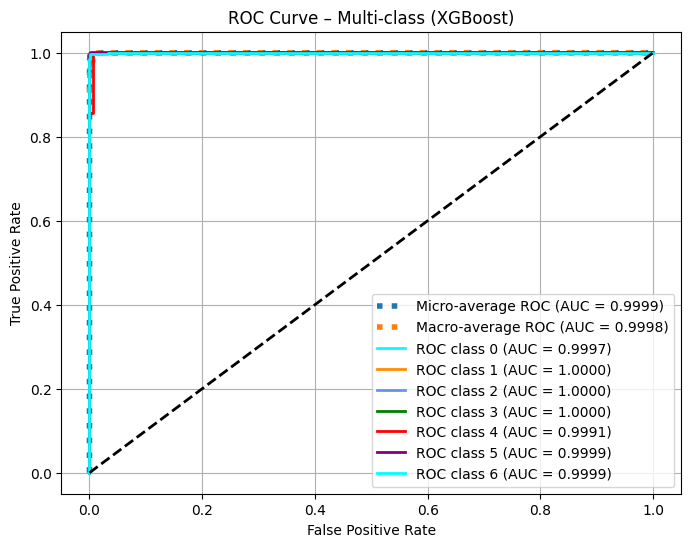

In [184]:
model_xgb_smote_1_2 = train_and_evaluate_xgb_epochs(X_smote, y_smote, X_test, y_test)


📊 Phân bố nhãn TRAIN:
label
0    14580
1     5289
2     3793
3     6149
4     3745
5     4720
6     5460
Name: count, dtype: int64

📊 Phân bố nhãn TEST:
Label
0    3645
1     393
2      19
3     609
4       7
5     251
6     436
Name: count, dtype: int64
[10 trees] Train: 0.2005s | Test: 0.0076s
[20 trees] Train: 0.3406s | Test: 0.0106s
[30 trees] Train: 0.5201s | Test: 0.0187s
[40 trees] Train: 0.6668s | Test: 0.0181s
[50 trees] Train: 0.7547s | Test: 0.0214s
[60 trees] Train: 0.8721s | Test: 0.0251s
[70 trees] Train: 1.0002s | Test: 0.0287s
[80 trees] Train: 1.1150s | Test: 0.0319s
[90 trees] Train: 1.2435s | Test: 0.0348s
[100 trees] Train: 1.3559s | Test: 0.0379s


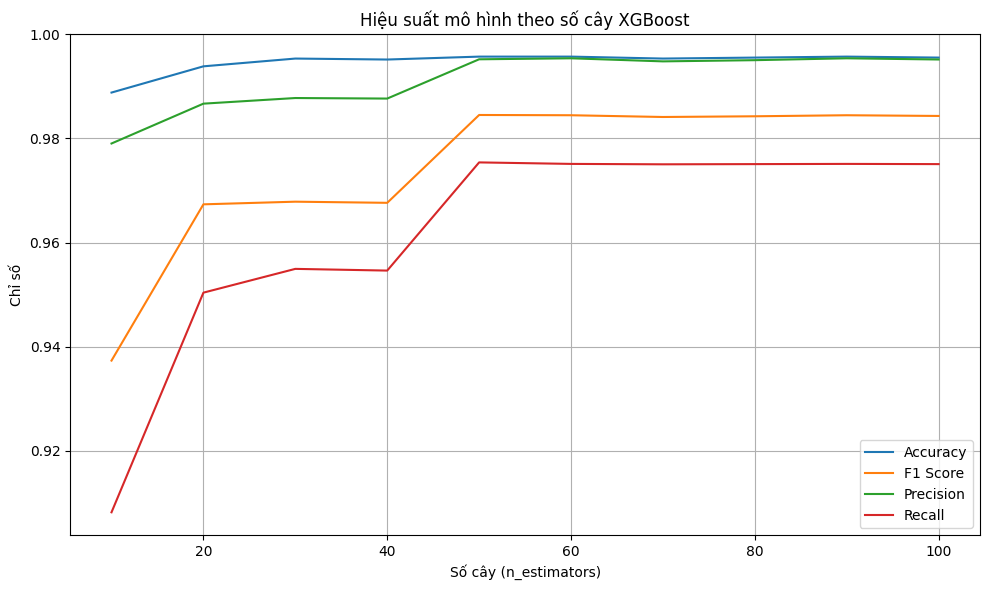


📊 Kết quả mô hình cuối cùng:
Accuracy : 0.9955
Precision: 0.9952
Recall   : 0.9751
F1-score : 0.9843
⏱ Thời gian train: 1.3794s
⏱ Thời gian test : 0.0370s

📄 Classification Report (Test set):
              precision    recall  f1-score   support

           0     0.9970    0.9970    0.9970      3645
           1     0.9924    0.9924    0.9924       393
           2     1.0000    1.0000    1.0000        19
           3     0.9886    0.9967    0.9926       609
           4     1.0000    0.8571    0.9231         7
           5     0.9881    0.9960    0.9921       251
           6     1.0000    0.9862    0.9931       436

    accuracy                         0.9955      5360
   macro avg     0.9952    0.9751    0.9843      5360
weighted avg     0.9955    0.9955    0.9955      5360



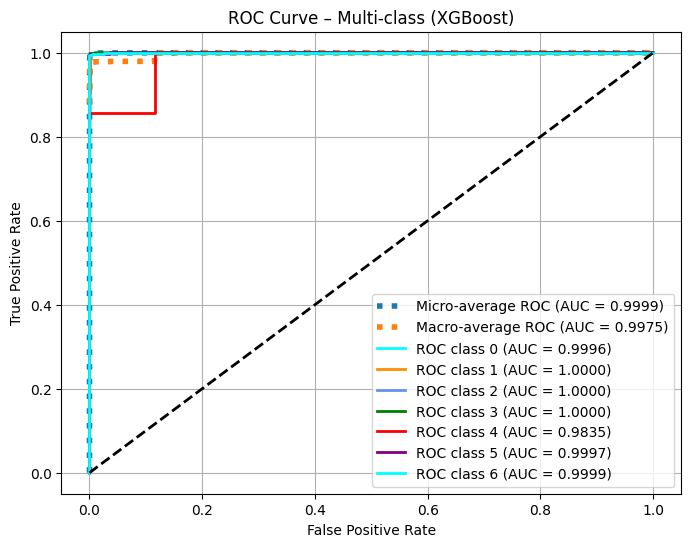

In [185]:
model_xgb_vae_1_2 = train_and_evaluate_xgb_epochs(X_vae, y_vae, X_test, y_test)


📊 Phân bố nhãn TRAIN:
label
0    14580
1     5289
2     3793
3     6149
4     3745
5     4720
6     5460
Name: count, dtype: int64

📊 Phân bố nhãn TEST:
Label
0    3645
1     393
2      19
3     609
4       7
5     251
6     436
Name: count, dtype: int64
[10 trees] Train: 0.1976s | Test: 0.0071s
[20 trees] Train: 0.3517s | Test: 0.0106s
[30 trees] Train: 0.4853s | Test: 0.0145s
[40 trees] Train: 0.6210s | Test: 0.0181s
[50 trees] Train: 0.7511s | Test: 0.0216s
[60 trees] Train: 0.8803s | Test: 0.0252s
[70 trees] Train: 1.0078s | Test: 0.0309s
[80 trees] Train: 1.1291s | Test: 0.0311s
[90 trees] Train: 1.3359s | Test: 0.0355s
[100 trees] Train: 1.3526s | Test: 0.0369s


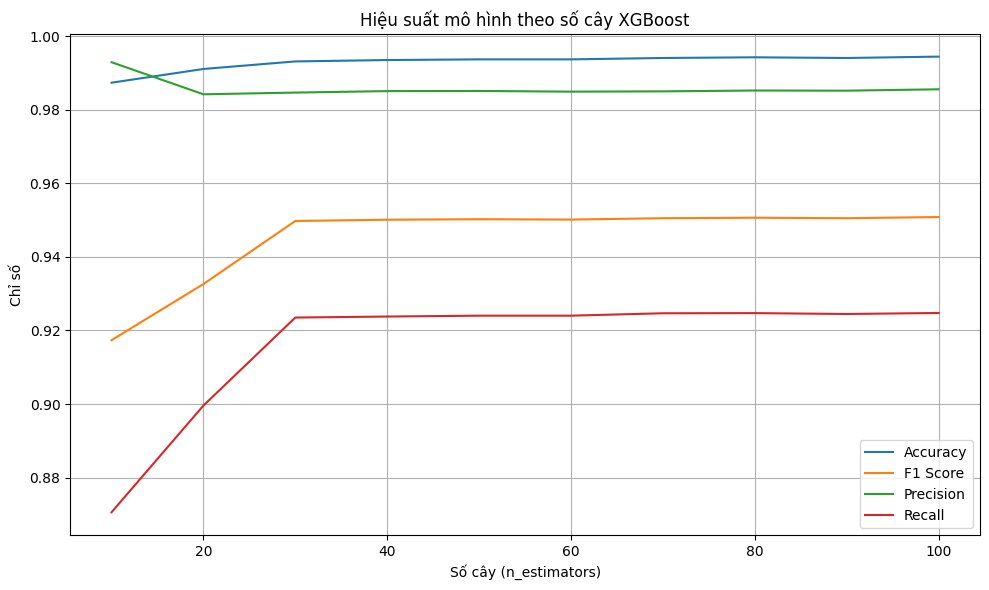


📊 Kết quả mô hình cuối cùng:
Accuracy : 0.9944
Precision: 0.9855
Recall   : 0.9247
F1-score : 0.9508
⏱ Thời gian train: 1.3778s
⏱ Thời gian test : 0.0369s

📄 Classification Report (Test set):
              precision    recall  f1-score   support

           0     0.9962    0.9964    0.9963      3645
           1     0.9898    0.9924    0.9911       393
           2     0.9375    0.7895    0.8571        19
           3     0.9870    0.9984    0.9927       609
           4     1.0000    0.7143    0.8333         7
           5     0.9881    0.9960    0.9921       251
           6     1.0000    0.9862    0.9931       436

    accuracy                         0.9944      5360
   macro avg     0.9855    0.9247    0.9508      5360
weighted avg     0.9944    0.9944    0.9943      5360



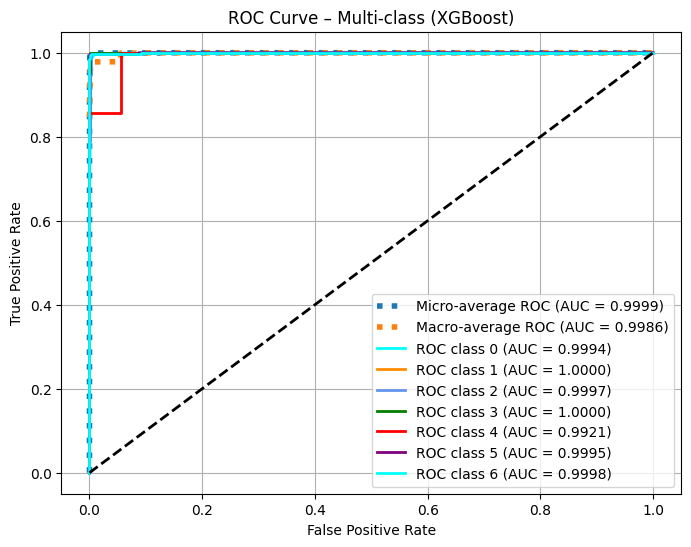

In [186]:
model_xgb_cgan_1_2= train_and_evaluate_xgb_epochs(X_cgan, y_cgan, X_test, y_test)

# Tỉ lệ 1:3

## SMOTE

[INFO] Phân phối ban đầu: Counter({0: 14580, 3: 2433, 6: 1744, 1: 1573, 5: 1004, 2: 77, 4: 29})
[INFO] Số mẫu bình thường: 14580
[INFO] Tổng số mẫu tấn công hiện có: 6860
[INFO] Cần sinh thêm tổng cộng: 36880 mẫu tấn công
[INFO] Lớp 1: 1573 → 7719
[INFO] Lớp 2: 77 → 6223
[INFO] Lớp 3: 2433 → 8579
[INFO] Lớp 4: 29 → 6175
[INFO] Lớp 5: 1004 → 7150
[INFO] Lớp 6: 1744 → 7890
[INFO] Phân phối nhãn sau khi tăng cường: Counter({np.int64(0): 14580, np.int64(3): 8579, np.int64(6): 7890, np.int64(1): 7719, np.int64(5): 7150, np.int64(2): 6223, np.int64(4): 6175})


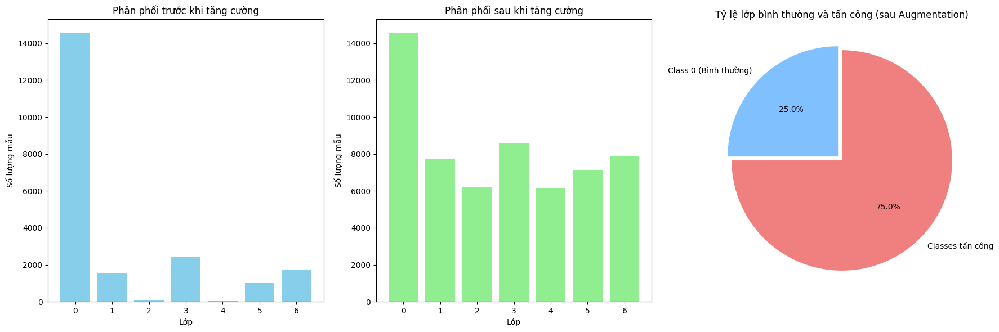

[INFO] Đã lưu dữ liệu tạo sinh vào file: generated_smote_3.csv


In [56]:
X_aug_smote_1_3, y_aug_smote_1_3 = augment_to_ratio_total_balanced(X_train, y_train, target_ratio=3, method='smote')

## VAE

[INFO] Phân phối ban đầu: Counter({0: 14580, 3: 2433, 6: 1744, 1: 1573, 5: 1004, 2: 77, 4: 29})
[INFO] Số mẫu bình thường: 14580
[INFO] Tổng số mẫu tấn công hiện có: 6860
[INFO] Cần sinh thêm tổng cộng: 36880 mẫu tấn công
[INFO] Lớp 1: Có 1573, cần sinh thêm 6146
[INFO] Lớp 2: Có 77, cần sinh thêm 6146
[INFO] Lớp 3: Có 2433, cần sinh thêm 6146
[INFO] Lớp 4: Có 29, cần sinh thêm 6146
[INFO] Lớp 5: Có 1004, cần sinh thêm 6146
[INFO] Lớp 6: Có 1744, cần sinh thêm 6146
[INFO] Phân phối nhãn sau khi tăng cường: Counter({np.int64(0): 14580, np.int64(3): 8579, np.int64(6): 7890, np.int64(1): 7719, np.int64(5): 7150, np.int64(2): 6223, np.int64(4): 6175})


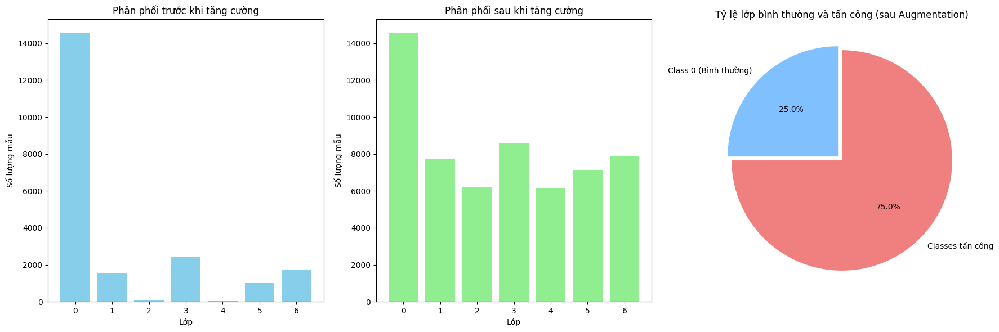

[INFO] Đã lưu dữ liệu tạo sinh vào file: generated_vae_3.csv


In [145]:
X_aug_vae_1_3, y_aug_vae_1_3 = augment_to_ratio_total_balanced(X_train, y_train, target_ratio=3, method='vae')

## CGAN

[INFO] Phân phối ban đầu: Counter({0: 14580, 3: 2433, 6: 1744, 1: 1573, 5: 1004, 2: 77, 4: 29})
[INFO] Số mẫu bình thường: 14580
[INFO] Tổng số mẫu tấn công hiện có: 6860
[INFO] Cần sinh thêm tổng cộng: 36880 mẫu tấn công
[INFO] Lớp 1: Có 1573, cần sinh thêm 6146
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━

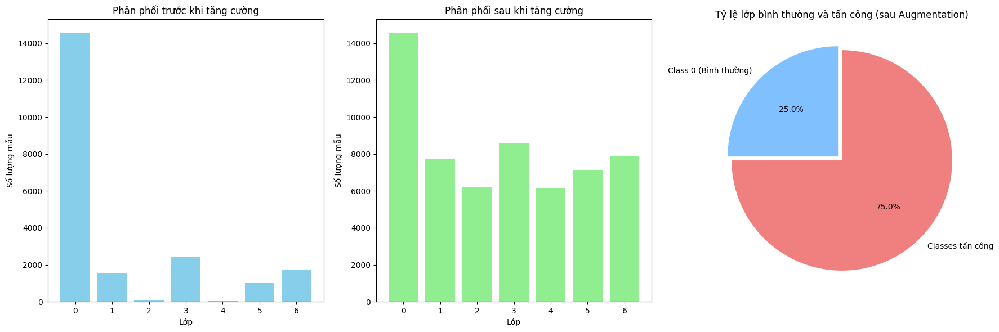

[INFO] Đã lưu dữ liệu tạo sinh vào file: generated_cgan_3.csv


In [57]:
X_aug_cgan_1_3, y_aug_cgan_1_3 = augment_to_ratio_total_balanced(X_train, y_train, target_ratio=3, method='cgan')

## So sánh chất lượng dữ liệu ở tỉ lệ 1:3

In [187]:
# Ví dụ: load dữ liệu gốc và dữ liệu sinh
original_df = pd.read_csv("/kaggle/input/selected-feature/selected_features.csv")
smote_df = pd.read_csv("/kaggle/working/generated_smote_3.csv")
cgan_df = pd.read_csv("/kaggle/working/generated_cgan_3.csv")
vae_df = pd.read_csv("/kaggle/working/generated_vae_3.csv")

X_orig, y_orig = split_X_y(original_df)
X_smote, y_smote = split_X_y(smote_df)
X_cgan, y_cgan = split_X_y(cgan_df)
X_vae, y_vae = split_X_y(vae_df)

In [147]:
best_k, all_results = find_best_k(X_smote)
print("Best k:", best_k)
for r in all_results:
    print(f"k={r['k']}, Inertia={r['inertia']:.2f}, Silhouette={r['silhouette_score']:.4f}")

Best k: 9
k=2, Inertia=9486.02, Silhouette=0.6501
k=3, Inertia=7541.48, Silhouette=0.5867
k=4, Inertia=5642.74, Silhouette=0.5478
k=5, Inertia=5284.65, Silhouette=0.5438
k=6, Inertia=3924.65, Silhouette=0.6411
k=7, Inertia=3113.29, Silhouette=0.6615
k=8, Inertia=2436.81, Silhouette=0.6999
k=9, Inertia=2018.73, Silhouette=0.7193
k=10, Inertia=1939.23, Silhouette=0.6363


In [148]:
best_k, all_results = find_best_k(X_cgan)
print("Best k:", best_k)
for r in all_results:
    print(f"k={r['k']}, Inertia={r['inertia']:.2f}, Silhouette={r['silhouette_score']:.4f}")

Best k: 10
k=2, Inertia=28374.31, Silhouette=0.4677
k=3, Inertia=25065.76, Silhouette=0.3500
k=4, Inertia=18069.66, Silhouette=0.4224
k=5, Inertia=11453.59, Silhouette=0.5489
k=6, Inertia=5798.88, Silhouette=0.6976
k=7, Inertia=4837.61, Silhouette=0.7073
k=8, Inertia=3393.64, Silhouette=0.7718
k=9, Inertia=2512.12, Silhouette=0.7867
k=10, Inertia=1943.40, Silhouette=0.8003


In [149]:
best_k, all_results = find_best_k(X_vae)
print("Best k:", best_k)
for r in all_results:
    print(f"k={r['k']}, Inertia={r['inertia']:.2f}, Silhouette={r['silhouette_score']:.4f}")

Best k: 10
k=2, Inertia=5988.60, Silhouette=0.6126
k=3, Inertia=5284.65, Silhouette=0.6052
k=4, Inertia=3648.60, Silhouette=0.6040
k=5, Inertia=2886.87, Silhouette=0.6208
k=6, Inertia=2642.35, Silhouette=0.6270
k=7, Inertia=2156.02, Silhouette=0.5922
k=8, Inertia=1937.48, Silhouette=0.6035
k=9, Inertia=1635.13, Silhouette=0.6197
k=10, Inertia=1384.64, Silhouette=0.6358


In [150]:
for name, X in [("Original", X_orig), ("SMOTE", X_smote), ("CGAN", X_cgan), ("VAE", X_vae)]:
    print(f"{name}: Average Entropy={avg_entropy(X):.4f}")

Original: Average Entropy=0.6435
SMOTE: Average Entropy=0.6836
CGAN: Average Entropy=1.2145
VAE: Average Entropy=0.9142


In [133]:
methods = {
    "SMOTE": X_smote,
    "CGAN": X_cgan,
    "VAE": X_vae
}

X_ref = X_orig  # dữ liệu gốc làm mốc so sánh

for name, X_gen in methods.items():
    # Căn chỉnh số lượng mẫu
    min_len = min(len(X_ref), len(X_gen))
    X_ref_aligned = X_ref.iloc[:min_len].reset_index(drop=True)
    X_gen_aligned = X_gen.iloc[:min_len].reset_index(drop=True)

    kl, wd, mse, mae = discrepancy_metrics(X_ref_aligned, X_gen_aligned)
    print(f"Original vs {name}: KL={kl:.4f}, WD={wd:.4f}, MSE={mse:.4f}, MAE={mae:.4f}")

Original vs SMOTE: KL=0.0058, WD=0.0094, MSE=0.0412, MAE=0.0789
Original vs CGAN: KL=0.0827, WD=0.0304, MSE=0.0478, MAE=0.0970
Original vs VAE: KL=0.0169, WD=0.0103, MSE=0.0410, MAE=0.0788


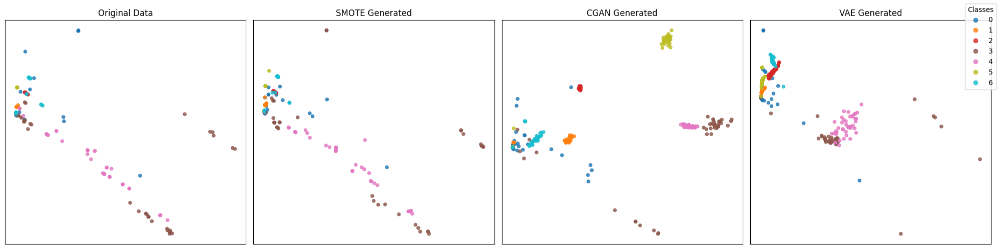

In [134]:
plot_generated_comparison(
    X_orig, y_orig,
    X_smote, y_smote,
    X_cgan, y_cgan,
    X_vae, y_vae,
    method='pca',
    sample_size=300
)

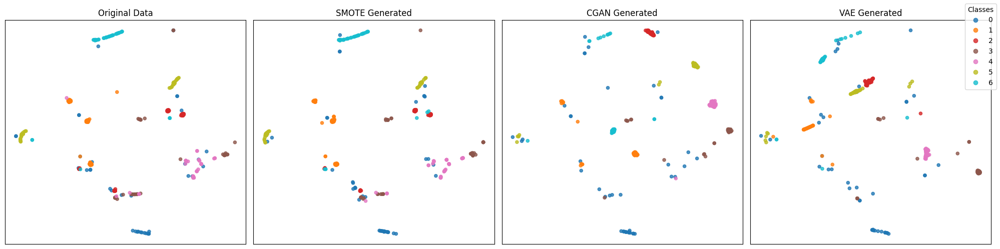

In [135]:

plot_generated_comparison(
    X_orig, y_orig,
    X_smote, y_smote,
    X_cgan, y_cgan,
    X_vae, y_vae,
    method='tsne',
    sample_size=300
)

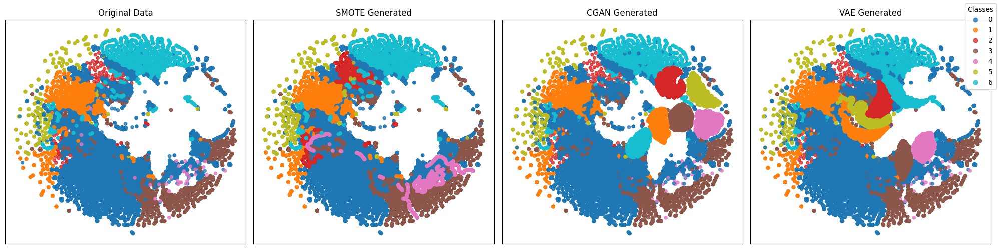

In [136]:
plot_generated_full(X_orig, y_orig,
                    X_smote, y_smote,
                    X_cgan, y_cgan,
                    X_vae, y_vae,
                    method="tsne")

Feature: Init_Win_bytes_forward
Original:
count    26800.000000
mean         0.129350
std          0.221253
min          0.000000
25%          0.000000
50%          0.003967
75%          0.125015
max          1.000000
Name: Init_Win_bytes_forward, dtype: float64
Generated:
count    58316.000000
mean         0.163190
std          0.208937
min          0.000000
25%          0.003845
50%          0.015640
75%          0.445572
max          1.000000
Name: Init_Win_bytes_forward, dtype: float64
NaN count in generated: 0


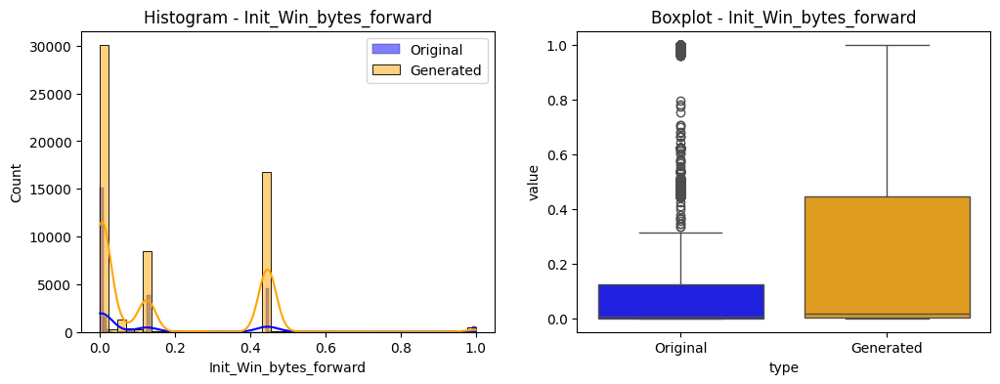

Feature: Init_Win_bytes_forward
Original:
count    26800.000000
mean         0.129350
std          0.221253
min          0.000000
25%          0.000000
50%          0.003967
75%          0.125015
max          1.000000
Name: Init_Win_bytes_forward, dtype: float64
Generated:
count    58316.000000
mean         0.236379
std          0.259597
min          0.000000
25%          0.005462
50%          0.119430
75%          0.437502
max          1.000000
Name: Init_Win_bytes_forward, dtype: float64
NaN count in generated: 0


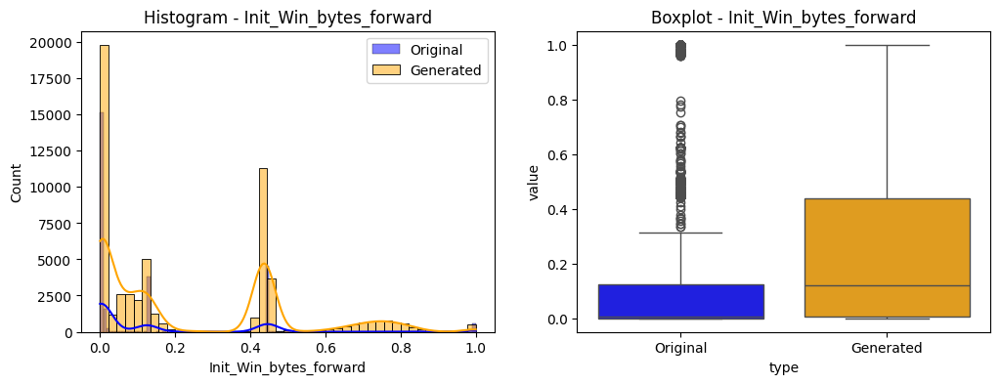

Feature: Init_Win_bytes_forward
Original:
count    26800.000000
mean         0.129350
std          0.221253
min          0.000000
25%          0.000000
50%          0.003967
75%          0.125015
max          1.000000
Name: Init_Win_bytes_forward, dtype: float64
Generated:
count    58316.000000
mean         0.163502
std          0.174829
min          0.000000
25%          0.026947
50%          0.082742
75%          0.274179
max          1.000000
Name: Init_Win_bytes_forward, dtype: float64
NaN count in generated: 0


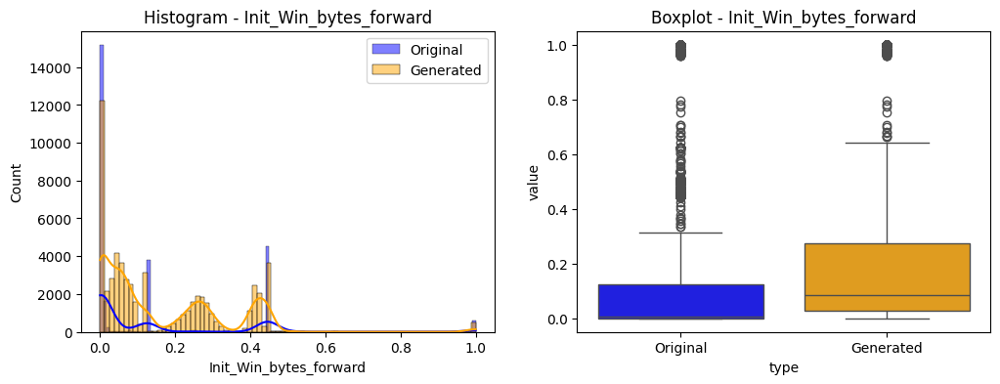

In [137]:
plot_hist_box(X_orig, X_smote, feature_idx=0)

plot_hist_box(X_orig, X_cgan, feature_idx=0)

plot_hist_box(X_orig, X_vae, feature_idx=0)

## RANDOM FOREST


📊 Phân bố nhãn TRAIN:
label
0    14580
1     7719
2     6223
3     8579
4     6175
5     7150
6     7890
Name: count, dtype: int64

📊 Phân bố nhãn TEST:
Label
0    3645
1     393
2      19
3     609
4       7
5     251
6     436
Name: count, dtype: int64


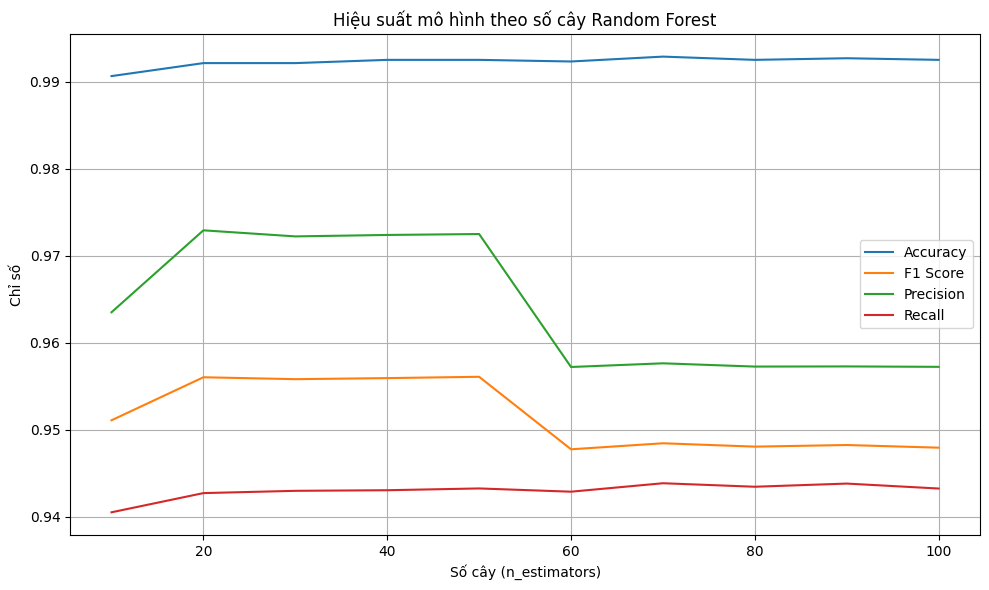


📊 Hiệu suất mô hình cuối cùng:
Accuracy : 0.9925
Precision: 0.9572
Recall   : 0.9433
F1-score : 0.9480
⏱️ Thời gian train: 3.0765 giây
⏱️ Thời gian test : 0.0455 giây

📄 Classification Report (Test set):
              precision    recall  f1-score   support

           0     0.9945    0.9948    0.9947      3645
           1     0.9874    0.9949    0.9911       393
           2     1.0000    0.7895    0.8824        19
           3     0.9870    0.9951    0.9910       609
           4     0.7500    0.8571    0.8000         7
           5     0.9842    0.9920    0.9881       251
           6     0.9977    0.9794    0.9884       436

    accuracy                         0.9925      5360
   macro avg     0.9572    0.9433    0.9480      5360
weighted avg     0.9926    0.9925    0.9925      5360



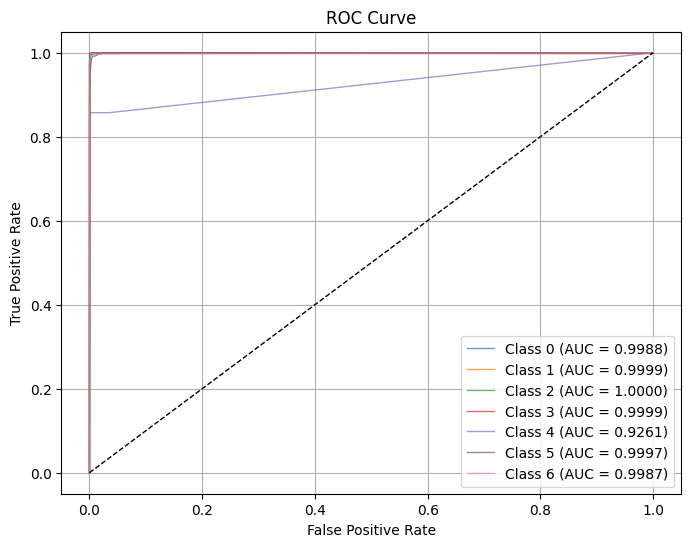

In [188]:
model_rf_smote_1_3 = train_and_evaluate_rf_epochs(X_smote, y_smote, X_test, y_test)


📊 Phân bố nhãn TRAIN:
label
0    14580
1     7719
2     6223
3     8579
4     6175
5     7150
6     7890
Name: count, dtype: int64

📊 Phân bố nhãn TEST:
Label
0    3645
1     393
2      19
3     609
4       7
5     251
6     436
Name: count, dtype: int64


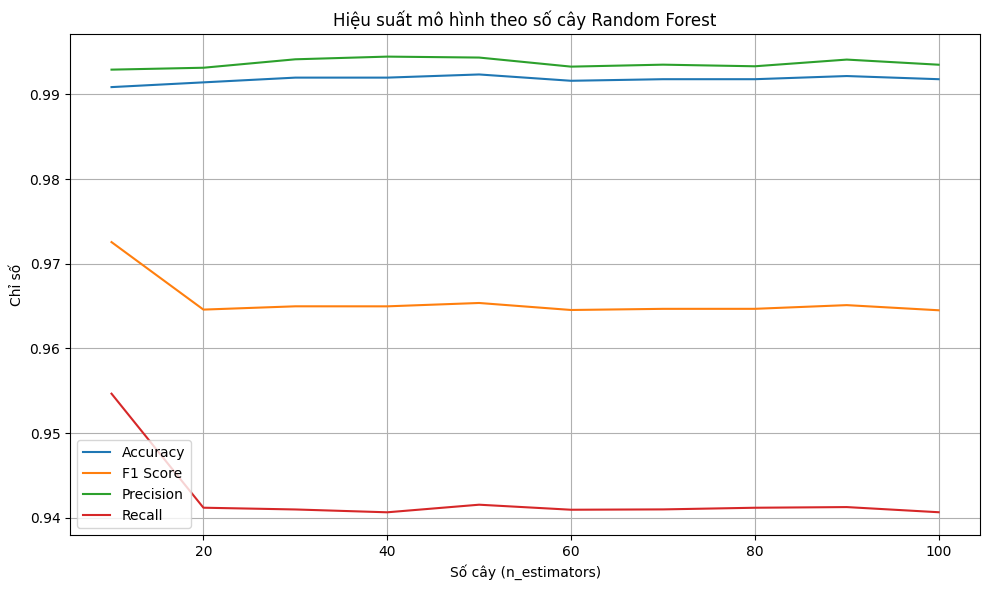


📊 Hiệu suất mô hình cuối cùng:
Accuracy : 0.9918
Precision: 0.9935
Recall   : 0.9407
F1-score : 0.9645
⏱️ Thời gian train: 3.7284 giây
⏱️ Thời gian test : 0.0461 giây

📄 Classification Report (Test set):
              precision    recall  f1-score   support

           0     0.9921    0.9962    0.9941      3645
           1     0.9898    0.9898    0.9898       393
           2     1.0000    0.7895    0.8824        19
           3     0.9885    0.9869    0.9877       609
           4     1.0000    0.8571    0.9231         7
           5     0.9841    0.9880    0.9861       251
           6     1.0000    0.9771    0.9884       436

    accuracy                         0.9918      5360
   macro avg     0.9935    0.9407    0.9645      5360
weighted avg     0.9918    0.9918    0.9917      5360



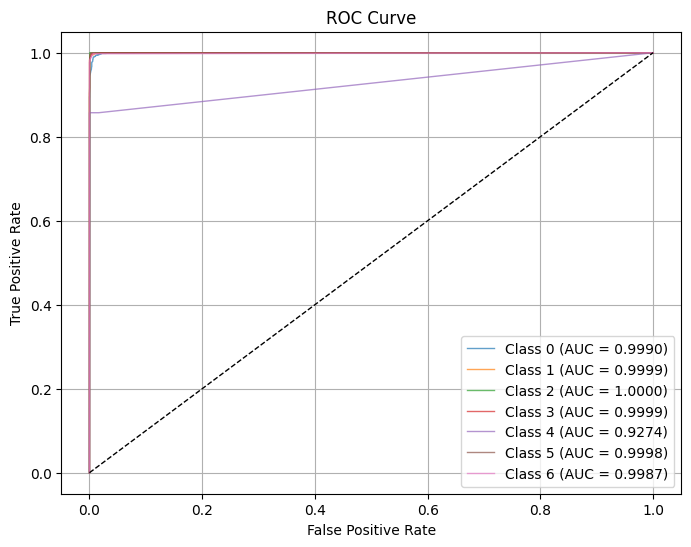

In [189]:
model_rf_cgan_1_3 = train_and_evaluate_rf_epochs(X_cgan, y_cgan, X_test, y_test)


📊 Phân bố nhãn TRAIN:
label
0    14580
1     7719
2     6223
3     8579
4     6175
5     7150
6     7890
Name: count, dtype: int64

📊 Phân bố nhãn TEST:
Label
0    3645
1     393
2      19
3     609
4       7
5     251
6     436
Name: count, dtype: int64


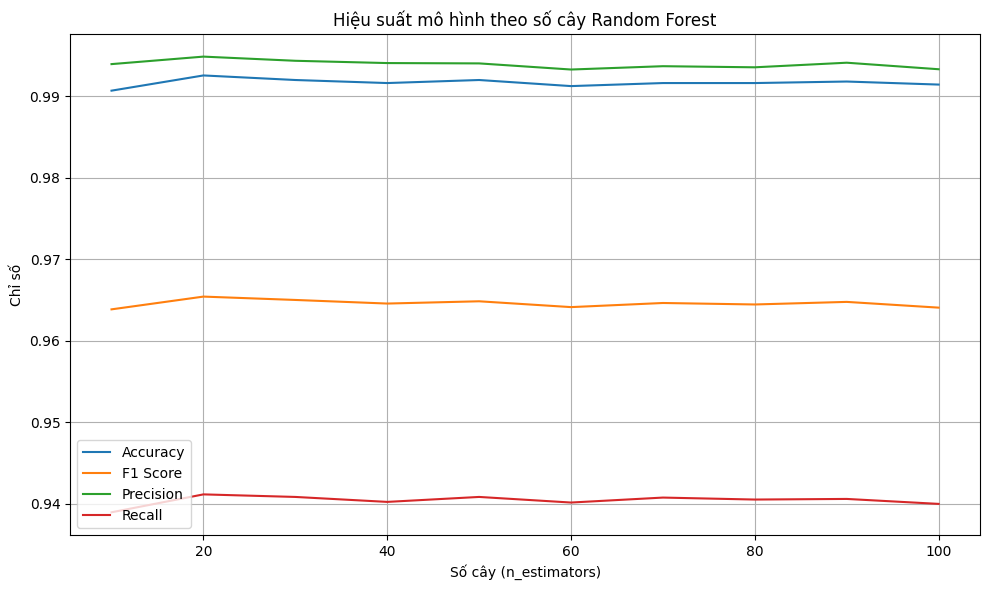


📊 Hiệu suất mô hình cuối cùng:
Accuracy : 0.9914
Precision: 0.9933
Recall   : 0.9400
F1-score : 0.9641
⏱️ Thời gian train: 4.2019 giây
⏱️ Thời gian test : 0.0457 giây

📄 Classification Report (Test set):
              precision    recall  f1-score   support

           0     0.9915    0.9962    0.9938      3645
           1     0.9873    0.9898    0.9886       393
           2     1.0000    0.7895    0.8824        19
           3     0.9901    0.9869    0.9885       609
           4     1.0000    0.8571    0.9231         7
           5     0.9841    0.9880    0.9861       251
           6     1.0000    0.9725    0.9860       436

    accuracy                         0.9914      5360
   macro avg     0.9933    0.9400    0.9641      5360
weighted avg     0.9914    0.9914    0.9914      5360



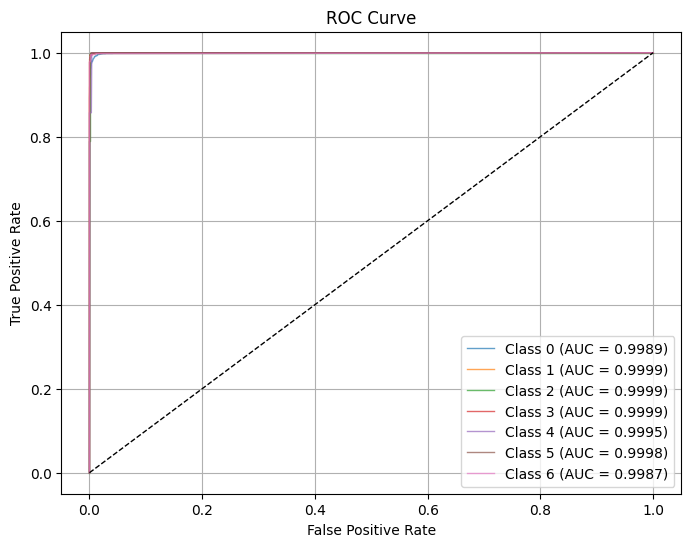

In [190]:
model_rf_vae_1_3 = train_and_evaluate_rf_epochs(X_vae, y_vae, X_test, y_test)

## XGBoost


📊 Phân bố nhãn TRAIN:
label
0    14580
1     7719
2     6223
3     8579
4     6175
5     7150
6     7890
Name: count, dtype: int64

📊 Phân bố nhãn TEST:
Label
0    3645
1     393
2      19
3     609
4       7
5     251
6     436
Name: count, dtype: int64
[10 trees] Train: 0.2296s | Test: 0.0067s
[20 trees] Train: 0.4100s | Test: 0.0107s
[30 trees] Train: 0.5809s | Test: 0.0148s
[40 trees] Train: 0.7630s | Test: 0.0185s
[50 trees] Train: 1.0303s | Test: 0.0240s
[60 trees] Train: 1.1064s | Test: 0.0269s
[70 trees] Train: 1.2615s | Test: 0.0307s
[80 trees] Train: 1.4086s | Test: 0.0344s
[90 trees] Train: 1.5627s | Test: 0.0366s
[100 trees] Train: 1.7262s | Test: 0.0414s


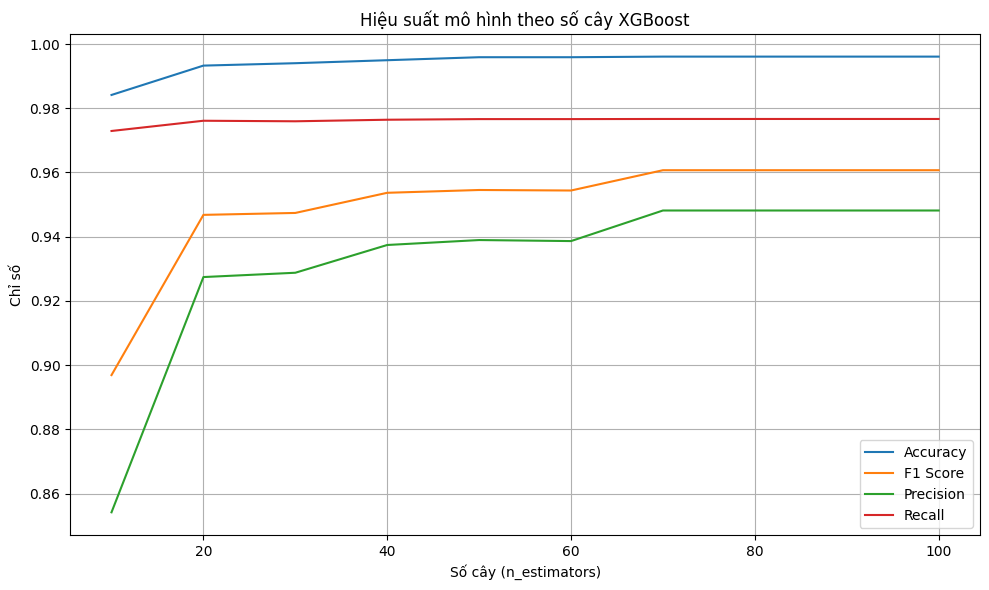


📊 Kết quả mô hình cuối cùng:
Accuracy : 0.9961
Precision: 0.9482
Recall   : 0.9767
F1-score : 0.9607
⏱ Thời gian train: 1.7176s
⏱ Thời gian test : 0.0564s

📄 Classification Report (Test set):
              precision    recall  f1-score   support

           0     0.9981    0.9964    0.9973      3645
           1     0.9924    0.9949    0.9936       393
           2     1.0000    1.0000    1.0000        19
           3     0.9918    0.9967    0.9943       609
           4     0.6667    0.8571    0.7500         7
           5     0.9881    0.9960    0.9921       251
           6     1.0000    0.9954    0.9977       436

    accuracy                         0.9961      5360
   macro avg     0.9482    0.9767    0.9607      5360
weighted avg     0.9962    0.9961    0.9961      5360



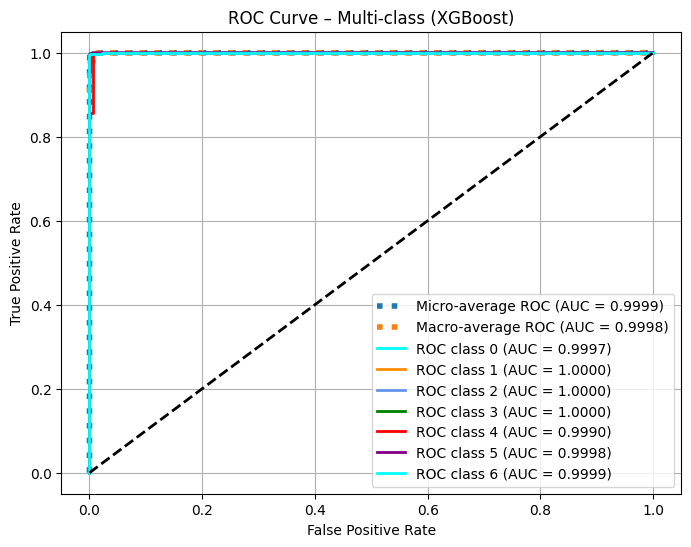

In [191]:
model_xgb_smote_1_3 = train_and_evaluate_xgb_epochs(X_smote, y_smote, X_test, y_test)


📊 Phân bố nhãn TRAIN:
label
0    14580
1     7719
2     6223
3     8579
4     6175
5     7150
6     7890
Name: count, dtype: int64

📊 Phân bố nhãn TEST:
Label
0    3645
1     393
2      19
3     609
4       7
5     251
6     436
Name: count, dtype: int64
[10 trees] Train: 0.2410s | Test: 0.0068s
[20 trees] Train: 0.4030s | Test: 0.0104s
[30 trees] Train: 0.5925s | Test: 0.0143s
[40 trees] Train: 0.7625s | Test: 0.0193s
[50 trees] Train: 0.9454s | Test: 0.0240s
[60 trees] Train: 1.1349s | Test: 0.0270s
[70 trees] Train: 1.3274s | Test: 0.0284s
[80 trees] Train: 1.3830s | Test: 0.0321s
[90 trees] Train: 1.5267s | Test: 0.0351s
[100 trees] Train: 1.6586s | Test: 0.0380s


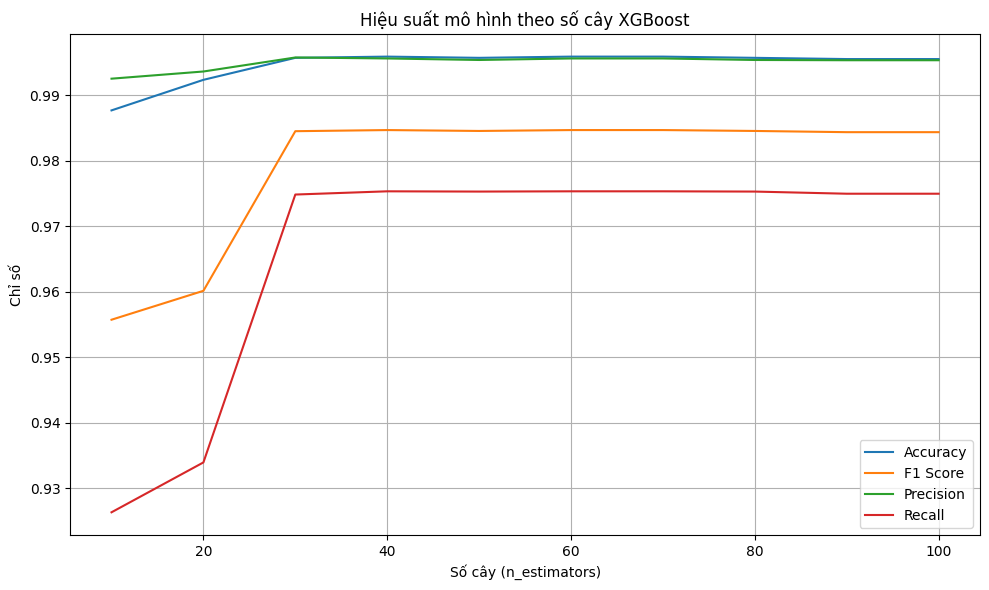


📊 Kết quả mô hình cuối cùng:
Accuracy : 0.9955
Precision: 0.9953
Recall   : 0.9750
F1-score : 0.9844
⏱ Thời gian train: 1.6529s
⏱ Thời gian test : 0.0374s

📄 Classification Report (Test set):
              precision    recall  f1-score   support

           0     0.9967    0.9973    0.9970      3645
           1     0.9924    0.9924    0.9924       393
           2     1.0000    1.0000    1.0000        19
           3     0.9902    0.9934    0.9918       609
           4     1.0000    0.8571    0.9231         7
           5     0.9881    0.9960    0.9921       251
           6     1.0000    0.9885    0.9942       436

    accuracy                         0.9955      5360
   macro avg     0.9953    0.9750    0.9844      5360
weighted avg     0.9955    0.9955    0.9955      5360



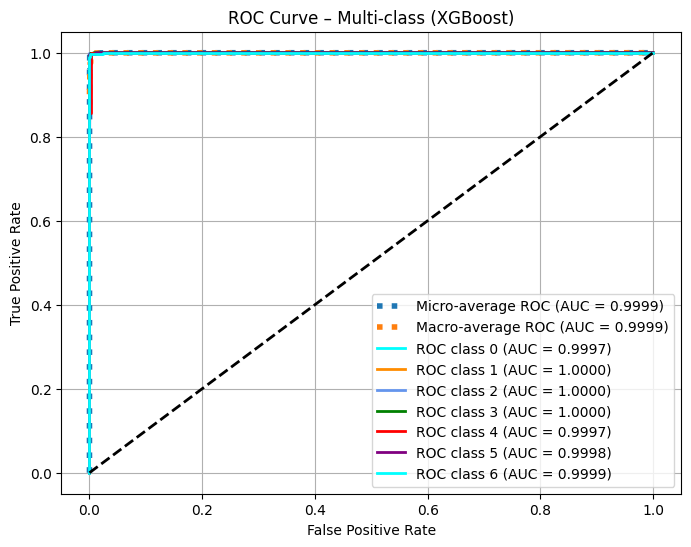

In [192]:
model_xgb_cgan_1_3 = train_and_evaluate_xgb_epochs(X_cgan, y_cgan, X_test, y_test)


📊 Phân bố nhãn TRAIN:
label
0    14580
1     7719
2     6223
3     8579
4     6175
5     7150
6     7890
Name: count, dtype: int64

📊 Phân bố nhãn TEST:
Label
0    3645
1     393
2      19
3     609
4       7
5     251
6     436
Name: count, dtype: int64
[10 trees] Train: 0.2461s | Test: 0.0068s
[20 trees] Train: 0.4161s | Test: 0.0140s
[30 trees] Train: 0.5972s | Test: 0.0148s
[40 trees] Train: 0.7691s | Test: 0.0192s
[50 trees] Train: 1.0496s | Test: 0.0221s
[60 trees] Train: 1.0970s | Test: 0.0257s
[70 trees] Train: 1.2418s | Test: 0.0292s
[80 trees] Train: 1.4001s | Test: 0.0331s
[90 trees] Train: 1.5371s | Test: 0.0348s
[100 trees] Train: 1.6997s | Test: 0.0378s


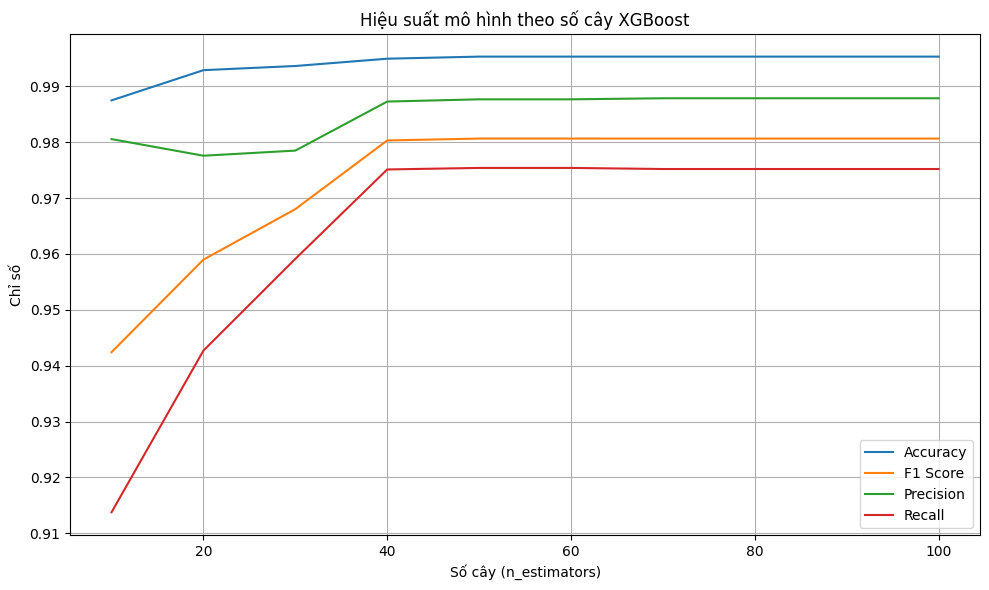


📊 Kết quả mô hình cuối cùng:
Accuracy : 0.9953
Precision: 0.9879
Recall   : 0.9752
F1-score : 0.9807
⏱ Thời gian train: 1.6996s
⏱ Thời gian test : 0.0376s

📄 Classification Report (Test set):
              precision    recall  f1-score   support

           0     0.9970    0.9967    0.9968      3645
           1     0.9898    0.9924    0.9911       393
           2     0.9500    1.0000    0.9744        19
           3     0.9902    0.9934    0.9918       609
           4     1.0000    0.8571    0.9231         7
           5     0.9881    0.9960    0.9921       251
           6     1.0000    0.9908    0.9954       436

    accuracy                         0.9953      5360
   macro avg     0.9879    0.9752    0.9807      5360
weighted avg     0.9954    0.9953    0.9953      5360



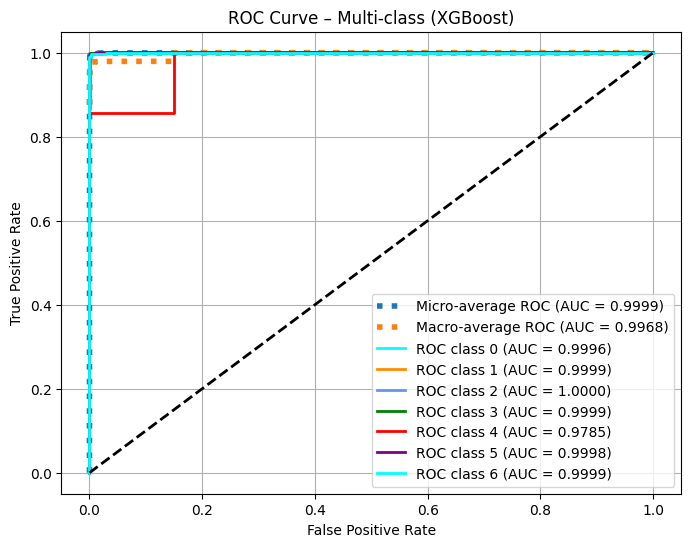

In [193]:
model_xgb_vae_1_3 = train_and_evaluate_xgb_epochs(X_vae, y_vae, X_test, y_test)

# Tỉ lệ 1:4

## SMOTE

[INFO] Phân phối ban đầu: Counter({0: 14580, 3: 2433, 6: 1744, 1: 1573, 5: 1004, 2: 77, 4: 29})
[INFO] Số mẫu bình thường: 14580
[INFO] Tổng số mẫu tấn công hiện có: 6860
[INFO] Cần sinh thêm tổng cộng: 51460 mẫu tấn công
[INFO] Lớp 1: 1573 → 10149
[INFO] Lớp 2: 77 → 8653
[INFO] Lớp 3: 2433 → 11009
[INFO] Lớp 4: 29 → 8605
[INFO] Lớp 5: 1004 → 9580
[INFO] Lớp 6: 1744 → 10320
[INFO] Phân phối nhãn sau khi tăng cường: Counter({np.int64(0): 14580, np.int64(3): 11009, np.int64(6): 10320, np.int64(1): 10149, np.int64(5): 9580, np.int64(2): 8653, np.int64(4): 8605})


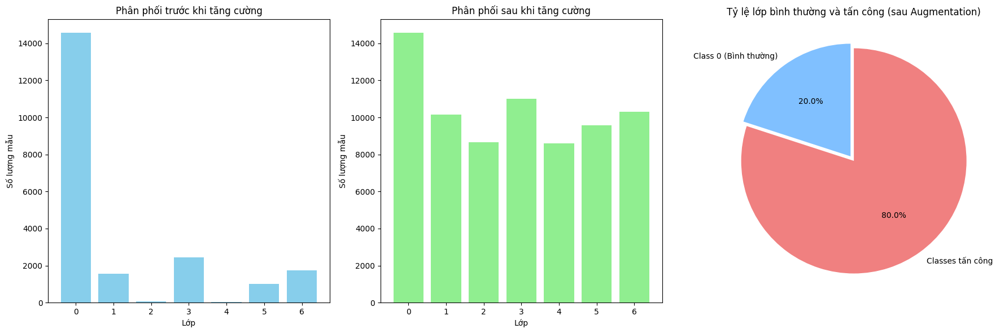

[INFO] Đã lưu dữ liệu tạo sinh vào file: generated_smote_4.csv


In [42]:
X_aug_smote_1_4, y_aug_smote_1_4 = augment_to_ratio_total_balanced(X_train, y_train, target_ratio=4, method='smote')

## VAE

[INFO] Phân phối ban đầu: Counter({0: 14580, 3: 2433, 6: 1744, 1: 1573, 5: 1004, 2: 77, 4: 29})
[INFO] Số mẫu bình thường: 14580
[INFO] Tổng số mẫu tấn công hiện có: 6860
[INFO] Cần sinh thêm tổng cộng: 51460 mẫu tấn công
[INFO] Lớp 1: Có 1573, cần sinh thêm 8576
[INFO] Lớp 2: Có 77, cần sinh thêm 8576
[INFO] Lớp 3: Có 2433, cần sinh thêm 8576
[INFO] Lớp 4: Có 29, cần sinh thêm 8576
[INFO] Lớp 5: Có 1004, cần sinh thêm 8576
[INFO] Lớp 6: Có 1744, cần sinh thêm 8576
[INFO] Phân phối nhãn sau khi tăng cường: Counter({np.int64(0): 14580, np.int64(3): 11009, np.int64(6): 10320, np.int64(1): 10149, np.int64(5): 9580, np.int64(2): 8653, np.int64(4): 8605})


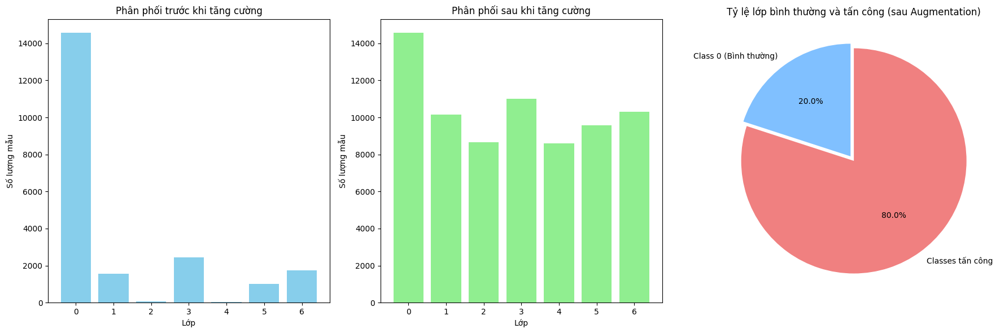

[INFO] Đã lưu dữ liệu tạo sinh vào file: generated_vae_4.csv


In [52]:
X_aug_vae_1_4, y_aug_vae_1_4 = augment_to_ratio_total_balanced(X_train, y_train, target_ratio=4, method='vae')

## CGAN

[INFO] Phân phối ban đầu: Counter({0: 14580, 3: 2433, 6: 1744, 1: 1573, 5: 1004, 2: 77, 4: 29})
[INFO] Số mẫu bình thường: 14580
[INFO] Tổng số mẫu tấn công hiện có: 6860
[INFO] Cần sinh thêm tổng cộng: 51460 mẫu tấn công
[INFO] Lớp 1: Có 1573, cần sinh thêm 8576
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━

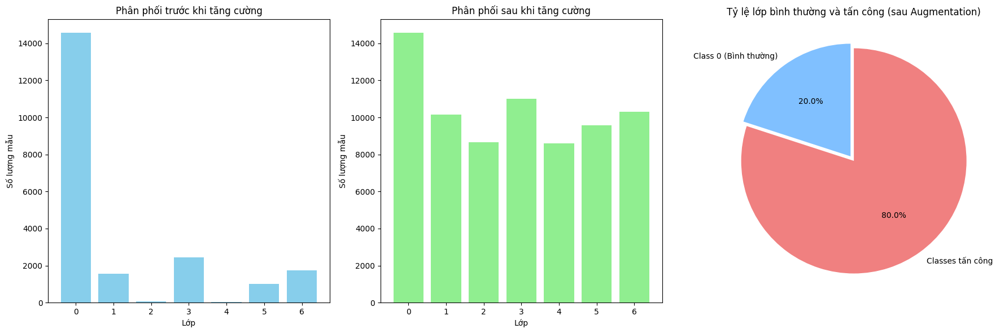

[INFO] Đã lưu dữ liệu tạo sinh vào file: generated_cgan_4.csv


In [35]:
X_aug_cgan_1_4, y_aug_cgan_1_4 = augment_to_ratio_total_balanced(X_train, y_train, target_ratio=4, method='cgan')

## So sánh chất lượng dữ liệu ở tỉ lệ 1:4

In [74]:
# Ví dụ: load dữ liệu gốc và dữ liệu sinh
original_df = pd.read_csv("/kaggle/input/selected-feature/selected_features.csv")
smote_df = pd.read_csv("/kaggle/input/generated-data-1-4/generated_smote_4.csv")
cgan_df = pd.read_csv("/kaggle/input/generated-data-1-4/generated_cgan_4.csv")
vae_df = pd.read_csv("/kaggle/input/generated-data-1-4/generated_vae_4.csv")

X_orig, y_orig = split_X_y(original_df)
X_smote, y_smote = split_X_y(smote_df)
X_cgan, y_cgan = split_X_y(cgan_df)
X_vae, y_vae = split_X_y(vae_df)

In [76]:
best_k, all_results = find_best_k(X_smote)
print("Best k:", best_k)
for r in all_results:
    print(f"k={r['k']}, Inertia={r['inertia']:.2f}, Silhouette={r['silhouette_score']:.4f}")

Best k: 10
k=2, Inertia=11751.70, Silhouette=0.6477
k=3, Inertia=8801.15, Silhouette=0.5457
k=4, Inertia=7062.84, Silhouette=0.5547
k=5, Inertia=5915.33, Silhouette=0.6315
k=6, Inertia=4059.01, Silhouette=0.6631
k=7, Inertia=3241.12, Silhouette=0.7085
k=8, Inertia=2852.91, Silhouette=0.7065
k=9, Inertia=2384.95, Silhouette=0.7242
k=10, Inertia=2066.91, Silhouette=0.7305


In [77]:
best_k, all_results = find_best_k(X_cgan)
print("Best k:", best_k)
for r in all_results:
    print(f"k={r['k']}, Inertia={r['inertia']:.2f}, Silhouette={r['silhouette_score']:.4f}")

Best k: 9
k=2, Inertia=37542.40, Silhouette=0.5262
k=3, Inertia=26719.73, Silhouette=0.5741
k=4, Inertia=12431.52, Silhouette=0.6731
k=5, Inertia=10623.07, Silhouette=0.6883
k=6, Inertia=6120.90, Silhouette=0.6706
k=7, Inertia=5935.27, Silhouette=0.6684
k=8, Inertia=3017.83, Silhouette=0.7621
k=9, Inertia=2457.21, Silhouette=0.7709
k=10, Inertia=2294.36, Silhouette=0.7100


In [75]:
best_k, all_results = find_best_k(X_vae)
print("Best k:", best_k)
for r in all_results:
    print(f"k={r['k']}, Inertia={r['inertia']:.2f}, Silhouette={r['silhouette_score']:.4f}")

Best k: 6
k=2, Inertia=6814.58, Silhouette=0.6178
k=3, Inertia=6093.61, Silhouette=0.6134
k=4, Inertia=4113.31, Silhouette=0.6167
k=5, Inertia=3064.50, Silhouette=0.6400
k=6, Inertia=2844.60, Silhouette=0.6440
k=7, Inertia=2290.05, Silhouette=0.6105
k=8, Inertia=2058.18, Silhouette=0.6266
k=9, Inertia=1814.58, Silhouette=0.6317
k=10, Inertia=1605.88, Silhouette=0.6358


In [196]:
for name, X in [("Original", X_orig), ("SMOTE", X_smote), ("CGAN", X_cgan), ("VAE", X_vae)]:
    print(f"{name}: Average Entropy={avg_entropy(X):.4f}")

Original: Average Entropy=0.6435
SMOTE: Average Entropy=0.6847
CGAN: Average Entropy=1.2717
VAE: Average Entropy=0.9230


In [60]:
methods = {
    "SMOTE": X_smote,
    "CGAN": X_cgan,
    "VAE": X_vae
}

X_ref = X_orig  # dữ liệu gốc làm mốc so sánh

for name, X_gen in methods.items():
    # Căn chỉnh số lượng mẫu
    min_len = min(len(X_ref), len(X_gen))
    X_ref_aligned = X_ref.iloc[:min_len].reset_index(drop=True)
    X_gen_aligned = X_gen.iloc[:min_len].reset_index(drop=True)

    kl, wd, mse, mae = discrepancy_metrics(X_ref_aligned, X_gen_aligned)
    print(f"Original vs {name}: KL={kl:.4f}, WD={wd:.4f}, MSE={mse:.4f}, MAE={mae:.4f}")

Original vs SMOTE: KL=0.0058, WD=0.0094, MSE=0.0412, MAE=0.0789
Original vs CGAN: KL=0.0852, WD=0.0287, MSE=0.0465, MAE=0.0965
Original vs VAE: KL=0.0172, WD=0.0103, MSE=0.0410, MAE=0.0788


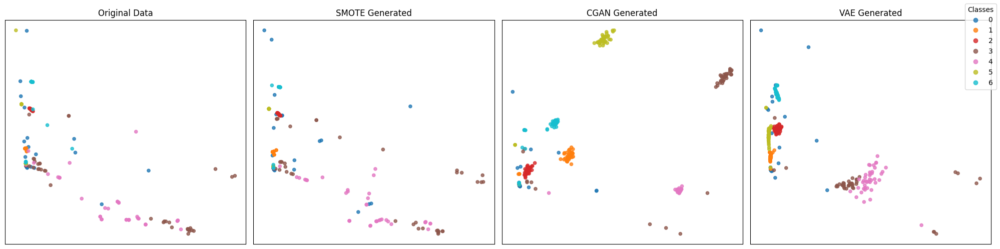

In [59]:
plot_generated_comparison(
    X_orig, y_orig,
    X_smote, y_smote,
    X_cgan, y_cgan,
    X_vae, y_vae,
    method='pca',
    sample_size=300
)

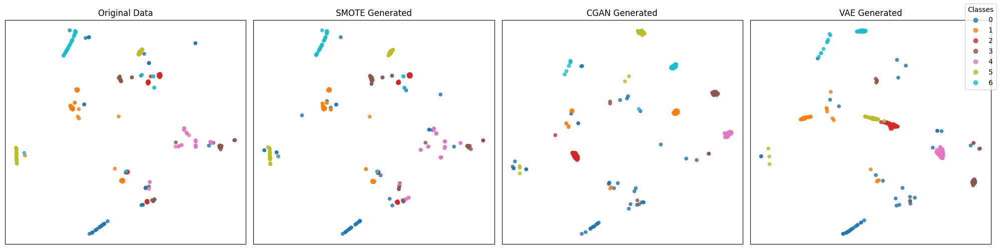

In [60]:
plot_generated_comparison(
    X_orig, y_orig,
    X_smote, y_smote,
    X_cgan, y_cgan,
    X_vae, y_vae,
    method='tsne',
    sample_size=300
)

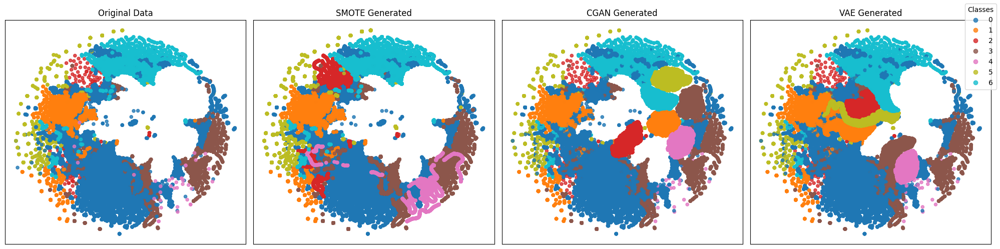

In [204]:
plot_generated_full(X_orig, y_orig,
                    X_smote, y_smote,
                    X_cgan, y_cgan,
                    X_vae, y_vae,
                    method="tsne")

Feature: Init_Win_bytes_forward
Original:
count    26800.000000
mean         0.129350
std          0.221253
min          0.000000
25%          0.000000
50%          0.003967
75%          0.125015
max          1.000000
Name: Init_Win_bytes_forward, dtype: float64
Generated:
count    72896.000000
mean         0.166885
std          0.207174
min          0.000000
25%          0.003891
50%          0.022049
75%          0.445572
max          1.000000
Name: Init_Win_bytes_forward, dtype: float64
NaN count in generated: 0


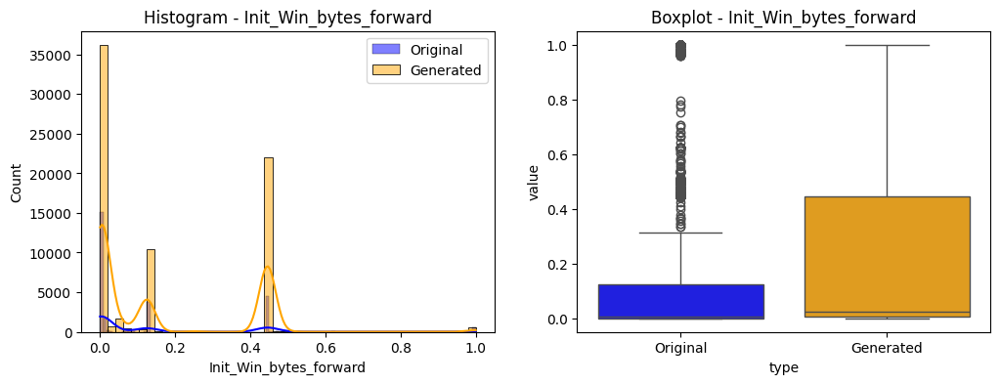

Feature: Init_Win_bytes_forward
Original:
count    26800.000000
mean         0.129350
std          0.221253
min          0.000000
25%          0.000000
50%          0.003967
75%          0.125015
max          1.000000
Name: Init_Win_bytes_forward, dtype: float64
Generated:
count    72896.000000
mean         0.229194
std          0.195968
min          0.000000
25%          0.060926
50%          0.125015
75%          0.438253
max          1.000000
Name: Init_Win_bytes_forward, dtype: float64
NaN count in generated: 0


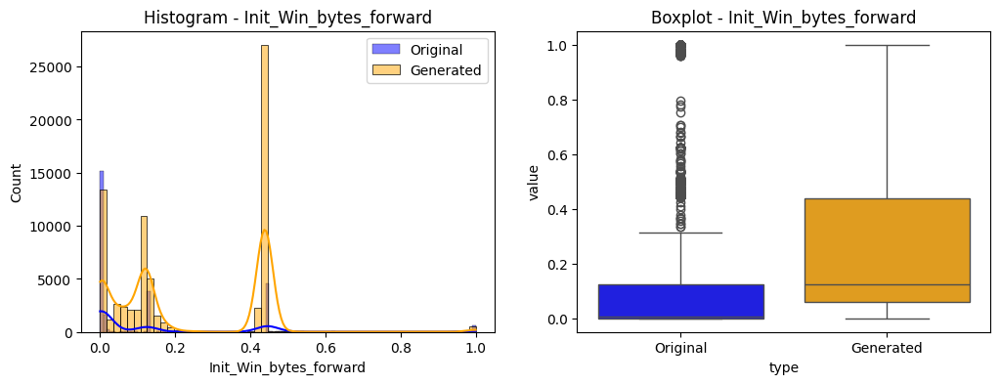

Feature: Init_Win_bytes_forward
Original:
count    26800.000000
mean         0.129350
std          0.221253
min          0.000000
25%          0.000000
50%          0.003967
75%          0.125015
max          1.000000
Name: Init_Win_bytes_forward, dtype: float64
Generated:
count    72896.000000
mean         0.167466
std          0.178712
min         -0.386703
25%          0.017787
50%          0.107076
75%          0.264344
max          1.000000
Name: Init_Win_bytes_forward, dtype: float64
NaN count in generated: 0


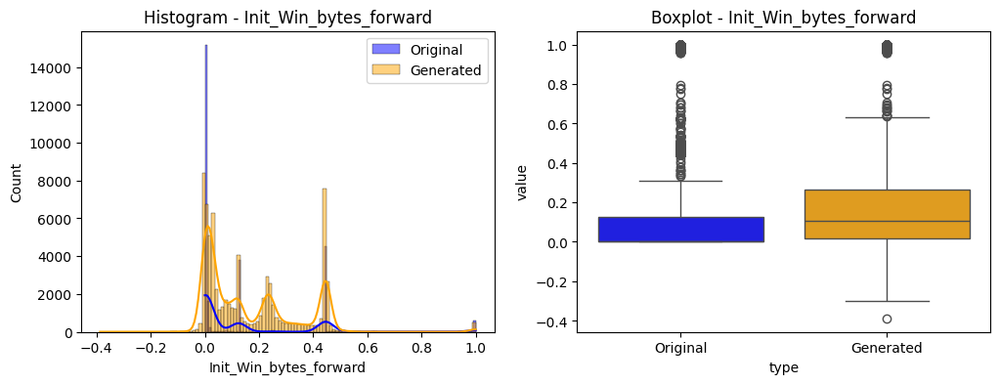

In [ ]:
plot_hist_box(X_orig, X_smote, feature_idx=0)

plot_hist_box(X_orig, X_cgan, feature_idx=0)

plot_hist_box(X_orig, X_vae, feature_idx=0)

## Random Forest


📊 Phân bố nhãn TRAIN:
label
0    14580
1    10149
2     8653
3    11009
4     8605
5     9580
6    10320
Name: count, dtype: int64

📊 Phân bố nhãn TEST:
Label
0    3645
1     393
2      19
3     609
4       7
5     251
6     436
Name: count, dtype: int64


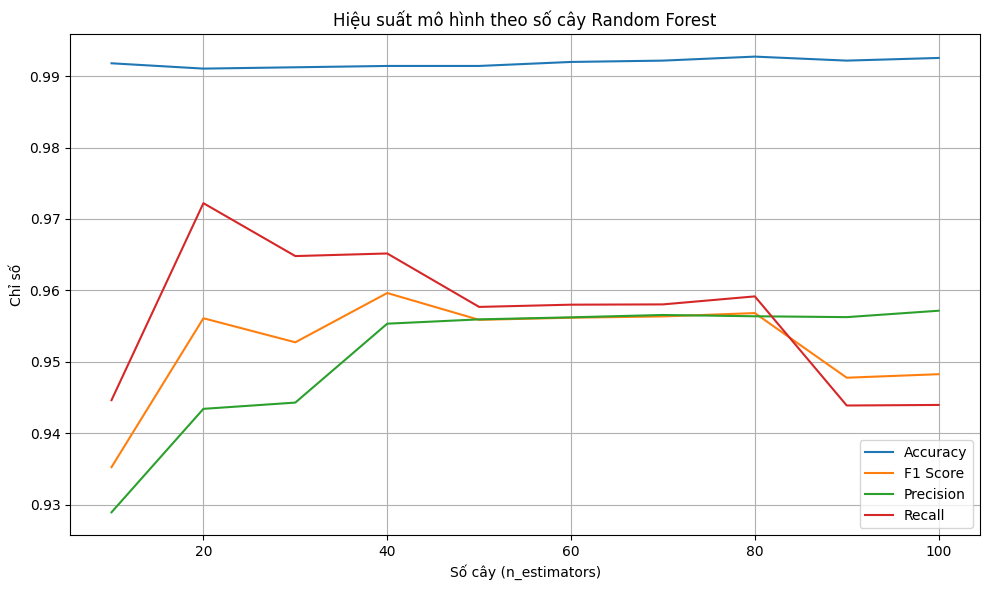


📊 Hiệu suất mô hình cuối cùng:
Accuracy : 0.9925
Precision: 0.9572
Recall   : 0.9440
F1-score : 0.9483
⏱️ Thời gian train: 3.8370 giây
⏱️ Thời gian test : 0.0459 giây

📄 Classification Report (Test set):
              precision    recall  f1-score   support

           0     0.9948    0.9945    0.9946      3645
           1     0.9849    0.9949    0.9899       393
           2     1.0000    0.7895    0.8824        19
           3     0.9869    0.9918    0.9894       609
           4     0.7500    0.8571    0.8000         7
           5     0.9881    0.9960    0.9921       251
           6     0.9954    0.9839    0.9896       436

    accuracy                         0.9925      5360
   macro avg     0.9572    0.9440    0.9483      5360
weighted avg     0.9926    0.9925    0.9925      5360



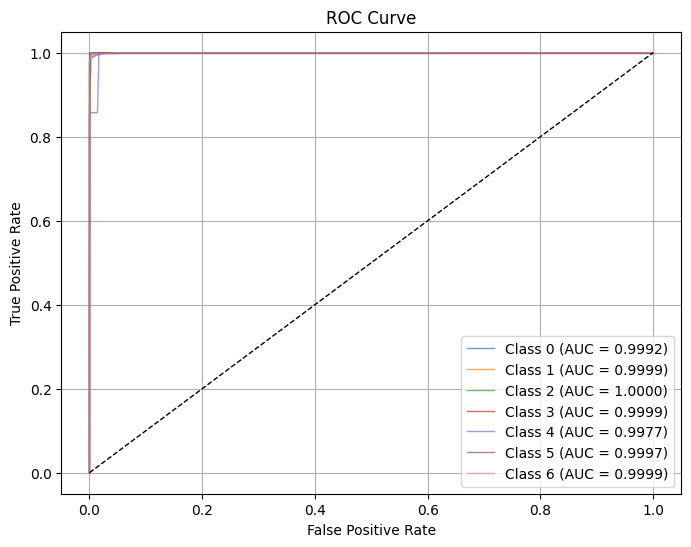

In [197]:
model_rf_smote_1_4 = train_and_evaluate_rf_epochs(X_smote, y_smote,X_test,y_test)


📊 Phân bố nhãn TRAIN:
label
0    14580
1    10149
2     8653
3    11009
4     8605
5     9580
6    10320
Name: count, dtype: int64

📊 Phân bố nhãn TEST:
Label
0    3645
1     393
2      19
3     609
4       7
5     251
6     436
Name: count, dtype: int64


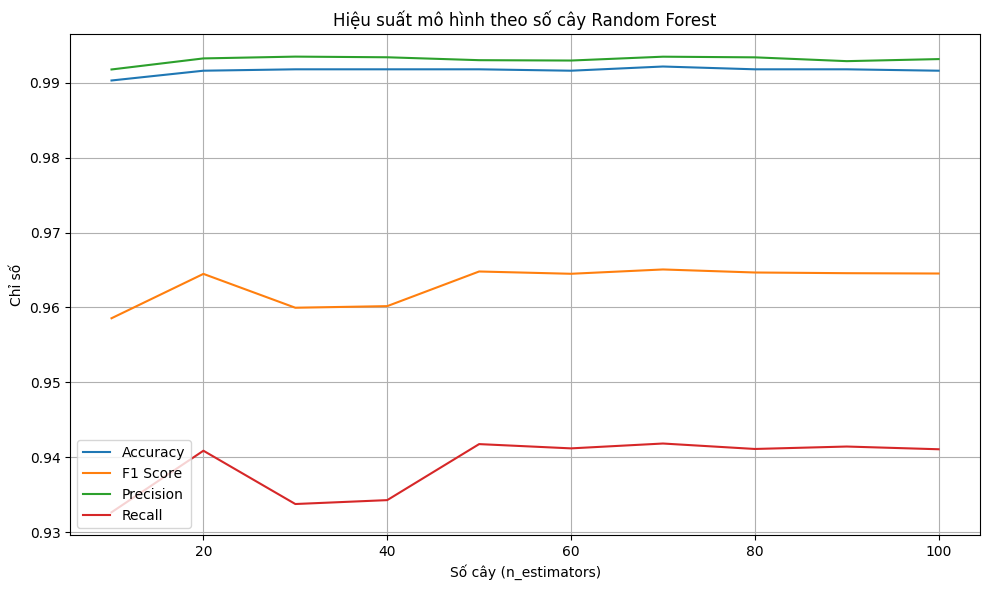


📊 Hiệu suất mô hình cuối cùng:
Accuracy : 0.9916
Precision: 0.9932
Recall   : 0.9411
F1-score : 0.9645
⏱️ Thời gian train: 5.5759 giây
⏱️ Thời gian test : 0.0597 giây

📄 Classification Report (Test set):
              precision    recall  f1-score   support

           0     0.9921    0.9959    0.9940      3645
           1     0.9873    0.9873    0.9873       393
           2     1.0000    0.7895    0.8824        19
           3     0.9885    0.9869    0.9877       609
           4     1.0000    0.8571    0.9231         7
           5     0.9843    0.9960    0.9901       251
           6     1.0000    0.9748    0.9872       436

    accuracy                         0.9916      5360
   macro avg     0.9932    0.9411    0.9645      5360
weighted avg     0.9916    0.9916    0.9915      5360



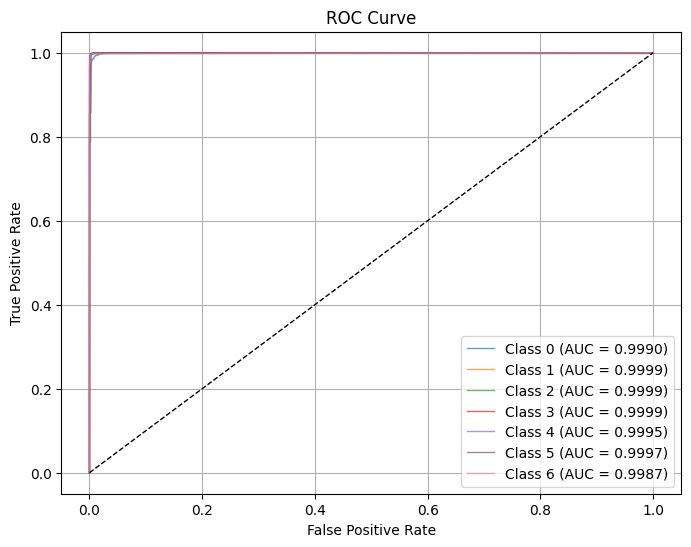

In [198]:
model_rf_vae_1_4 = train_and_evaluate_rf_epochs(X_vae, y_vae, X_test, y_test)


📊 Phân bố nhãn TRAIN:
label
0    14580
1    10149
2     8653
3    11009
4     8605
5     9580
6    10320
Name: count, dtype: int64

📊 Phân bố nhãn TEST:
Label
0    3645
1     393
2      19
3     609
4       7
5     251
6     436
Name: count, dtype: int64


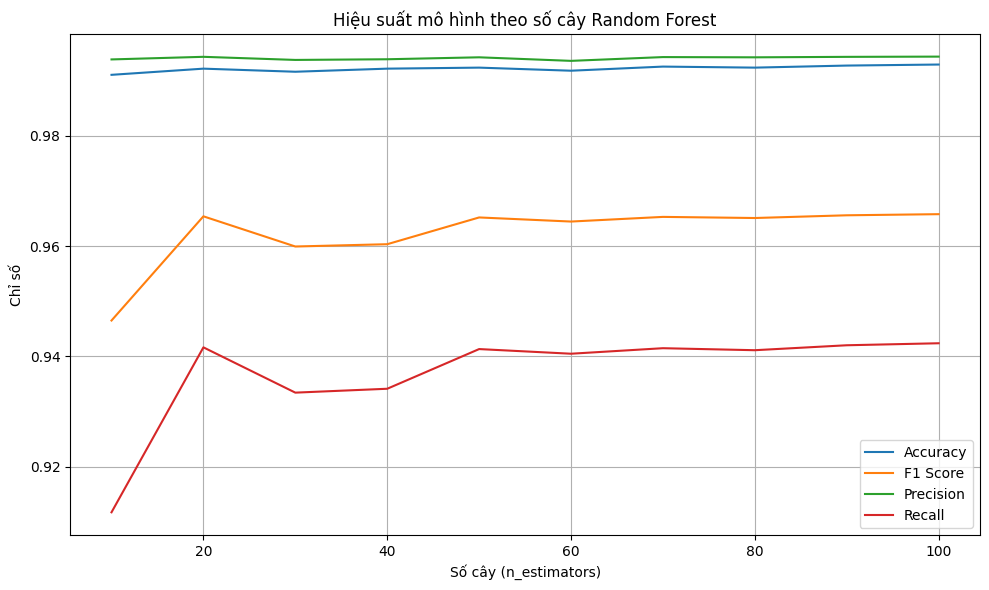


📊 Hiệu suất mô hình cuối cùng:
Accuracy : 0.9929
Precision: 0.9943
Recall   : 0.9424
F1-score : 0.9658
⏱️ Thời gian train: 4.9668 giây
⏱️ Thời gian test : 0.0452 giây

📄 Classification Report (Test set):
              precision    recall  f1-score   support

           0     0.9932    0.9967    0.9949      3645
           1     0.9873    0.9924    0.9898       393
           2     1.0000    0.7895    0.8824        19
           3     0.9918    0.9901    0.9910       609
           4     1.0000    0.8571    0.9231         7
           5     0.9881    0.9960    0.9921       251
           6     1.0000    0.9748    0.9872       436

    accuracy                         0.9929      5360
   macro avg     0.9943    0.9424    0.9658      5360
weighted avg     0.9929    0.9929    0.9929      5360



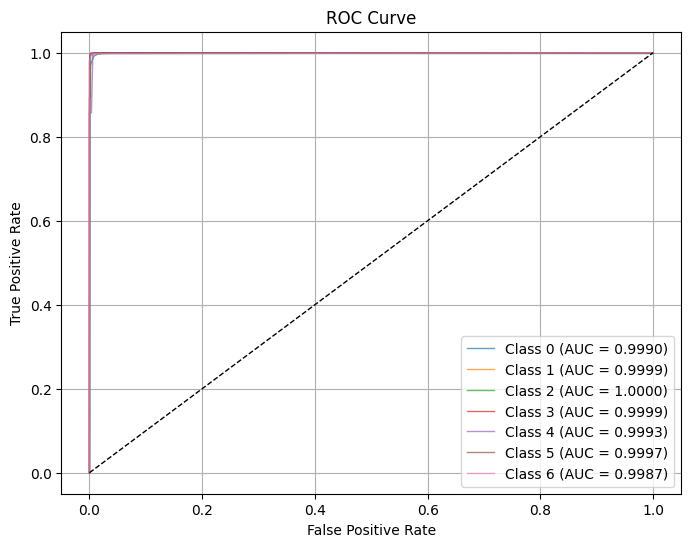

In [199]:
model_rf_cgan_1_4 = train_and_evaluate_rf_epochs(X_cgan, y_cgan, X_test, y_test)

## XGBoost


📊 Phân bố nhãn TRAIN:
label
0    14580
1    10149
2     8653
3    11009
4     8605
5     9580
6    10320
Name: count, dtype: int64

📊 Phân bố nhãn TEST:
Label
0    3645
1     393
2      19
3     609
4       7
5     251
6     436
Name: count, dtype: int64
[10 trees] Train: 0.2675s | Test: 0.0069s
[20 trees] Train: 0.4886s | Test: 0.0109s
[30 trees] Train: 0.6706s | Test: 0.0145s
[40 trees] Train: 0.8780s | Test: 0.0187s
[50 trees] Train: 1.0693s | Test: 0.0226s
[60 trees] Train: 1.2603s | Test: 0.0265s
[70 trees] Train: 1.4438s | Test: 0.0297s
[80 trees] Train: 1.7391s | Test: 0.0335s
[90 trees] Train: 1.7977s | Test: 0.0360s
[100 trees] Train: 1.9723s | Test: 0.0393s


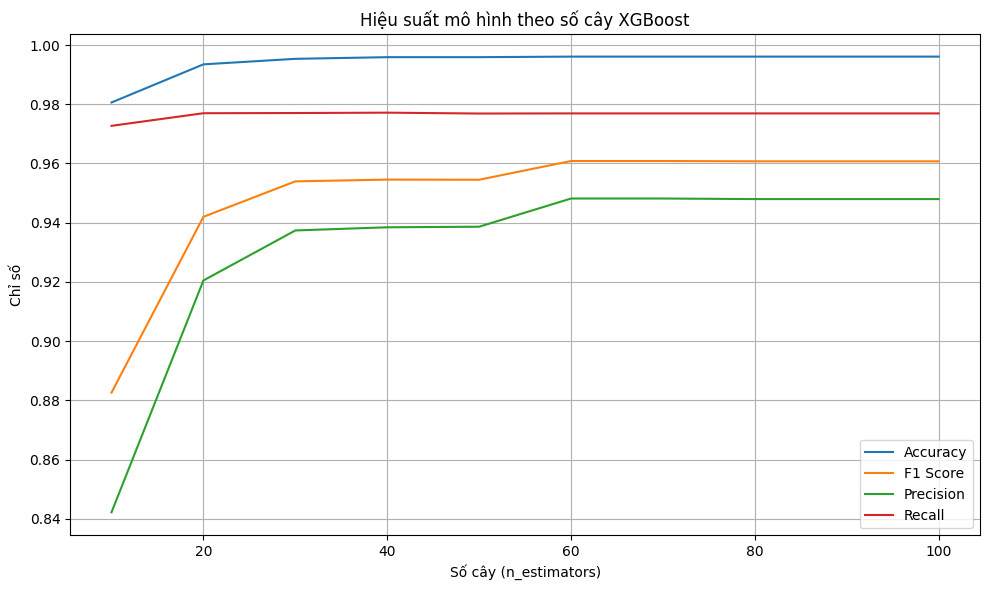


📊 Kết quả mô hình cuối cùng:
Accuracy : 0.9961
Precision: 0.9480
Recall   : 0.9769
F1-score : 0.9607
⏱ Thời gian train: 1.9686s
⏱ Thời gian test : 0.0397s

📄 Classification Report (Test set):
              precision    recall  f1-score   support

           0     0.9984    0.9964    0.9974      3645
           1     0.9924    0.9949    0.9936       393
           2     1.0000    1.0000    1.0000        19
           3     0.9902    0.9967    0.9935       609
           4     0.6667    0.8571    0.7500         7
           5     0.9882    1.0000    0.9941       251
           6     1.0000    0.9931    0.9965       436

    accuracy                         0.9961      5360
   macro avg     0.9480    0.9769    0.9607      5360
weighted avg     0.9962    0.9961    0.9961      5360



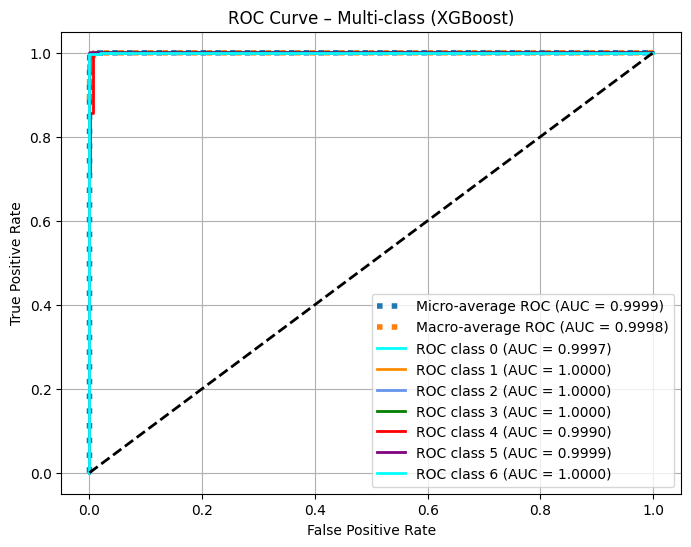

In [200]:
model_xgb_smote_1_4 = train_and_evaluate_xgb_epochs(X_smote, y_smote, X_test, y_test)


📊 Phân bố nhãn TRAIN:
label
0    14580
1    10149
2     8653
3    11009
4     8605
5     9580
6    10320
Name: count, dtype: int64

📊 Phân bố nhãn TEST:
Label
0    3645
1     393
2      19
3     609
4       7
5     251
6     436
Name: count, dtype: int64
[10 trees] Train: 0.2814s | Test: 0.0067s
[20 trees] Train: 0.4768s | Test: 0.0107s
[30 trees] Train: 0.6695s | Test: 0.0148s
[40 trees] Train: 0.8715s | Test: 0.0186s
[50 trees] Train: 1.0546s | Test: 0.0248s
[60 trees] Train: 1.2311s | Test: 0.0252s
[70 trees] Train: 1.4153s | Test: 0.0286s
[80 trees] Train: 1.6814s | Test: 0.0316s
[90 trees] Train: 1.7532s | Test: 0.0348s
[100 trees] Train: 1.9440s | Test: 0.0383s


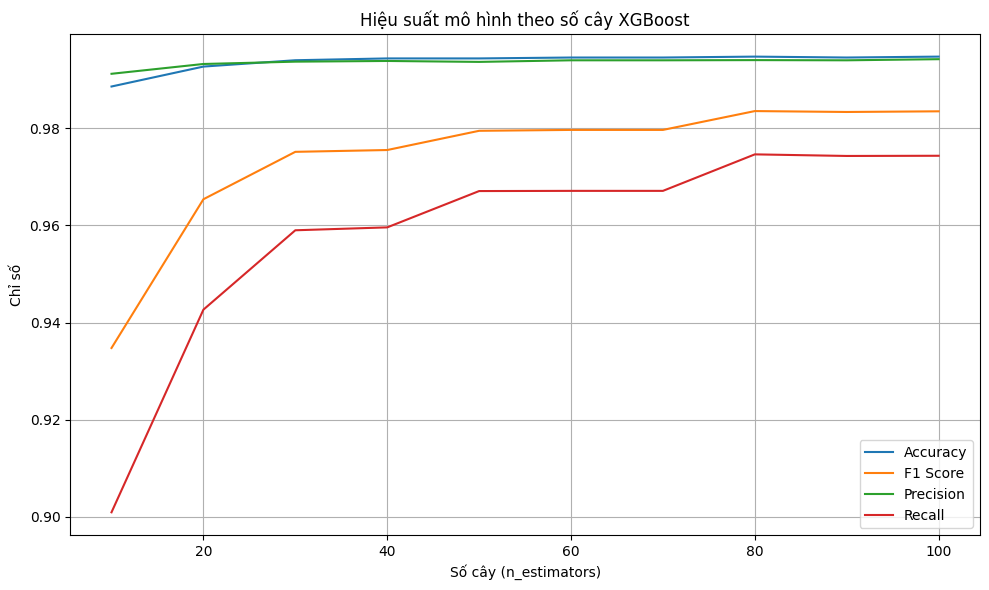


📊 Kết quả mô hình cuối cùng:
Accuracy : 0.9948
Precision: 0.9942
Recall   : 0.9744
F1-score : 0.9835
⏱ Thời gian train: 1.9268s
⏱ Thời gian test : 0.0373s

📄 Classification Report (Test set):
              precision    recall  f1-score   support

           0     0.9964    0.9964    0.9964      3645
           1     0.9873    0.9873    0.9873       393
           2     1.0000    1.0000    1.0000        19
           3     0.9902    0.9951    0.9926       609
           4     1.0000    0.8571    0.9231         7
           5     0.9881    0.9960    0.9921       251
           6     0.9977    0.9885    0.9931       436

    accuracy                         0.9948      5360
   macro avg     0.9942    0.9744    0.9835      5360
weighted avg     0.9948    0.9948    0.9948      5360



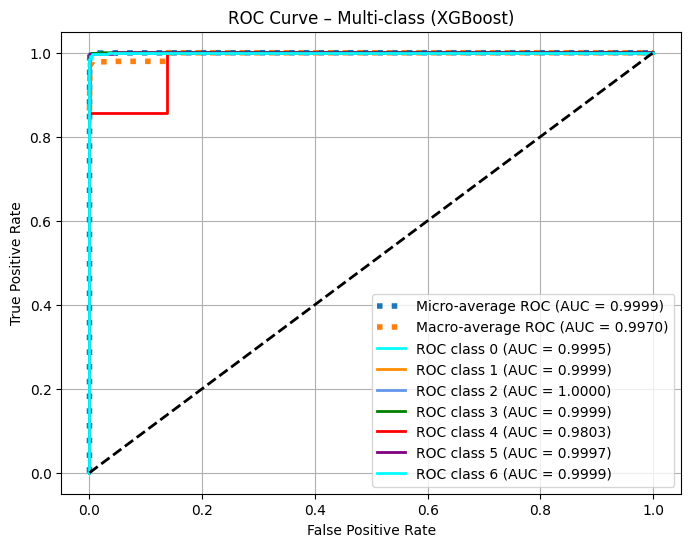

In [201]:
model_xgb_vae_1_4 = train_and_evaluate_xgb_epochs(X_vae, y_vae, X_test, y_test)


📊 Phân bố nhãn TRAIN:
label
0    14580
1    10149
2     8653
3    11009
4     8605
5     9580
6    10320
Name: count, dtype: int64

📊 Phân bố nhãn TEST:
Label
0    3645
1     393
2      19
3     609
4       7
5     251
6     436
Name: count, dtype: int64
[10 trees] Train: 0.2746s | Test: 0.0065s
[20 trees] Train: 0.4644s | Test: 0.0109s
[30 trees] Train: 0.6675s | Test: 0.0147s
[40 trees] Train: 0.9468s | Test: 0.0183s
[50 trees] Train: 1.0479s | Test: 0.0218s
[60 trees] Train: 1.2281s | Test: 0.0289s
[70 trees] Train: 1.4211s | Test: 0.0290s
[80 trees] Train: 1.5872s | Test: 0.0322s
[90 trees] Train: 1.7642s | Test: 0.0346s
[100 trees] Train: 1.9314s | Test: 0.0390s


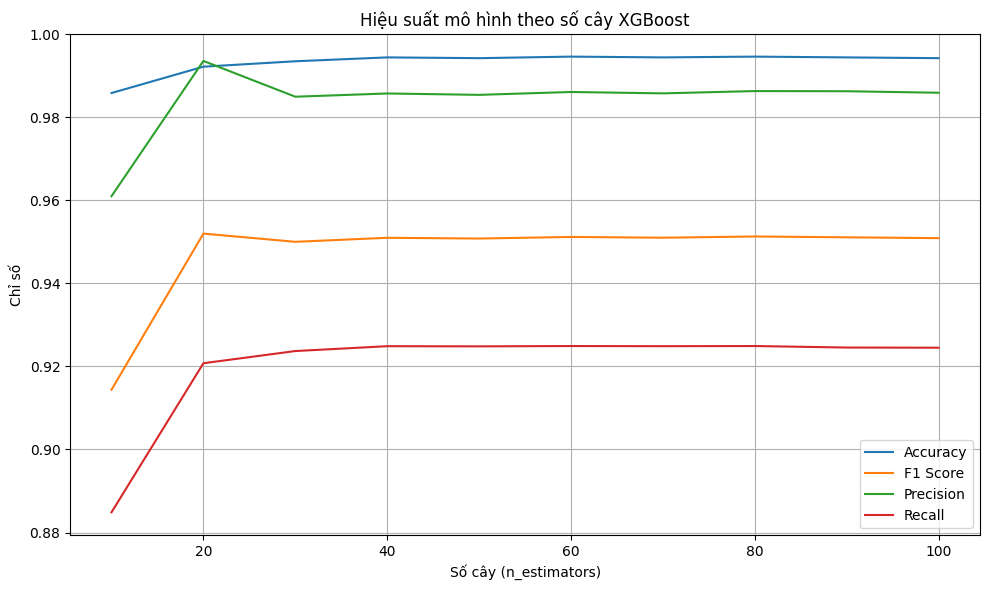


📊 Kết quả mô hình cuối cùng:
Accuracy : 0.9942
Precision: 0.9859
Recall   : 0.9245
F1-score : 0.9509
⏱ Thời gian train: 2.0209s
⏱ Thời gian test : 0.0377s

📄 Classification Report (Test set):
              precision    recall  f1-score   support

           0     0.9953    0.9964    0.9959      3645
           1     0.9924    0.9924    0.9924       393
           2     0.9375    0.7895    0.8571        19
           3     0.9902    0.9967    0.9935       609
           4     1.0000    0.7143    0.8333         7
           5     0.9881    0.9960    0.9921       251
           6     0.9977    0.9862    0.9919       436

    accuracy                         0.9942      5360
   macro avg     0.9859    0.9245    0.9509      5360
weighted avg     0.9942    0.9942    0.9941      5360



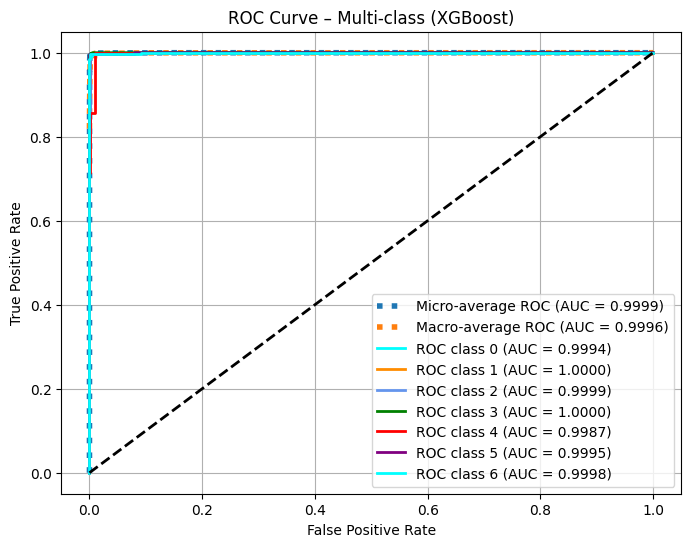

In [202]:
model_xgb_cgan_1_4 = train_and_evaluate_xgb_epochs(X_cgan, y_cgan, X_test, y_test)

# Tỉ lệ 1:5

## SMOTE

[INFO] Phân phối ban đầu: Counter({0: 14580, 3: 2433, 6: 1744, 1: 1573, 5: 1004, 2: 77, 4: 29})
[INFO] Số mẫu bình thường: 14580
[INFO] Tổng số mẫu tấn công hiện có: 6860
[INFO] Cần sinh thêm tổng cộng: 66040 mẫu tấn công
[INFO] Lớp 1: 1573 → 12579
[INFO] Lớp 2: 77 → 11083
[INFO] Lớp 3: 2433 → 13439
[INFO] Lớp 4: 29 → 11035
[INFO] Lớp 5: 1004 → 12010
[INFO] Lớp 6: 1744 → 12750
[INFO] Phân phối nhãn sau khi tăng cường: Counter({np.int64(0): 14580, np.int64(3): 13439, np.int64(6): 12750, np.int64(1): 12579, np.int64(5): 12010, np.int64(2): 11083, np.int64(4): 11035})


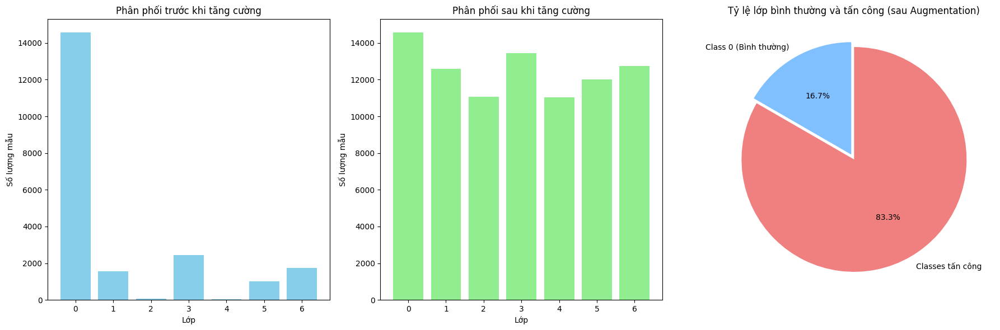

[INFO] Đã lưu dữ liệu tạo sinh vào file: generated_smote_5.csv


In [50]:
X_aug_smote_1_5, y_aug_smote_1_5 = augment_to_ratio_total_balanced(X_train, y_train, target_ratio=5, method='smote')

## VAE

[INFO] Phân phối ban đầu: Counter({0: 14580, 3: 2433, 6: 1744, 1: 1573, 5: 1004, 2: 77, 4: 29})
[INFO] Số mẫu bình thường: 14580
[INFO] Tổng số mẫu tấn công hiện có: 6860
[INFO] Cần sinh thêm tổng cộng: 66040 mẫu tấn công
[INFO] Lớp 1: Có 1573, cần sinh thêm 11006
[INFO] Lớp 2: Có 77, cần sinh thêm 11006
[INFO] Lớp 3: Có 2433, cần sinh thêm 11006
[INFO] Lớp 4: Có 29, cần sinh thêm 11006
[INFO] Lớp 5: Có 1004, cần sinh thêm 11006
[INFO] Lớp 6: Có 1744, cần sinh thêm 11006
[INFO] Phân phối nhãn sau khi tăng cường: Counter({np.int64(0): 14580, np.int64(3): 13439, np.int64(6): 12750, np.int64(1): 12579, np.int64(5): 12010, np.int64(2): 11083, np.int64(4): 11035})


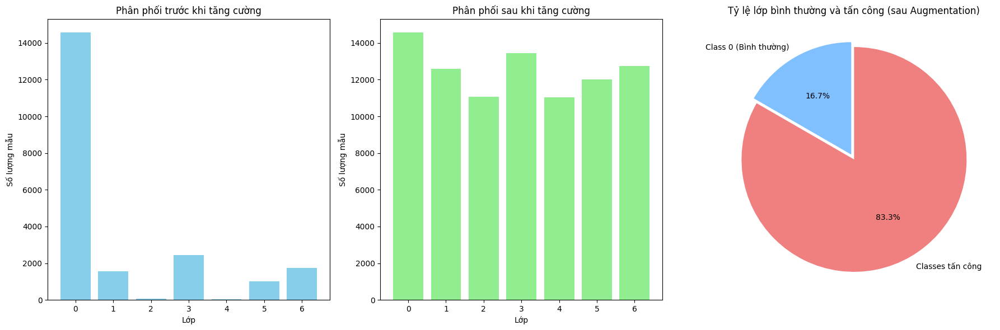

[INFO] Đã lưu dữ liệu tạo sinh vào file: generated_vae_5.csv


In [49]:
X_aug_vae_1_5, y_aug_vae_1_5 = augment_to_ratio_total_balanced(X_train, y_train, target_ratio=5, method='vae')

## CGAN

[INFO] Phân phối ban đầu: Counter({0: 14580, 3: 2433, 6: 1744, 1: 1573, 5: 1004, 2: 77, 4: 29})
[INFO] Số mẫu bình thường: 14580
[INFO] Tổng số mẫu tấn công hiện có: 6860
[INFO] Cần sinh thêm tổng cộng: 66040 mẫu tấn công
[INFO] Lớp 1: Có 1573, cần sinh thêm 11006
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━

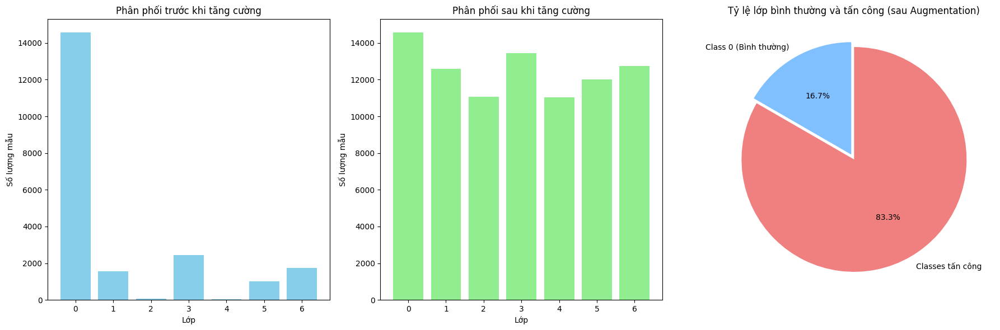

[INFO] Đã lưu dữ liệu tạo sinh vào file: generated_cgan_5.csv


In [51]:
X_aug_cgan_1_5, y_aug_cgan_1_5 = augment_to_ratio_total_balanced(X_train, y_train, target_ratio=5, method='cgan')

## So sánh chất lượng dữ liệu ở tỉ lệ 1:5

In [52]:
# Ví dụ: load dữ liệu gốc và dữ liệu sinh
original_df = pd.read_csv("/kaggle/input/selected-feature/selected_features.csv")
smote_df = pd.read_csv("/kaggle/working/generated_smote_5.csv")
cgan_df = pd.read_csv("/kaggle/working/generated_cgan_5.csv")
vae_df = pd.read_csv("/kaggle/working/generated_vae_5.csv")

X_orig, y_orig = split_X_y(original_df)
X_smote, y_smote = split_X_y(smote_df)
X_cgan, y_cgan = split_X_y(cgan_df)
X_vae, y_vae = split_X_y(vae_df)

In [67]:
best_k, all_results = find_best_k(X_smote)
print("Best k:", best_k)
for r in all_results:
    print(f"k={r['k']}, Inertia={r['inertia']:.2f}, Silhouette={r['silhouette_score']:.4f}")

Best k: 9
k=2, Inertia=14066.59, Silhouette=0.6461
k=3, Inertia=11041.67, Silhouette=0.5841
k=4, Inertia=7550.23, Silhouette=0.5677
k=5, Inertia=6163.87, Silhouette=0.6501
k=6, Inertia=5163.34, Silhouette=0.6970
k=7, Inertia=3756.31, Silhouette=0.7126
k=8, Inertia=3353.52, Silhouette=0.7147
k=9, Inertia=2831.74, Silhouette=0.7311
k=10, Inertia=2431.89, Silhouette=0.7306


In [68]:
best_k, all_results = find_best_k(X_cgan)
print("Best k:", best_k)
for r in all_results:
    print(f"k={r['k']}, Inertia={r['inertia']:.2f}, Silhouette={r['silhouette_score']:.4f}")

Best k: 9
k=2, Inertia=69207.22, Silhouette=0.3859
k=3, Inertia=39596.76, Silhouette=0.4628
k=4, Inertia=28887.16, Silhouette=0.4937
k=5, Inertia=14631.49, Silhouette=0.6420
k=6, Inertia=7986.23, Silhouette=0.7411
k=7, Inertia=7095.80, Silhouette=0.7387
k=8, Inertia=3585.79, Silhouette=0.8234
k=9, Inertia=2697.70, Silhouette=0.8385
k=10, Inertia=2653.42, Silhouette=0.7813


In [69]:
best_k, all_results = find_best_k(X_vae)
print("Best k:", best_k)
for r in all_results:
    print(f"k={r['k']}, Inertia={r['inertia']:.2f}, Silhouette={r['silhouette_score']:.4f}")

Best k: 9
k=2, Inertia=7570.27, Silhouette=0.6248
k=3, Inertia=6195.32, Silhouette=0.6338
k=4, Inertia=5948.22, Silhouette=0.6391
k=5, Inertia=3650.40, Silhouette=0.6429
k=6, Inertia=3017.54, Silhouette=0.6101
k=7, Inertia=2368.24, Silhouette=0.6279
k=8, Inertia=2071.55, Silhouette=0.6397
k=9, Inertia=1827.94, Silhouette=0.6440
k=10, Inertia=1743.04, Silhouette=0.5946


In [70]:
for name, X in [("Original", X_orig), ("SMOTE", X_smote), ("CGAN", X_cgan), ("VAE", X_vae)]:
    print(f"{name}: Average Entropy={avg_entropy(X):.4f}")

Original: Average Entropy=0.6435
SMOTE: Average Entropy=0.6852
CGAN: Average Entropy=1.3279
VAE: Average Entropy=0.9264


In [71]:
methods = {
    "SMOTE": X_smote,
    "CGAN": X_cgan,
    "VAE": X_vae
}

X_ref = X_orig  # dữ liệu gốc làm mốc so sánh

for name, X_gen in methods.items():
    # Căn chỉnh số lượng mẫu
    min_len = min(len(X_ref), len(X_gen))
    X_ref_aligned = X_ref.iloc[:min_len].reset_index(drop=True)
    X_gen_aligned = X_gen.iloc[:min_len].reset_index(drop=True)

    kl, wd, mse, mae = discrepancy_metrics(X_ref_aligned, X_gen_aligned)
    print(f"Original vs {name}: KL={kl:.4f}, WD={wd:.4f}, MSE={mse:.4f}, MAE={mae:.4f}")

Original vs SMOTE: KL=0.0058, WD=0.0094, MSE=0.0412, MAE=0.0789
Original vs CGAN: KL=0.0598, WD=0.0309, MSE=0.0542, MAE=0.0960
Original vs VAE: KL=0.0170, WD=0.0103, MSE=0.0410, MAE=0.0788


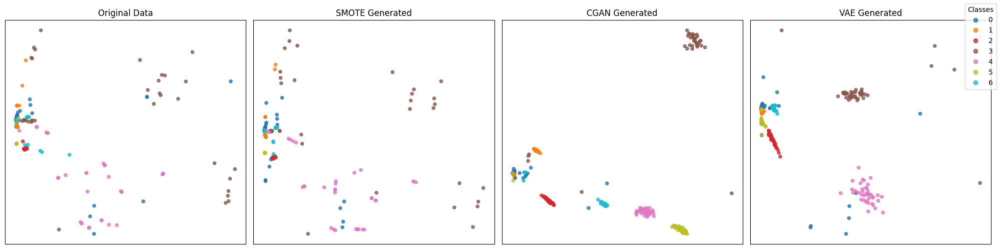

In [55]:
plot_generated_comparison(
    X_orig, y_orig,
    X_smote, y_smote,
    X_cgan, y_cgan,
    X_vae, y_vae,
    method='pca',
    sample_size=300
)

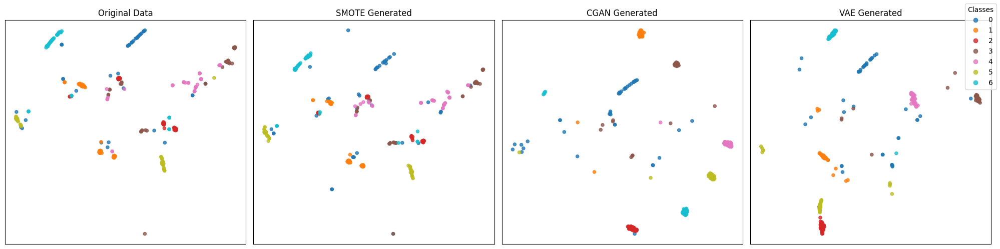

In [72]:
plot_generated_comparison(
    X_orig, y_orig,
    X_smote, y_smote,
    X_cgan, y_cgan,
    X_vae, y_vae,
    method='tsne',
    sample_size=300
)


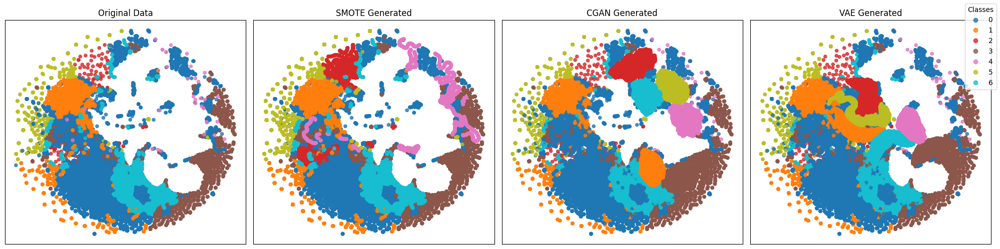

In [73]:
plot_generated_full(X_orig, y_orig,
                    X_smote, y_smote,
                    X_cgan, y_cgan,
                    X_vae, y_vae,
                    method="tsne")

Feature: Init_Win_bytes_forward
Original:
count    26800.000000
mean         0.129350
std          0.221253
min          0.000000
25%          0.000000
50%          0.003967
75%          0.125015
max          1.000000
Name: Init_Win_bytes_forward, dtype: float64
Generated:
count    87476.000000
mean         0.169416
std          0.206065
min          0.000000
25%          0.003906
50%          0.050278
75%          0.445572
max          1.000000
Name: Init_Win_bytes_forward, dtype: float64
NaN count in generated: 0


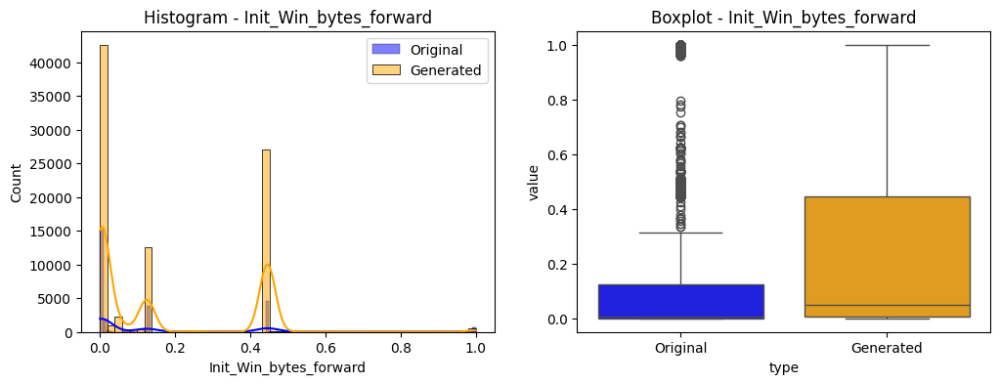

Feature: Init_Win_bytes_forward
Original:
count    26800.000000
mean         0.129350
std          0.221253
min          0.000000
25%          0.000000
50%          0.003967
75%          0.125015
max          1.000000
Name: Init_Win_bytes_forward, dtype: float64
Generated:
count    87476.000000
mean         0.317600
std          0.301514
min          0.000000
25%          0.060880
50%          0.289070
75%          0.432942
max          1.000000
Name: Init_Win_bytes_forward, dtype: float64
NaN count in generated: 0


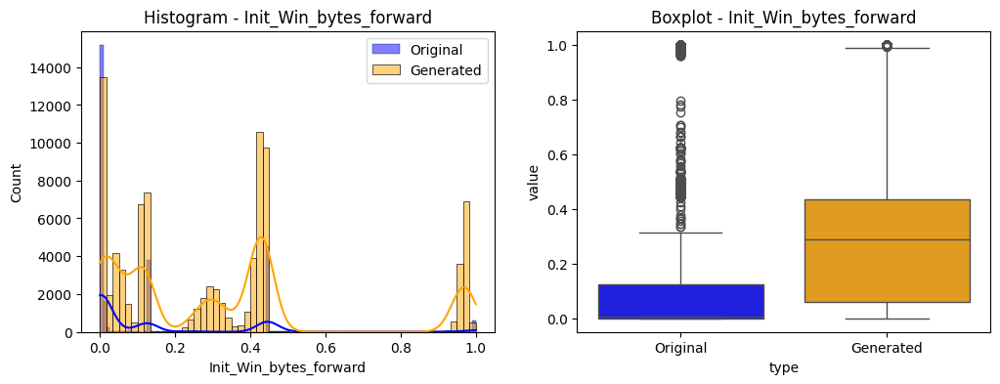

Feature: Init_Win_bytes_forward
Original:
count    26800.000000
mean         0.129350
std          0.221253
min          0.000000
25%          0.000000
50%          0.003967
75%          0.125015
max          1.000000
Name: Init_Win_bytes_forward, dtype: float64
Generated:
count    87476.000000
mean         0.170868
std          0.175062
min         -0.424699
25%          0.023084
50%          0.115333
75%          0.268297
max          1.000000
Name: Init_Win_bytes_forward, dtype: float64
NaN count in generated: 0


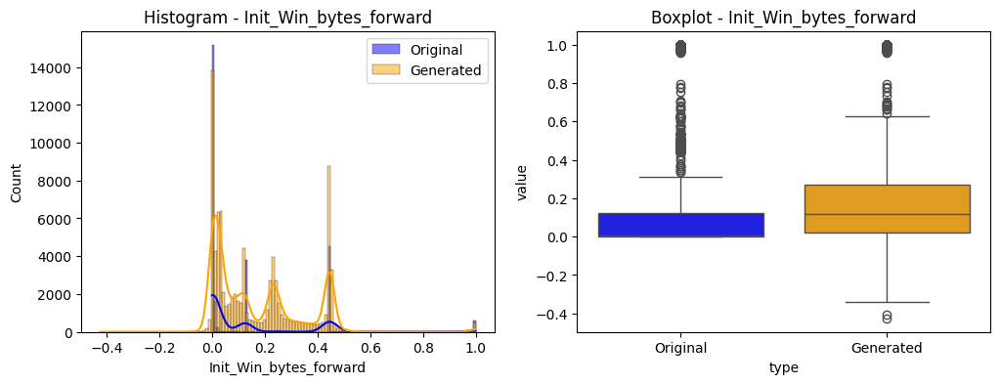

In [ ]:
plot_hist_box(X_orig, X_smote, feature_idx=0)

plot_hist_box(X_orig, X_cgan, feature_idx=0)

plot_hist_box(X_orig, X_vae, feature_idx=0)

## Random Forest


📊 Phân bố nhãn TRAIN:
label
0    14580
1    12579
2    11083
3    13439
4    11035
5    12010
6    12750
Name: count, dtype: int64

📊 Phân bố nhãn TEST:
Label
0    3645
1     393
2      19
3     609
4       7
5     251
6     436
Name: count, dtype: int64


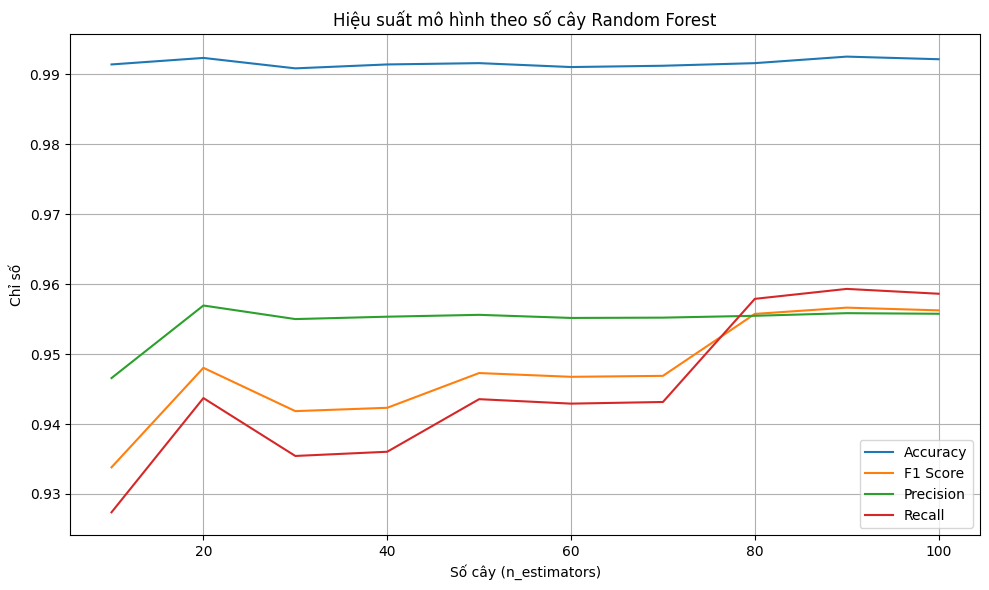


📊 Hiệu suất mô hình cuối cùng:
Accuracy : 0.9922
Precision: 0.9558
Recall   : 0.9586
F1-score : 0.9563
⏱️ Thời gian train: 4.8392 giây
⏱️ Thời gian test : 0.0459 giây

📄 Classification Report (Test set):
              precision    recall  f1-score   support

           0     0.9953    0.9934    0.9944      3645
           1     0.9824    0.9924    0.9873       393
           2     1.0000    0.8947    0.9444        19
           3     0.9854    0.9951    0.9902       609
           4     0.7500    0.8571    0.8000         7
           5     0.9843    0.9960    0.9901       251
           6     0.9930    0.9817    0.9873       436

    accuracy                         0.9922      5360
   macro avg     0.9558    0.9586    0.9563      5360
weighted avg     0.9922    0.9922    0.9922      5360



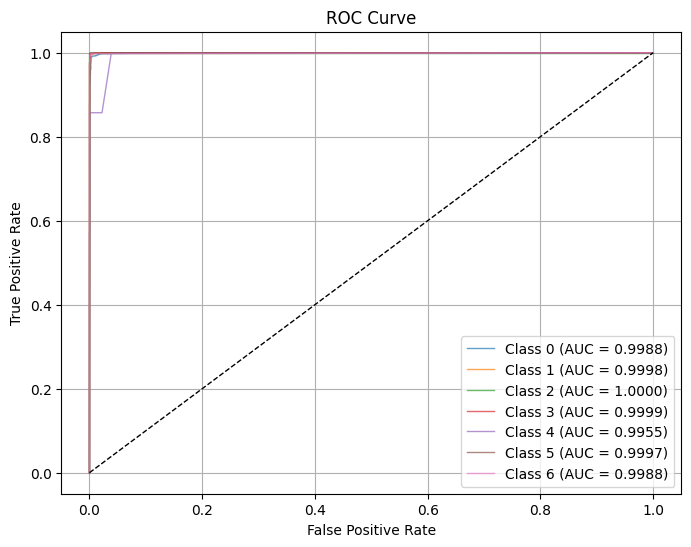

In [58]:
model_rf_smote_1_5 = train_and_evaluate_rf_epochs(X_smote, y_smote, X_test, y_test)


📊 Phân bố nhãn TRAIN:
label
0    14580
1    12579
2    11083
3    13439
4    11035
5    12010
6    12750
Name: count, dtype: int64

📊 Phân bố nhãn TEST:
Label
0    3645
1     393
2      19
3     609
4       7
5     251
6     436
Name: count, dtype: int64


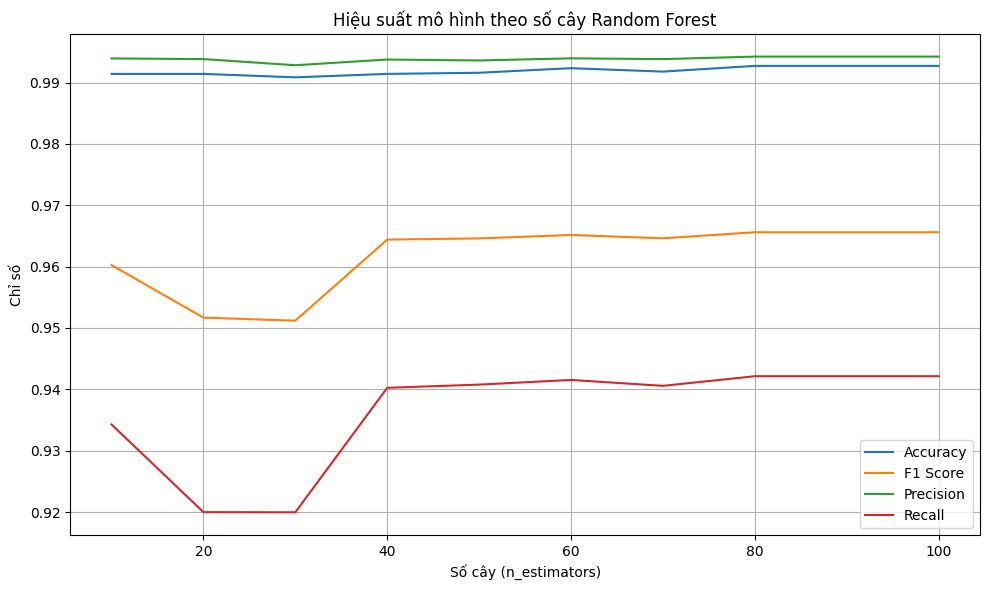


📊 Hiệu suất mô hình cuối cùng:
Accuracy : 0.9927
Precision: 0.9942
Recall   : 0.9421
F1-score : 0.9656
⏱️ Thời gian train: 6.9806 giây
⏱️ Thời gian test : 0.0453 giây

📄 Classification Report (Test set):
              precision    recall  f1-score   support

           0     0.9929    0.9967    0.9948      3645
           1     0.9924    0.9924    0.9924       393
           2     1.0000    0.7895    0.8824        19
           3     0.9901    0.9885    0.9893       609
           4     1.0000    0.8571    0.9231         7
           5     0.9843    0.9960    0.9901       251
           6     1.0000    0.9748    0.9872       436

    accuracy                         0.9927      5360
   macro avg     0.9942    0.9421    0.9656      5360
weighted avg     0.9927    0.9927    0.9927      5360



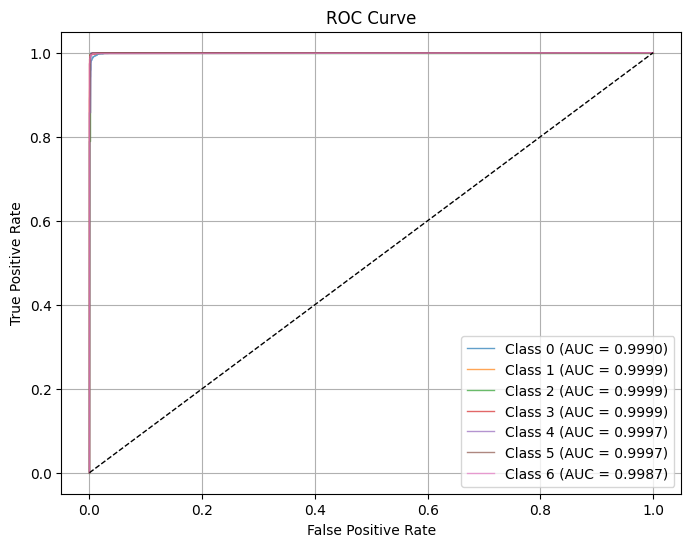

In [60]:
model_rf_vae_1_5 = train_and_evaluate_rf_epochs(X_vae, y_vae, X_test, y_test)


📊 Phân bố nhãn TRAIN:
label
0    14580
1    12579
2    11083
3    13439
4    11035
5    12010
6    12750
Name: count, dtype: int64

📊 Phân bố nhãn TEST:
Label
0    3645
1     393
2      19
3     609
4       7
5     251
6     436
Name: count, dtype: int64


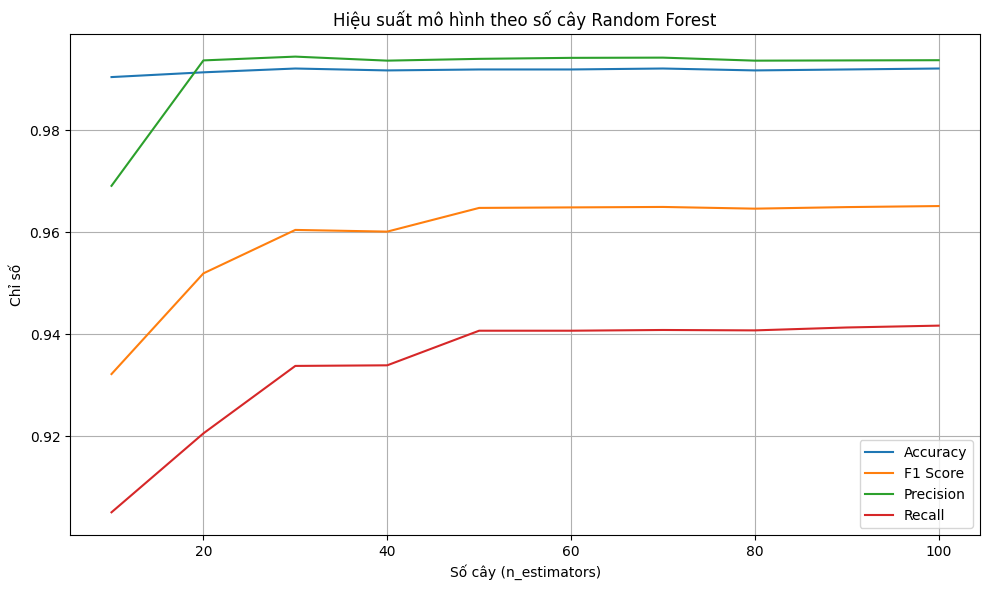


📊 Hiệu suất mô hình cuối cùng:
Accuracy : 0.9922
Precision: 0.9938
Recall   : 0.9417
F1-score : 0.9652
⏱️ Thời gian train: 5.8969 giây
⏱️ Thời gian test : 0.0460 giây

📄 Classification Report (Test set):
              precision    recall  f1-score   support

           0     0.9926    0.9962    0.9944      3645
           1     0.9873    0.9898    0.9886       393
           2     1.0000    0.7895    0.8824        19
           3     0.9885    0.9885    0.9885       609
           4     1.0000    0.8571    0.9231         7
           5     0.9881    0.9960    0.9921       251
           6     1.0000    0.9748    0.9872       436

    accuracy                         0.9922      5360
   macro avg     0.9938    0.9417    0.9652      5360
weighted avg     0.9922    0.9922    0.9921      5360



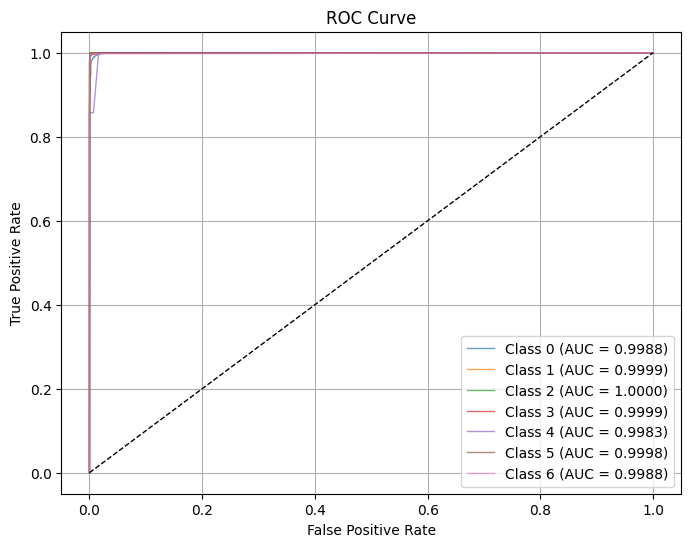

In [62]:
model_rf_cgan_1_5 = train_and_evaluate_rf_epochs(X_cgan, y_cgan, X_test, y_test)

## XGBoost


📊 Phân bố nhãn TRAIN:
label
0    14580
1    12579
2    11083
3    13439
4    11035
5    12010
6    12750
Name: count, dtype: int64

📊 Phân bố nhãn TEST:
Label
0    3645
1     393
2      19
3     609
4       7
5     251
6     436
Name: count, dtype: int64
[10 trees] Train: 0.3960s | Test: 0.0085s
[20 trees] Train: 0.5455s | Test: 0.0108s
[30 trees] Train: 0.7704s | Test: 0.0143s
[40 trees] Train: 1.0054s | Test: 0.0190s
[50 trees] Train: 1.3002s | Test: 0.0224s
[60 trees] Train: 1.4389s | Test: 0.0258s
[70 trees] Train: 1.6335s | Test: 0.0293s
[80 trees] Train: 1.8504s | Test: 0.0325s
[90 trees] Train: 2.0801s | Test: 0.0365s
[100 trees] Train: 2.3861s | Test: 0.0392s


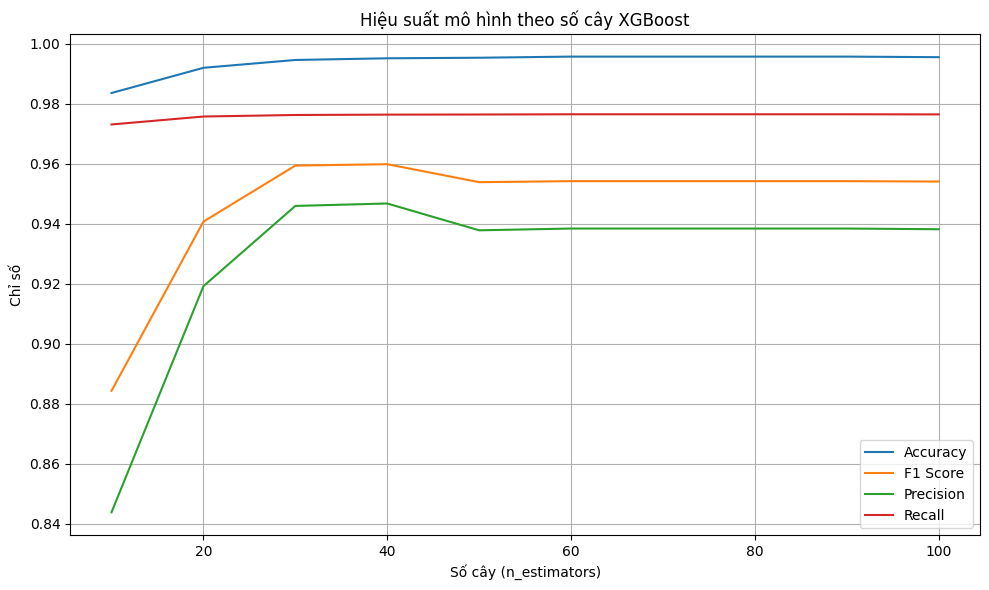


📊 Kết quả mô hình cuối cùng:
Accuracy : 0.9955
Precision: 0.9382
Recall   : 0.9765
F1-score : 0.9541
⏱ Thời gian train: 2.2776s
⏱ Thời gian test : 0.0394s

📄 Classification Report (Test set):
              precision    recall  f1-score   support

           0     0.9981    0.9956    0.9968      3645
           1     0.9924    0.9949    0.9936       393
           2     1.0000    1.0000    1.0000        19
           3     0.9886    0.9984    0.9935       609
           4     0.6000    0.8571    0.7059         7
           5     0.9881    0.9960    0.9921       251
           6     1.0000    0.9931    0.9965       436

    accuracy                         0.9955      5360
   macro avg     0.9382    0.9765    0.9541      5360
weighted avg     0.9958    0.9955    0.9956      5360



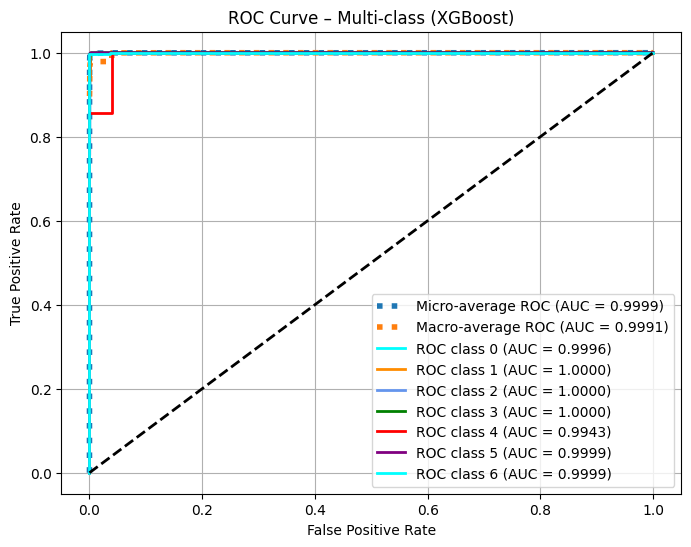

In [63]:
model_xgb_smote_1_5 = train_and_evaluate_xgb_epochs(X_smote, y_smote, X_test, y_test)


📊 Phân bố nhãn TRAIN:
label
0    14580
1    12579
2    11083
3    13439
4    11035
5    12010
6    12750
Name: count, dtype: int64

📊 Phân bố nhãn TEST:
Label
0    3645
1     393
2      19
3     609
4       7
5     251
6     436
Name: count, dtype: int64
[10 trees] Train: 0.3227s | Test: 0.0067s
[20 trees] Train: 0.5437s | Test: 0.0107s
[30 trees] Train: 0.7717s | Test: 0.0143s
[40 trees] Train: 1.0054s | Test: 0.0181s
[50 trees] Train: 1.2159s | Test: 0.0223s
[60 trees] Train: 1.4346s | Test: 0.0268s
[70 trees] Train: 1.7632s | Test: 0.0280s
[80 trees] Train: 1.8425s | Test: 0.0314s
[90 trees] Train: 2.0518s | Test: 0.0348s
[100 trees] Train: 2.2620s | Test: 0.0443s


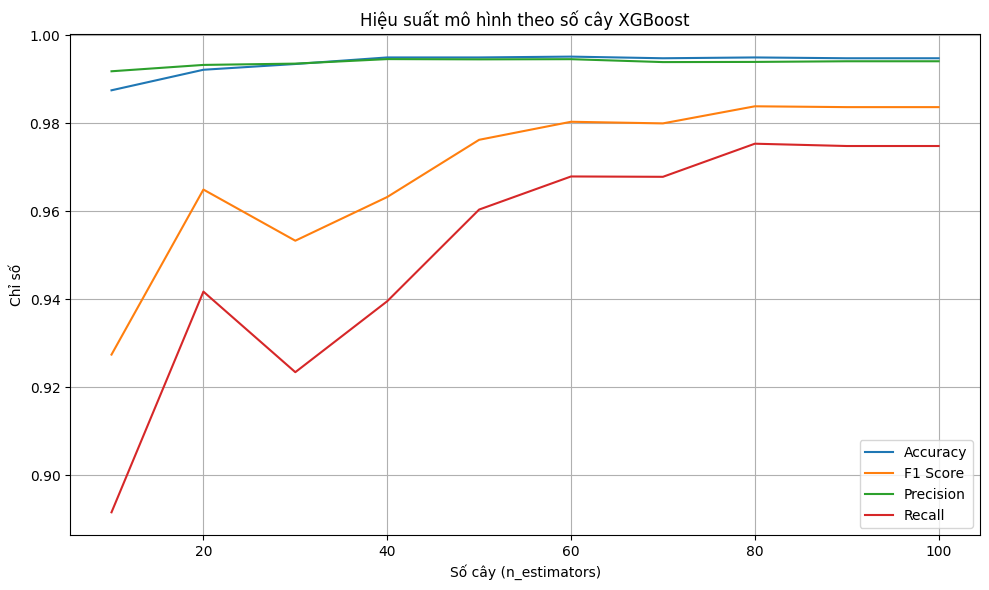


📊 Kết quả mô hình cuối cùng:
Accuracy : 0.9948
Precision: 0.9941
Recall   : 0.9748
F1-score : 0.9837
⏱ Thời gian train: 2.2378s
⏱ Thời gian test : 0.0376s

📄 Classification Report (Test set):
              precision    recall  f1-score   support

           0     0.9967    0.9962    0.9964      3645
           1     0.9899    0.9949    0.9924       393
           2     1.0000    1.0000    1.0000        19
           3     0.9886    0.9934    0.9910       609
           4     1.0000    0.8571    0.9231         7
           5     0.9881    0.9960    0.9921       251
           6     0.9954    0.9862    0.9908       436

    accuracy                         0.9948      5360
   macro avg     0.9941    0.9748    0.9837      5360
weighted avg     0.9948    0.9948    0.9948      5360



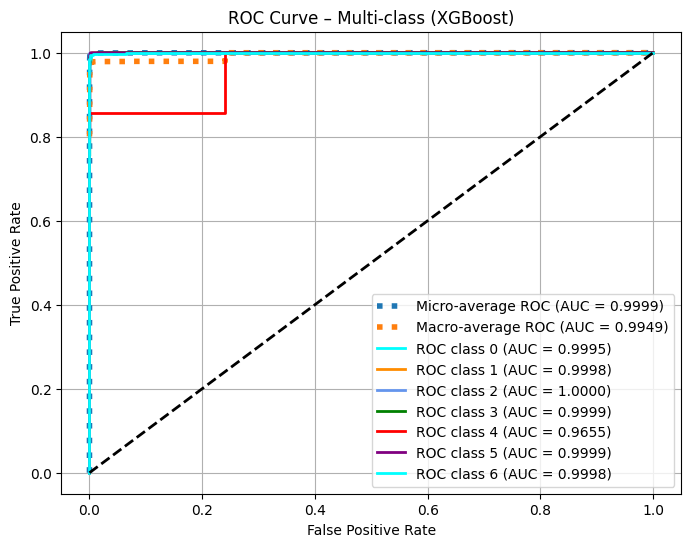

In [65]:
model_xgb_vae_1_5 = train_and_evaluate_xgb_epochs(X_vae, y_vae, X_test, y_test)


📊 Phân bố nhãn TRAIN:
label
0    14580
1    12579
2    11083
3    13439
4    11035
5    12010
6    12750
Name: count, dtype: int64

📊 Phân bố nhãn TEST:
Label
0    3645
1     393
2      19
3     609
4       7
5     251
6     436
Name: count, dtype: int64
[10 trees] Train: 0.3096s | Test: 0.0067s
[20 trees] Train: 0.5248s | Test: 0.0106s
[30 trees] Train: 0.7460s | Test: 0.0141s
[40 trees] Train: 0.9971s | Test: 0.0212s
[50 trees] Train: 1.2349s | Test: 0.0215s
[60 trees] Train: 1.5205s | Test: 0.0250s
[70 trees] Train: 1.6404s | Test: 0.0285s
[80 trees] Train: 1.8823s | Test: 0.0317s
[90 trees] Train: 2.0411s | Test: 0.0346s
[100 trees] Train: 2.2317s | Test: 0.0374s


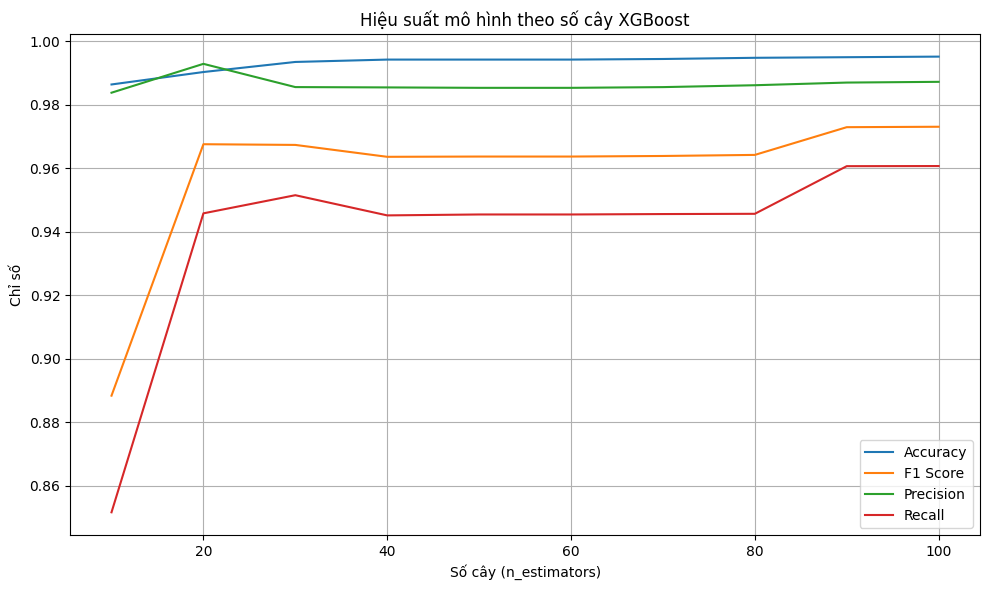


📊 Kết quả mô hình cuối cùng:
Accuracy : 0.9951
Precision: 0.9872
Recall   : 0.9607
F1-score : 0.9731
⏱ Thời gian train: 2.3518s
⏱ Thời gian test : 0.0374s

📄 Classification Report (Test set):
              precision    recall  f1-score   support

           0     0.9967    0.9964    0.9966      3645
           1     0.9949    0.9924    0.9936       393
           2     0.9444    0.8947    0.9189        19
           3     0.9886    0.9951    0.9918       609
           4     1.0000    0.8571    0.9231         7
           5     0.9881    0.9960    0.9921       251
           6     0.9977    0.9931    0.9954       436

    accuracy                         0.9951      5360
   macro avg     0.9872    0.9607    0.9731      5360
weighted avg     0.9951    0.9951    0.9951      5360



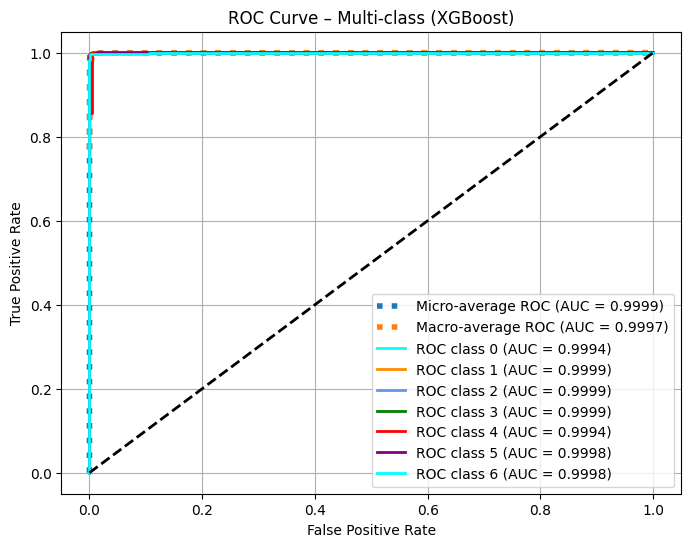

In [66]:
model_xgb_cgan_1_5 = train_and_evaluate_xgb_epochs(X_cgan, y_cgan, X_test, y_test)

In [13]:
vae_df_1_3 = pd.read_csv("/kaggle/input/vae-1-3/generated_vae_3.csv")
X_vae_1_3, y_vae_1_3 = split_X_y(vae_df_1_3)


📊 Phân bố nhãn TRAIN:
label
0    14580
1     7719
2     6223
3     8579
4     6175
5     7150
6     7890
Name: count, dtype: int64

📊 Phân bố nhãn TEST:
Label
0    3645
1     393
2      19
3     609
4       7
5     251
6     436
Name: count, dtype: int64
[10 trees] Train: 0.2359s | Test: 0.0063s
[20 trees] Train: 0.3952s | Test: 0.0101s
[30 trees] Train: 0.5683s | Test: 0.0144s
[40 trees] Train: 0.7306s | Test: 0.0178s
[50 trees] Train: 0.9013s | Test: 0.0214s
[60 trees] Train: 1.0581s | Test: 0.0246s
[70 trees] Train: 1.3087s | Test: 0.0279s
[80 trees] Train: 1.3535s | Test: 0.0308s
[90 trees] Train: 1.4716s | Test: 0.0338s
[100 trees] Train: 1.6206s | Test: 0.0371s


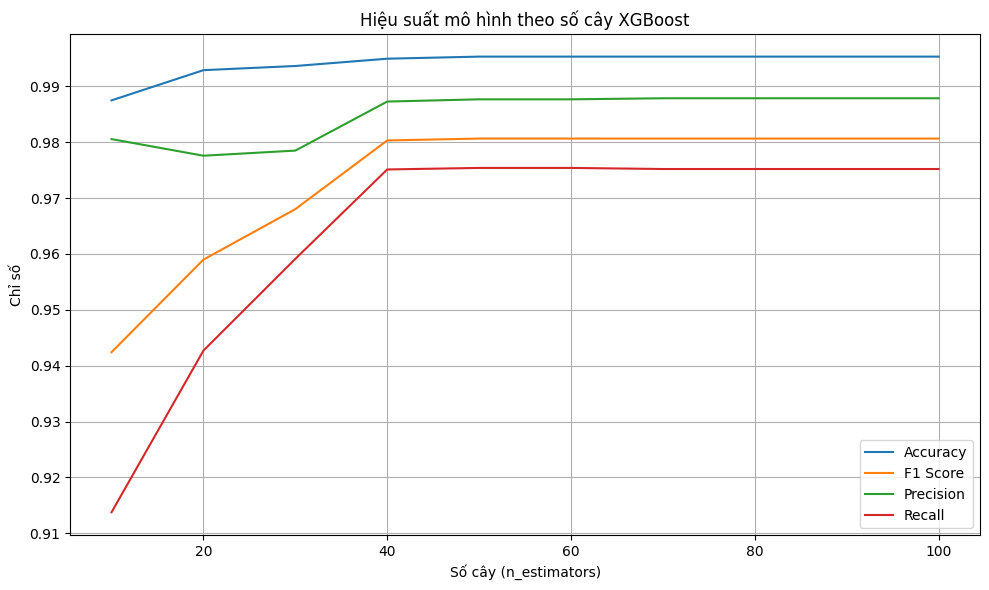


📊 Kết quả mô hình cuối cùng:
Accuracy : 0.9953
Precision: 0.9879
Recall   : 0.9752
F1-score : 0.9807
⏱ Thời gian train: 1.6147s
⏱ Thời gian test : 0.0366s

📄 Classification Report (Test set):
              precision    recall  f1-score   support

           0     0.9970    0.9967    0.9968      3645
           1     0.9898    0.9924    0.9911       393
           2     0.9500    1.0000    0.9744        19
           3     0.9902    0.9934    0.9918       609
           4     1.0000    0.8571    0.9231         7
           5     0.9881    0.9960    0.9921       251
           6     1.0000    0.9908    0.9954       436

    accuracy                         0.9953      5360
   macro avg     0.9879    0.9752    0.9807      5360
weighted avg     0.9954    0.9953    0.9953      5360



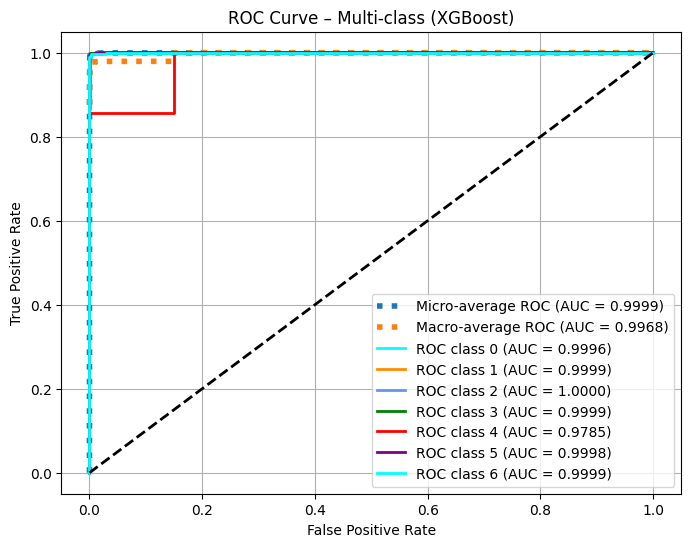

In [17]:
model_xgb_vae_1_3 = train_and_evaluate_xgb_epochs(X_vae_1_3, y_vae_1_3, X_test, y_test)

In [23]:
import numpy as np
import pandas as pd

def predict_sample_by_label(model, X_test, y_test, target_label):
    """
    Chọn 1 mẫu trong X_test có nhãn = target_label
    và dự đoán lại bằng model
    """

    # 1️⃣ Tìm index của mẫu có nhãn mong muốn
    idx_list = y_test[y_test == target_label].index

    if len(idx_list) == 0:
        print(f"❌ Không tìm thấy mẫu nào có nhãn = {target_label}")
        return

    idx = idx_list[0]

    # 2️⃣ Lấy dữ liệu
    X_input = X_test.loc[[idx]]   # giữ DataFrame
    y_true = y_test.loc[idx]

    # 3️⃣ Dự đoán
    y_pred = model.predict(X_input)[0]
    y_proba = model.predict_proba(X_input)[0]
    classes = model.classes_

    # 4️⃣ In kết quả
    print("🔎 KẾT QUẢ DỰ ĐOÁN")
    print(f"• Nhãn thật    : {y_true}")
    print(f"• Nhãn dự đoán : {y_pred}")
    print(f"• Độ tin cậy  : {np.max(y_proba):.4%}")

    # 5️⃣ In bảng xác suất đẹp
    df_proba = pd.DataFrame({
        "Class": classes,
        "Probability": np.round(y_proba, 6)
    })

    print("\n📊 Phân bố xác suất:")
    print(df_proba)


In [30]:
predict_sample_by_label(
    model=model_xgb_vae_1_3,
    X_test=X_test,
    y_test=y_test,
    target_label=2
)

🔎 KẾT QUẢ DỰ ĐOÁN
• Nhãn thật    : 2
• Nhãn dự đoán : 2
• Độ tin cậy  : 96.8086%

📊 Phân bố xác suất:
   Class  Probability
0      0     0.030753
1      1     0.000007
2      2     0.968086
3      3     0.000041
4      4     0.000031
5      5     0.000011
6      6     0.001072
